# Telecom Churn case study
***

# Problem Statement

## Business problem overview
In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn.

## Business Understanding

**Definitions of churn**

Usage-based churn: Customers who have not done any usage, either incoming or outgoing - in terms of calls, internet etc. over a period of time.

A potential shortcoming of this definition is that when the customer has stopped using the services for a while, it may be too late to take any corrective actions to retain them. For e.g., if you define churn based on a ‘two-months zero usage’ period, predicting churn could be useless since by that time the customer would have already switched to another operator.

**High-value churn**

In the Indian and the Southeast Asian market, approximately 80% of revenue comes from the top 20% customers (called high-value customers). Thus, if we can reduce churn of the high-value customers, we will be able to reduce significant revenue leakage.

 

In this project, you will define high-value customers based on a certain metric (mentioned later below) and predict churn only on high-value customers.

 

**Understanding the business objective and the data**

The dataset contains customer-level information for a span of four consecutive months - **June, July, August and September**. The months are encoded as 6, 7, 8 and 9, respectively. 

The business objective is to predict the churn in the last (i.e. the ninth) month using the data (features) from the first three months. To do this task well, understanding the typical customer behaviour during churn will be helpful.

**Understanding customer behaviour during churn**

Customers usually do not decide to switch to another competitor instantly, but rather over a period of time (this is especially applicable to high-value customers). In churn prediction, we assume that there are three phases of customer lifecycle :

- **The ‘good’ phase**: In this phase, the customer is happy with the service and behaves as usual.

- **The ‘action’ phase**: The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a  competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. Also, it is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

- **The ‘churn’ phase**: In this phase, the customer is said to have churned. You define churn based on this phase. Also, it is important to note that at the time of prediction (i.e. the action months), this data is not available to you for prediction. Thus, after tagging churn as 1/0 based on this phase, you discard all data corresponding to this phase.

In this case, since you are working over a four-month window, the **first two months** are the ‘good’ phase, **the third month** is the ‘action’ phase, while the **fourth month** is the ‘churn’ phase.

## Objective
1. Model to predict whether a high-value customer will churn or not, in near future (i.e. churn phase). By knowing this, the company can take action steps such as providing special plans, discounts on recharge etc.

2. Model for identifying important features that are strong predictors of churn. These variables may also indicate why customers choose to switch to other networks. After identifying important predictors, display them in the best way to convey the importance of features.

3. Finally, recommend strategies to manage customer churn based on observations.

***
# Outline

### 1. Import libraries and read data

### 2. Data quality check
- Handle missing values
- Handle data type
- Remove unnecessary variables

### 3. Identify churners among high value customers
- Identify high value customers (recharge amount > 70th percentile)
- Identify churners based on the lack of usage in the 4th month

### 4. EDA
- Identify outliers
- Trend in usage over time
- Correlation between features

### 5. Derive additional features for identifying churners
- Change in net usage
- Change in usage percentage
- Non-linear transform data to reduce extreme values/outliers

### 6. Train test split
- Split the data
- Apply feature scaling
### 7. Principal components analysis
- Perform PCA
- Identify the number of PCs for model building

### 8. Model for predicting churners
- Apply techniques for handling data imbalance: SMOTE, ADASYN
- Build various models: Logistic regression, Random forest, AdaBoost, XGBoost.
- Hyperparameter tuning and adjusting optimal threshold
- Compare model performance and choose final model

### 9. Model for identifying important features
- Build and tuning models for identifying important features

### 10. Business recommendation
- Signs of churners
- Reasons for churning
- Strategies for managing churning
- Model recommendation
***

# 1. Import libraries and data

## Import packages

In [1]:
import numpy as np, pandas as pd
import seaborn as sns, matplotlib.pyplot as plt
import matplotlib

# all columns, limit 200 rows
pd.set_option("display.max_columns", None) 
pd.set_option("display.max_rows", 200)

In [2]:
import scipy
from scipy import stats

# data transformation
from scipy.special import boxcox1p

# train test split, cross validation
import sklearn
from sklearn.model_selection import train_test_split, StratifiedKFold, cross_validate, cross_val_score, cross_val_predict
# Scaler
from sklearn.preprocessing import MinMaxScaler, StandardScaler

# handling imbalance
import imblearn
from imblearn.over_sampling import SMOTE,ADASYN

# PCA
from sklearn.decomposition import PCA

# classification model
from sklearn.linear_model import LogisticRegression 
import statsmodels
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier, plot_tree
import xgboost
from xgboost import XGBClassifier

# randomsearch
from sklearn.model_selection import RandomizedSearchCV

# metrics
from sklearn import metrics
from sklearn.metrics import ( 
    f1_score, 
    accuracy_score, 
    recall_score, 
    precision_score, 
    confusion_matrix, 
    roc_auc_score, 
    roc_curve,
    plot_confusion_matrix, 
    classification_report, 
    precision_recall_curve,
    make_scorer,
) 

import warnings

In [3]:
from platform import python_version

# Compare currently installed versions
print('Compare current versions of installed libraries to the ones used to create this notebook:')
print(f'Current Python version: {python_version()}')
print('Used Python version   : 3.9.15', end=' ')
print('----> Matched.') if python_version() == '3.9.15' else print('----> Not matched.')   
print('*'*70)
used_library_version = [
    (pd, 'Pandas','1.5.2'), 
    (np,'Numpy','1.22.3'), 
    (matplotlib, 'Matplotlib','3.6.3'), 
    (sns, 'Seaborn','0.12.1'),
    (sklearn, 'sklearn', '1.1.3'),
    (statsmodels, 'statsmodels' ,'0.13.2'),
    (scipy, 'scipy', '1.7.3'),
    (imblearn, 'imblearn', '0.9.1'),
    (xgboost, 'xgboost', '1.7.5')
]

compare_version = pd.DataFrame({
    '  Library':        [lib_name                    for lib, lib_name, used_ver in used_library_version],
    '  Installed ver.': [lib.__version__             for lib, lib_name, used_ver in used_library_version],
    '  Used ver.':      [used_ver                    for lib, lib_name, used_ver in used_library_version],
    '  Version match?': [lib.__version__ == used_ver for lib, lib_name, used_ver in used_library_version]
    })
print(compare_version)

Compare current versions of installed libraries to the ones used to create this notebook:
Current Python version: 3.9.15
Used Python version   : 3.9.15 ----> Matched.
**********************************************************************
       Library   Installed ver.   Used ver.    Version match?
0       Pandas            1.5.2       1.5.2              True
1        Numpy           1.22.3      1.22.3              True
2   Matplotlib            3.6.3       3.6.3              True
3      Seaborn           0.12.1      0.12.1              True
4      sklearn            1.1.3       1.1.3              True
5  statsmodels           0.13.2      0.13.2              True
6        scipy            1.7.3       1.7.3              True
7     imblearn            0.9.1       0.9.1              True
8      xgboost            1.7.5       1.7.5              True


- For precaution, I tried to use the most up-to-date method and avoided using soon-to-be deprecated syntax (as stated by FutureWarning if encountered) to the best of my ability, with libraries version mentioned above.
- In the very rare case that you run into any error, please try updating/reverting your libraries' versions to the "Used ver." listed above, as older or newer libraries version might have unsupported/deprecated syntax (especially for Matplotlib and Seaborn).

## Import dataset

In [4]:
# import data
df = pd.read_csv('telecom_churn_data.csv')
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,last_date_of_month_9,arpu_6,arpu_7,arpu_8,arpu_9,onnet_mou_6,onnet_mou_7,onnet_mou_8,onnet_mou_9,offnet_mou_6,offnet_mou_7,offnet_mou_8,offnet_mou_9,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_ic_mou_9,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,roam_og_mou_9,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2t_mou_9,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2m_mou_9,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2f_mou_9,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_t2c_mou_9,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,loc_og_mou_9,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2t_mou_9,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2m_mou_9,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2f_mou_9,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_t2c_mou_9,std_og_mou_6,std_og_mou_7,std_og_mou_8,std_og_mou_9,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,isd_og_mou_9,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,spl_og_mou_9,og_others_6,og_others_7,og_others_8,og_others_9,total_og_mou_6,total_og_mou_7,total_og_mou_8,total_og_mou_9,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2t_mou_9,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2m_mou_9,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_t2f_mou_9,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,loc_ic_mou_9,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2t_mou_9,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2m_mou_9,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2f_mou_9,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_t2o_mou_9,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,std_ic_mou_9,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,total_ic_mou_9,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,spl_ic_mou_9,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,isd_ic_mou_9,ic_others_6,ic_others_7,ic_others_8,ic_others_9,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_num_9,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,total_rech_amt_9,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,max_rech_amt_9,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,date_of_last_rech_9,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,last_day_rch_amt_9,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,date_of_last_rech_data_9,total_rech_data_6,total_rech_data_7,total_rech_data_8,total_rech_data_9,max_rech_data_6,max_rech_data_7,max_rech_data_8,max_rech_data_9,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_2g_9,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,count_rech_3g_9,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,av_rech_amt_data_9,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_2g_mb_9,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,vol_3g_mb_9,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_3g_9,arpu_2g_6,arpu_2g_7,arpu_2g_8,arpu_2g_9,night_pck_user_6,night_pck_user_7,night_pck_user_8,night_pck_user_9,monthly_2g_6,monthly_2g_7,monthly_2g_8,monthly_2g_9,sachet_2g_6,sachet_2g_7,sachet_2g_8,sachet_2g_9,monthly_3g_6,monthly_3g_7,monthly_3g_8,monthly_3g_9,sachet_3g_6,sachet_3g_7,sachet_3g_8,sachet_3g_9,fb_user_6,fb_user_7,fb_user_8,fb_user_9,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,sep_vbc_3g
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,

**Features dictionary**

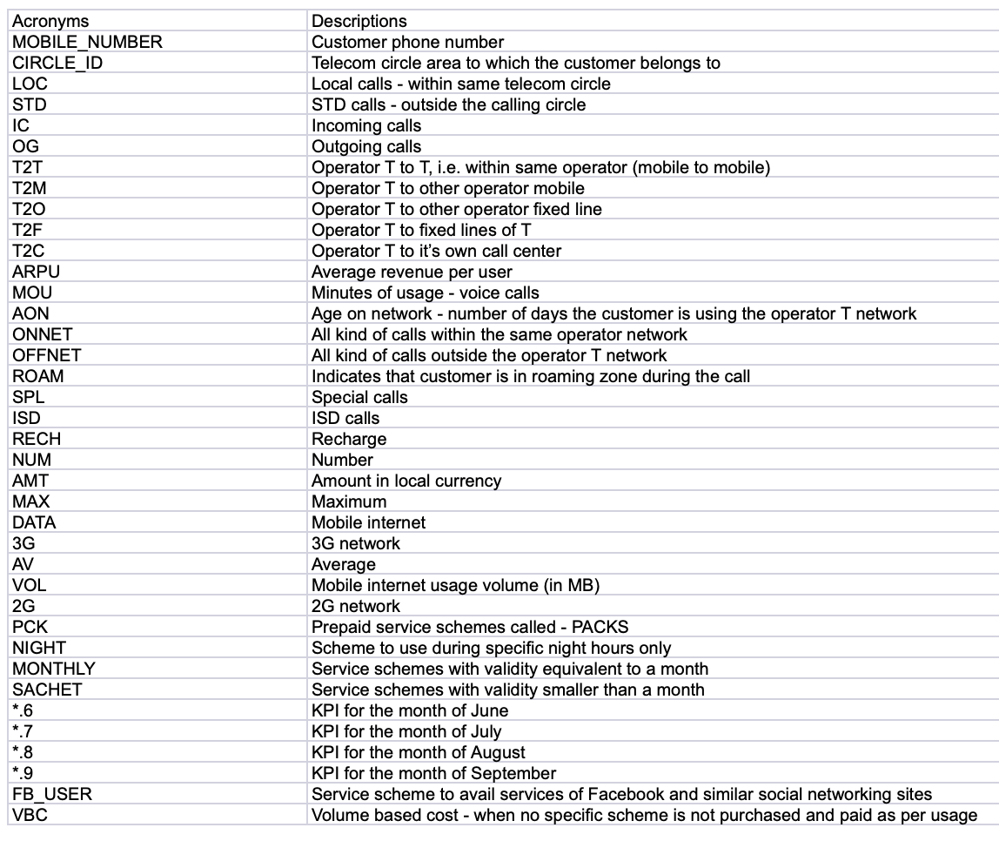

Shape

In [5]:
df.shape

(99999, 226)

There are 226 features

# 2. Data quality check

## Rename columns

- Rename 6,7,8,9 to 1,2,3,4 so that we can refer to these columns as the 1st, 2nd, 3rd and 4th month

In [6]:
pattern_search = ['_6', '_7', '_8', '_9']
replace_with = ['_1', '_2', '_3', '_4']

for pattern, replace in zip(pattern_search,replace_with):
    df.columns = [name[:-2]+replace if name[-2:] == pattern else name for name in df.columns]

In [7]:
# rename sneaky non-standard columns:
df.rename(columns={
    'sep_vbc_3g': 'vbc_3g_4',
    'aug_vbc_3g': 'vbc_3g_3',
    'jul_vbc_3g': 'vbc_3g_2',
    'jun_vbc_3g': 'vbc_3g_1'    
}, inplace=True)

In [8]:
df.head()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_1,last_date_of_month_2,last_date_of_month_3,last_date_of_month_4,arpu_1,arpu_2,arpu_3,arpu_4,onnet_mou_1,onnet_mou_2,onnet_mou_3,onnet_mou_4,offnet_mou_1,offnet_mou_2,offnet_mou_3,offnet_mou_4,roam_ic_mou_1,roam_ic_mou_2,roam_ic_mou_3,roam_ic_mou_4,roam_og_mou_1,roam_og_mou_2,roam_og_mou_3,roam_og_mou_4,loc_og_t2t_mou_1,loc_og_t2t_mou_2,loc_og_t2t_mou_3,loc_og_t2t_mou_4,loc_og_t2m_mou_1,loc_og_t2m_mou_2,loc_og_t2m_mou_3,loc_og_t2m_mou_4,loc_og_t2f_mou_1,loc_og_t2f_mou_2,loc_og_t2f_mou_3,loc_og_t2f_mou_4,loc_og_t2c_mou_1,loc_og_t2c_mou_2,loc_og_t2c_mou_3,loc_og_t2c_mou_4,loc_og_mou_1,loc_og_mou_2,loc_og_mou_3,loc_og_mou_4,std_og_t2t_mou_1,std_og_t2t_mou_2,std_og_t2t_mou_3,std_og_t2t_mou_4,std_og_t2m_mou_1,std_og_t2m_mou_2,std_og_t2m_mou_3,std_og_t2m_mou_4,std_og_t2f_mou_1,std_og_t2f_mou_2,std_og_t2f_mou_3,std_og_t2f_mou_4,std_og_t2c_mou_1,std_og_t2c_mou_2,std_og_t2c_mou_3,std_og_t2c_mou_4,std_og_mou_1,std_og_mou_2,std_og_mou_3,std_og_mou_4,isd_og_mou_1,isd_og_mou_2,isd_og_mou_3,isd_og_mou_4,spl_og_mou_1,spl_og_mou_2,spl_og_mou_3,spl_og_mou_4,og_others_1,og_others_2,og_others_3,og_others_4,total_og_mou_1,total_og_mou_2,total_og_mou_3,total_og_mou_4,loc_ic_t2t_mou_1,loc_ic_t2t_mou_2,loc_ic_t2t_mou_3,loc_ic_t2t_mou_4,loc_ic_t2m_mou_1,loc_ic_t2m_mou_2,loc_ic_t2m_mou_3,loc_ic_t2m_mou_4,loc_ic_t2f_mou_1,loc_ic_t2f_mou_2,loc_ic_t2f_mou_3,loc_ic_t2f_mou_4,loc_ic_mou_1,loc_ic_mou_2,loc_ic_mou_3,loc_ic_mou_4,std_ic_t2t_mou_1,std_ic_t2t_mou_2,std_ic_t2t_mou_3,std_ic_t2t_mou_4,std_ic_t2m_mou_1,std_ic_t2m_mou_2,std_ic_t2m_mou_3,std_ic_t2m_mou_4,std_ic_t2f_mou_1,std_ic_t2f_mou_2,std_ic_t2f_mou_3,std_ic_t2f_mou_4,std_ic_t2o_mou_1,std_ic_t2o_mou_2,std_ic_t2o_mou_3,std_ic_t2o_mou_4,std_ic_mou_1,std_ic_mou_2,std_ic_mou_3,std_ic_mou_4,total_ic_mou_1,total_ic_mou_2,total_ic_mou_3,total_ic_mou_4,spl_ic_mou_1,spl_ic_mou_2,spl_ic_mou_3,spl_ic_mou_4,isd_ic_mou_1,isd_ic_mou_2,isd_ic_mou_3,isd_ic_mou_4,ic_others_1,ic_others_2,ic_others_3,ic_others_4,total_rech_num_1,total_rech_num_2,total_rech_num_3,total_rech_num_4,total_rech_amt_1,total_rech_amt_2,total_rech_amt_3,total_rech_amt_4,max_rech_amt_1,max_rech_amt_2,max_rech_amt_3,max_rech_amt_4,date_of_last_rech_1,date_of_last_rech_2,date_of_last_rech_3,date_of_last_rech_4,last_day_rch_amt_1,last_day_rch_amt_2,last_day_rch_amt_3,last_day_rch_amt_4,date_of_last_rech_data_1,date_of_last_rech_data_2,date_of_last_rech_data_3,date_of_last_rech_data_4,total_rech_data_1,total_rech_data_2,total_rech_data_3,total_rech_data_4,max_rech_data_1,max_rech_data_2,max_rech_data_3,max_rech_data_4,count_rech_2g_1,count_rech_2g_2,count_rech_2g_3,count_rech_2g_4,count_rech_3g_1,count_rech_3g_2,count_rech_3g_3,count_rech_3g_4,av_rech_amt_data_1,av_rech_amt_data_2,av_rech_amt_data_3,av_rech_amt_data_4,vol_2g_mb_1,vol_2g_mb_2,vol_2g_mb_3,vol_2g_mb_4,vol_3g_mb_1,vol_3g_mb_2,vol_3g_mb_3,vol_3g_mb_4,arpu_3g_1,arpu_3g_2,arpu_3g_3,arpu_3g_4,arpu_2g_1,arpu_2g_2,arpu_2g_3,arpu_2g_4,night_pck_user_1,night_pck_user_2,night_pck_user_3,night_pck_user_4,monthly_2g_1,monthly_2g_2,monthly_2g_3,monthly_2g_4,sachet_2g_1,sachet_2g_2,sachet_2g_3,sachet_2g_4,monthly_3g_1,monthly_3g_2,monthly_3g_3,monthly_3g_4,sachet_3g_1,sachet_3g_2,sachet_3g_3,sachet_3g_4,fb_user_1,fb_user_2,fb_user_3,fb_user_4,aon,vbc_3g_3,vbc_3g_2,vbc_3g_1,vbc_3g_4
0,7000842753,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,197.385,214.816,213.803,21.100,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,0.00,0.00,0.00,0.00,NaN,NaN,0.16,NaN,NaN,NaN,4.13,NaN,NaN,NaN,1.15,NaN,NaN,NaN,5.44,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.00,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.00,NaN,0.00,0.00,5.44,0.00,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,NaN,NaN,0.0,NaN,4,3,2,6,362,

## Missing values handling

### Features with high percentage of missing values

In [9]:
#Features with high missing values percentage

missing_values = df.isna().sum()/len(df)

missing_values[missing_values>0.4]

date_of_last_rech_data_1    0.748467
date_of_last_rech_data_2    0.744287
date_of_last_rech_data_3    0.736607
date_of_last_rech_data_4    0.740777
total_rech_data_1           0.748467
total_rech_data_2           0.744287
total_rech_data_3           0.736607
total_rech_data_4           0.740777
max_rech_data_1             0.748467
max_rech_data_2             0.744287
max_rech_data_3             0.736607
max_rech_data_4             0.740777
count_rech_2g_1             0.748467
count_rech_2g_2             0.744287
count_rech_2g_3             0.736607
count_rech_2g_4             0.740777
count_rech_3g_1             0.748467
count_rech_3g_2             0.744287
count_rech_3g_3             0.736607
count_rech_3g_4             0.740777
av_rech_amt_data_1          0.748467
av_rech_amt_data_2          0.744287
av_rech_amt_data_3          0.736607
av_rech_amt_data_4          0.740777
arpu_3g_1                   0.748467
arpu_3g_2                   0.744287
arpu_3g_3                   0.736607
a

In [10]:
# Drop feature with high missing values percentage
df = df.drop(columns = missing_values[missing_values>0.4].index.tolist())

### Investigate features with low percentage of NA

In [11]:
# what is the highest percentage
missing_values = df.isna().sum()/len(df)

missing_values[missing_values>0].describe()

count    126.000000
mean       0.049589
std        0.018115
min        0.006010
25%        0.038590
50%        0.039370
75%        0.053781
max        0.077451
dtype: float64

In [12]:
# How many entries have at least 1 missing values
NA_heatmap = df.isna().copy()
NA_heatmap['has_NA'] = NA_heatmap.sum(axis=1)
(NA_heatmap['has_NA']>0).value_counts()

False    84185
True     15814
Name: has_NA, dtype: int64

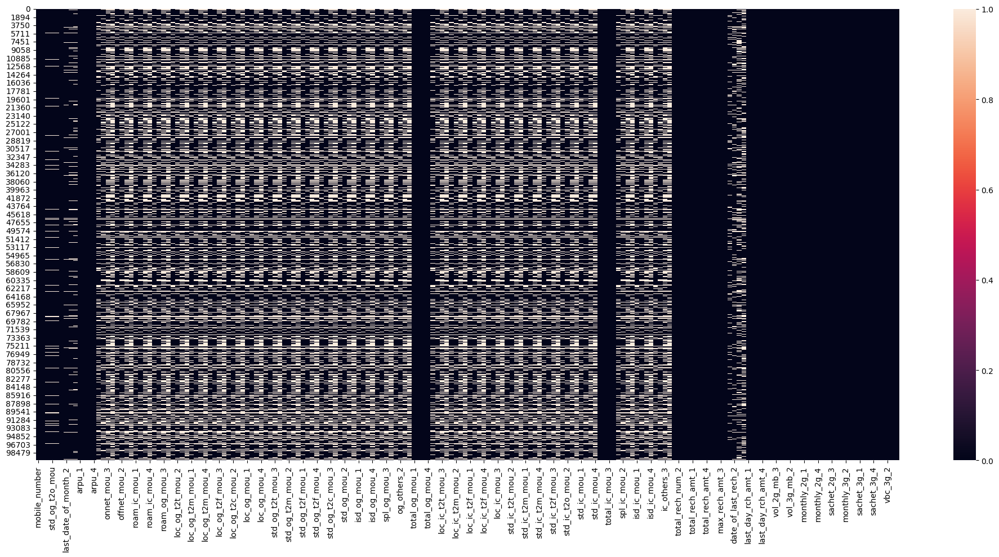

In [13]:
# missing values pattern
plt.figure(figsize=(20,10))
sns.heatmap(NA_heatmap[NA_heatmap['has_NA']>0].drop(columns='has_NA'))
plt.tight_layout()
plt.show()

<AxesSubplot: xlabel='has_NA', ylabel='Count'>

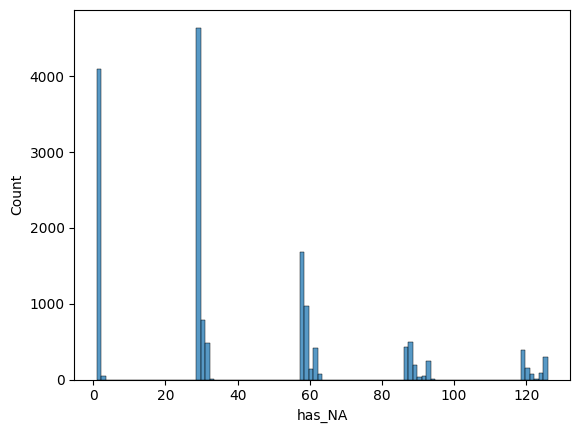

In [14]:
# distribution of missing values per entries?
sns.histplot(x=NA_heatmap.has_NA[NA_heatmap.has_NA>0], bins=100)

In [15]:
# features with missing values
missing_values[missing_values>0]

loc_og_t2o_mou          0.010180
std_og_t2o_mou          0.010180
loc_ic_t2o_mou          0.010180
last_date_of_month_2    0.006010
last_date_of_month_3    0.011000
last_date_of_month_4    0.016590
onnet_mou_1             0.039370
onnet_mou_2             0.038590
onnet_mou_3             0.053781
onnet_mou_4             0.077451
offnet_mou_1            0.039370
offnet_mou_2            0.038590
offnet_mou_3            0.053781
offnet_mou_4            0.077451
roam_ic_mou_1           0.039370
roam_ic_mou_2           0.038590
roam_ic_mou_3           0.053781
roam_ic_mou_4           0.077451
roam_og_mou_1           0.039370
roam_og_mou_2           0.038590
roam_og_mou_3           0.053781
roam_og_mou_4           0.077451
loc_og_t2t_mou_1        0.039370
loc_og_t2t_mou_2        0.038590
loc_og_t2t_mou_3        0.053781
loc_og_t2t_mou_4        0.077451
loc_og_t2m_mou_1        0.039370
loc_og_t2m_mou_2        0.038590
loc_og_t2m_mou_3        0.053781
loc_og_t2m_mou_4        0.077451
loc_og_t2f

In [16]:
# What are their datatype?
df[missing_values[missing_values>0].index.tolist()].info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99999 entries, 0 to 99998
Columns: 126 entries, loc_og_t2o_mou to date_of_last_rech_4
dtypes: float64(119), object(7)
memory usage: 96.1+ MB


#### Numerical features

For the numerical features, missing values are likely to because of a lack of action/usage. The missing values should be imputed with 0.

In [17]:
## Impute nan in numerical columns with 0

# make the list of numerical column that has missing values
num_columns_with_NA = df[missing_values[missing_values>0].index].select_dtypes(np.number).columns

# impute numerical features with mean
df[num_columns_with_NA] = df[num_columns_with_NA].fillna(0)

#### Date time features

In [18]:
# string columns with missing values
string_columns_with_NA = df[missing_values[missing_values>0].index].select_dtypes('object').columns
df[string_columns_with_NA]

,last_date_of_month_2,last_date_of_month_3,last_date_of_month_4,date_of_last_rech_1,date_of_last_rech_2,date_of_last_rech_3,date_of_last_rech_4
0,7/31/2014,8/31/2014,9/30/2014,6/21/2014,7/16/2014,8/8/2014,9/28/2014
1,7/31/2014,8/31/2014,9/30/2014,6/29/2014,7/31/2014,8/28/2014,9/30/2014
2,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/24/2014,8/14/2014,9/29/2014
3,7/31/2014,8/31/2014,9/30/2014,6/28/2014,7/31/2014,8/31/2014,9/30/2014
4,7/31/2014,8/31/2014,9/30/2014,6/26/2014,7/28/2014,8/9/2014,9/28/2014
...,...,...,...,...,...,...,...
99994,7/31/2014,8/31/2014,9/30/2014,6/3/2014,7/20/2014,8/26/2014,9/25/2014
99995,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/17/2014,8/24/2014,9/26/2014
99996,7/31/2014,8/31/2014,9/30/2014,6/13/2014,7/26/2014,NaN,9/2/2014
99997,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/19/2014,8/20/2014,9/17/2014


In [19]:
# view date columns
date_cols = df.filter(like='date').columns
df[date_cols].head()

,last_date_of_month_1,last_date_of_month_2,last_date_of_month_3,last_date_of_month_4,date_of_last_rech_1,date_of_last_rech_2,date_of_last_rech_3,date_of_last_rech_4
0,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/21/2014,7/16/2014,8/8/2014,9/28/2014
1,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/29/2014,7/31/2014,8/28/2014,9/30/2014
2,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/17/2014,7/24/2014,8/14/2014,9/29/2014
3,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/28/2014,7/31/2014,8/31/2014,9/30/2014
4,6/30/2014,7/31/2014,8/31/2014,9/30/2014,6/26/2014,7/28/2014,8/9/2014,9/28/2014


In [20]:
# convert to datetime format
df[date_cols] = df[date_cols].apply(pd.to_datetime)
df[date_cols].head()

,last_date_of_month_1,last_date_of_month_2,last_date_of_month_3,last_date_of_month_4,date_of_last_rech_1,date_of_last_rech_2,date_of_last_rech_3,date_of_last_rech_4
0,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-21,2014-07-16,2014-08-08,2014-09-28
1,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-29,2014-07-31,2014-08-28,2014-09-30
2,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-17,2014-07-24,2014-08-14,2014-09-29
3,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-28,2014-07-31,2014-08-31,2014-09-30
4,2014-06-30,2014-07-31,2014-08-31,2014-09-30,2014-06-26,2014-07-28,2014-08-09,2014-09-28


In [21]:
# convert from date to day
df[date_cols] = df[date_cols].apply(lambda x: x.dt.day)
df[date_cols].head()

,last_date_of_month_1,last_date_of_month_2,last_date_of_month_3,last_date_of_month_4,date_of_last_rech_1,date_of_last_rech_2,date_of_last_rech_3,date_of_last_rech_4
0,30,31.0,31.0,30.0,21.0,16.0,8.0,28.0
1,30,31.0,31.0,30.0,29.0,31.0,28.0,30.0
2,30,31.0,31.0,30.0,17.0,24.0,14.0,29.0
3,30,31.0,31.0,30.0,28.0,31.0,31.0,30.0
4,30,31.0,31.0,30.0,26.0,28.0,9.0,28.0


For the date features, missing values are likely to because of a lack of occurrence. The missing values should be imputed with 0.

In [22]:
# fill missing value with 0
df[date_cols] = df[date_cols].fillna(0)

## Outliers

Outliers will be handled after creating the subset of high value customers. HVC tends to have higher overall usage and their outliers can be different from the general data.

## Last check

In [23]:
df.describe()

,mobile_number,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_1,last_date_of_month_2,last_date_of_month_3,last_date_of_month_4,arpu_1,arpu_2,arpu_3,arpu_4,onnet_mou_1,onnet_mou_2,onnet_mou_3,onnet_mou_4,offnet_mou_1,offnet_mou_2,offnet_mou_3,offnet_mou_4,roam_ic_mou_1,roam_ic_mou_2,roam_ic_mou_3,roam_ic_mou_4,roam_og_mou_1,roam_og_mou_2,roam_og_mou_3,roam_og_mou_4,loc_og_t2t_mou_1,loc_og_t2t_mou_2,loc_og_t2t_mou_3,loc_og_t2t_mou_4,loc_og_t2m_mou_1,loc_og_t2m_mou_2,loc_og_t2m_mou_3,loc_og_t2m_mou_4,loc_og_t2f_mou_1,loc_og_t2f_mou_2,loc_og_t2f_mou_3,loc_og_t2f_mou_4,loc_og_t2c_mou_1,loc_og_t2c_mou_2,loc_og_t2c_mou_3,loc_og_t2c_mou_4,loc_og_mou_1,loc_og_mou_2,loc_og_mou_3,loc_og_mou_4,std_og_t2t_mou_1,std_og_t2t_mou_2,std_og_t2t_mou_3,std_og_t2t_mou_4,std_og_t2m_mou_1,std_og_t2m_mou_2,std_og_t2m_mou_3,std_og_t2m_mou_4,std_og_t2f_mou_1,std_og_t2f_mou_2,std_og_t2f_mou_3,std_og_t2f_mou_4,std_og_t2c_mou_1,std_og_t2c_mou_2,std_og_t2c_mou_3,std_og_t2c_mou_4,std_og_mou_1,std_og_mou_2,std_og_mou_3,std_og_mou_4,isd_og_mou_1,isd_og_mou_2,isd_og_mou_3,isd_og_mou_4,spl_og_mou_1,spl_og_mou_2,spl_og_mou_3,spl_og_mou_4,og_others_1,og_others_2,og_others_3,og_others_4,total_og_mou_1,total_og_mou_2,total_og_mou_3,total_og_mou_4,loc_ic_t2t_mou_1,loc_ic_t2t_mou_2,loc_ic_t2t_mou_3,loc_ic_t2t_mou_4,loc_ic_t2m_mou_1,loc_ic_t2m_mou_2,loc_ic_t2m_mou_3,loc_ic_t2m_mou_4,loc_ic_t2f_mou_1,loc_ic_t2f_mou_2,loc_ic_t2f_mou_3,loc_ic_t2f_mou_4,loc_ic_mou_1,loc_ic_mou_2,loc_ic_mou_3,loc_ic_mou_4,std_ic_t2t_mou_1,std_ic_t2t_mou_2,std_ic_t2t_mou_3,std_ic_t2t_mou_4,std_ic_t2m_mou_1,std_ic_t2m_mou_2,std_ic_t2m_mou_3,std_ic_t2m_mou_4,std_ic_t2f_mou_1,std_ic_t2f_mou_2,std_ic_t2f_mou_3,std_ic_t2f_mou_4,std_ic_t2o_mou_1,std_ic_t2o_mou_2,std_ic_t2o_mou_3,std_ic_t2o_mou_4,std_ic_mou_1,std_ic_mou_2,std_ic_mou_3,std_ic_mou_4,total_ic_mou_1,total_ic_mou_2,total_ic_mou_3,total_ic_mou_4,spl_ic_mou_1,spl_ic_mou_2,spl_ic_mou_3,spl_ic_mou_4,isd_ic_mou_1,isd_ic_mou_2,isd_ic_mou_3,isd_ic_mou_4,ic_others_1,ic_others_2,ic_others_3,ic_others_4,total_rech_num_1,total_rech_num_2,total_rech_num_3,total_rech_num_4,total_rech_amt_1,total_rech_amt_2,total_rech_amt_3,total_rech_amt_4,max_rech_amt_1,max_rech_amt_2,max_rech_amt_3,max_rech_amt_4,date_of_last_rech_1,date_of_last_rech_2,date_of_last_rech_3,date_of_last_rech_4,last_day_rch_amt_1,last_day_rch_amt_2,last_day_rch_amt_3,last_day_rch_amt_4,vol_2g_mb_1,vol_2g_mb_2,vol_2g_mb_3,vol_2g_mb_4,vol_3g_mb_1,vol_3g_mb_2,vol_3g_mb_3,vol_3g_mb_4,monthly_2g_1,monthly_2g_2,monthly_2g_3,monthly_2g_4,sachet_2g_1,sachet_2g_2,sachet_2g_3,sachet_2g_4,monthly_3g_1,monthly_3g_2,monthly_3g_3,monthly_3g_4,sachet_3g_1,sachet_3g_2,sachet_3g_3,sachet_3g_4,aon,vbc_3g_3,vbc_3g_2,vbc_3g_1,vbc_3g_4
count,9.999900e+04,99999.0,99999.0,99999.0,99999.0,99999.0,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.00000,99999.0,99999.0,99999.0,99999.0,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.000000,99999.

In [24]:
# Drop unnecessary or zero-variance columns:
to_drop = [
    'mobile_number', 'circle_id',
    'loc_og_t2o_mou','std_og_t2o_mou','loc_ic_t2o_mou',
    'last_date_of_month_1','last_date_of_month_2','last_date_of_month_3','last_date_of_month_4',
    'std_og_t2c_mou_1','std_og_t2c_mou_2','std_og_t2c_mou_3','std_og_t2c_mou_4',
    'std_ic_t2o_mou_1','std_ic_t2o_mou_2','std_ic_t2o_mou_3','std_ic_t2o_mou_4']
df = df.drop(columns = to_drop)

In [25]:
# missing values
df.isna().sum().sum()

0

# 3. Identify high-value customers and churners

## Filter high-value customers (HVC):
Those who have recharged with an amount more than or equal to 70th percentile of the average recharge amount in the first two months

In [26]:
# 70 percentile of recharge in the first 2 months
total_recharge = df[['total_rech_amt_1','total_rech_amt_2']].sum(axis=1)
total_recharge.quantile(.7)

737.0

In [27]:
# the assignment specifically stated that:
### "29.9k entries for [more than OR EQUAL to] >= 70th percentile"
# but the actual data has 
### [more than OR EQUAL to] >= 70th percentile: 30011 entries
### [only more than] > the 70th percentile: 29979 entries

df[total_recharge>=737].shape, df[total_recharge>737].shape

((30011, 169), (29979, 169))

In [28]:
# HIGH VALUE CUSTOMERS
df = df[total_recharge>=737]

# reset index to match the new data length
df = df.reset_index(drop=True)
print(f'Data shape: {df.shape[0]} entries, {df.shape[1]} features')
df.head(10)

Data shape: 30011 entries, 169 features


,arpu_1,arpu_2,arpu_3,arpu_4,onnet_mou_1,onnet_mou_2,onnet_mou_3,onnet_mou_4,offnet_mou_1,offnet_mou_2,offnet_mou_3,offnet_mou_4,roam_ic_mou_1,roam_ic_mou_2,roam_ic_mou_3,roam_ic_mou_4,roam_og_mou_1,roam_og_mou_2,roam_og_mou_3,roam_og_mou_4,loc_og_t2t_mou_1,loc_og_t2t_mou_2,loc_og_t2t_mou_3,loc_og_t2t_mou_4,loc_og_t2m_mou_1,loc_og_t2m_mou_2,loc_og_t2m_mou_3,loc_og_t2m_mou_4,loc_og_t2f_mou_1,loc_og_t2f_mou_2,loc_og_t2f_mou_3,loc_og_t2f_mou_4,loc_og_t2c_mou_1,loc_og_t2c_mou_2,loc_og_t2c_mou_3,loc_og_t2c_mou_4,loc_og_mou_1,loc_og_mou_2,loc_og_mou_3,loc_og_mou_4,std_og_t2t_mou_1,std_og_t2t_mou_2,std_og_t2t_mou_3,std_og_t2t_mou_4,std_og_t2m_mou_1,std_og_t2m_mou_2,std_og_t2m_mou_3,std_og_t2m_mou_4,std_og_t2f_mou_1,std_og_t2f_mou_2,std_og_t2f_mou_3,std_og_t2f_mou_4,std_og_mou_1,std_og_mou_2,std_og_mou_3,std_og_mou_4,isd_og_mou_1,isd_og_mou_2,isd_og_mou_3,isd_og_mou_4,spl_og_mou_1,spl_og_mou_2,spl_og_mou_3,spl_og_mou_4,og_others_1,og_others_2,og_others_3,og_others_4,total_og_mou_1,total_og_mou_2,total_og_mou_3,total_og_mou_4,loc_ic_t2t_mou_1,loc_ic_t2t_mou_2,loc_ic_t2t_mou_3,loc_ic_t2t_mou_4,loc_ic_t2m_mou_1,loc_ic_t2m_mou_2,loc_ic_t2m_mou_3,loc_ic_t2m_mou_4,loc_ic_t2f_mou_1,loc_ic_t2f_mou_2,loc_ic_t2f_mou_3,loc_ic_t2f_mou_4,loc_ic_mou_1,loc_ic_mou_2,loc_ic_mou_3,loc_ic_mou_4,std_ic_t2t_mou_1,std_ic_t2t_mou_2,std_ic_t2t_mou_3,std_ic_t2t_mou_4,std_ic_t2m_mou_1,std_ic_t2m_mou_2,std_ic_t2m_mou_3,std_ic_t2m_mou_4,std_ic_t2f_mou_1,std_ic_t2f_mou_2,std_ic_t2f_mou_3,std_ic_t2f_mou_4,std_ic_mou_1,std_ic_mou_2,std_ic_mou_3,std_ic_mou_4,total_ic_mou_1,total_ic_mou_2,total_ic_mou_3,total_ic_mou_4,spl_ic_mou_1,spl_ic_mou_2,spl_ic_mou_3,spl_ic_mou_4,isd_ic_mou_1,isd_ic_mou_2,isd_ic_mou_3,isd_ic_mou_4,ic_others_1,ic_others_2,ic_others_3,ic_others_4,total_rech_num_1,total_rech_num_2,total_rech_num_3,total_rech_num_4,total_rech_amt_1,total_rech_amt_2,total_rech_amt_3,total_rech_amt_4,max_rech_amt_1,max_rech_amt_2,max_rech_amt_3,max_rech_amt_4,date_of_last_rech_1,date_of_last_rech_2,date_of_last_rech_3,date_of_last_rech_4,last_day_rch_amt_1,last_day_rch_amt_2,last_day_rch_amt_3,last_day_rch_amt_4,vol_2g_mb_1,vol_2g_mb_2,vol_2g_mb_3,vol_2g_mb_4,vol_3g_mb_1,vol_3g_mb_2,vol_3g_mb_3,vol_3g_mb_4,monthly_2g_1,monthly_2g_2,monthly_2g_3,monthly_2g_4,sachet_2g_1,sachet_2g_2,sachet_2g_3,sachet_2g_4,monthly_3g_1,monthly_3g_2,monthly_3g_3,monthly_3g_4,sachet_3g_1,sachet_3g_2,sachet_3g_3,sachet_3g_4,aon,vbc_3g_3,vbc_3g_2,vbc_3g_1,vbc_3g_4
0,1069.180,1349.850,3171.480,500.000,57.84,54.68,52.29,0.00,453.43,567.16,325.91,0.00,16.23,33.49,31.64,0.00,23.74,12.59,38.06,0.00,51.39,31.38,40.28,0.00,308.63,447.38,162.28,0.00,62.13,55.14,53.23,0.00,0.00,0.0,0.00,0.00,422.16,533.91,255.79,0.00,4.30,23.29,12.01,0.00,49.89,31.76,49.14,0.00,6.66,20.08,16.68,0.00,60.86,75.14,77.84,0.00,0.00,0.18,10.01,0.00,4.50,0.00,6.50,0.00,0.00,0.0,0.0,0.0,487.53,609.24,350.16,0.00,58.14,32.26,27.31,0.00,217.56,221.49,121.19,0.00,152.16,101.46,39.53,0.00,427.88,355.23,188.04,0.00,36.89,11.83,30.39,0.00,91.44,126.99,141.33,0.00,52.19,34.24,22.21,0.00,180.54,173.08,193.94,0.00,626.46,558.04,428.74,0.00,0.21,0.0,0.0,0.00,2.06,14.53,31.59,0.00,15.74,15.19,15.14,0.00,5,5,7,3,1580,790,3638,0,1580,790,1580,0,27.0,25.0,26.0,30.0,0,0,779,0,0.00,0.00,0.00,0.00,0.0,0.00,0.00,0.00,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,802,57.74,19.38,18.74,0.0
1,378.721,492.223,137.362,166.787,413.69,351.03,35.08,33.46,94.66,80.63,136.48,108.71,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,297.13,217.59,12.49,26.13,80.96,70.58,50.54,34.58,0.00,0.00,0.00,0.00,0.00,0.0,7.15,0.00,378.09,288.18,63.04,60.71,116.56,133.43,22.58,7.33,13.69,10.04,75.69,74.13,0.00,0.00,0.00,0.00,130.26,143.48,98.28,81.46,0.00,0.00,0.00,0.00,0.00,0.00,10.23,0.00,0.00,0.0,0.0,0.0,508.36,431.66,171.56,142.18,23.84,9.84,0.31,4.03,57.58,13.98,15.48,17.34,0.00,0.00,0.00,0.00,81.43,23.83,15.79,21.38,0.00,0.58,0.10,0.00,22.43,4.08,0.65,13.53,0.00,0.00,0.00,0.00,22.43,4.66,0.75,13.53,103.86,28.49,16.54,34.91,0.00,0.0,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1

## Identify churners
- **Churner**: Those who have no incoming/outgoing calls and no mobile data usage in the 4th month (churn phase.)

- In technical term, those whose **total_ic_mou_4, total_og_mou_4, vol_2g_mb_4, vol_3g_mb_4** are all 0.

In [29]:
# total usage in churn phase
churn_phase_total_usage = df[['total_ic_mou_4', 'total_og_mou_4', 'vol_2g_mb_4', 'vol_3g_mb_4']].sum(axis=1)

# tag churner (whose usage == 0)
df['Churn'] = churn_phase_total_usage.apply(lambda x: 1 if x==0 else 0)

In [30]:
# see churn rate
df['Churn'].value_counts()

0    27418
1     2593
Name: Churn, dtype: int64

In [31]:
# Remove churn phase feature
df = df.drop(columns = df.filter(like='_4').columns)

# 4. EDA on high value customers

## Churn rate

<AxesSubplot: xlabel='Churn', ylabel='count'>

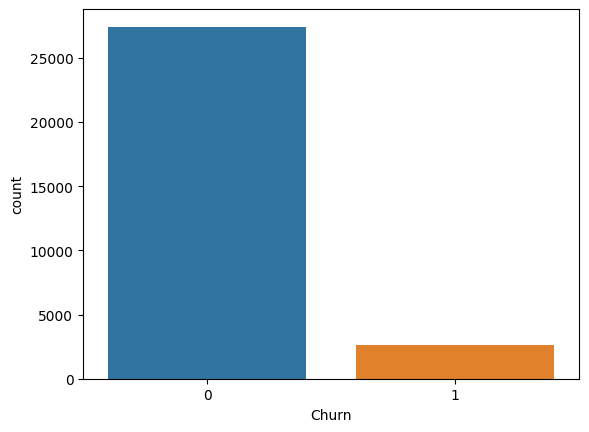

In [32]:
sns.countplot(x=df.Churn)

In [33]:
# see churn rate
df['Churn'].value_counts()

0    27418
1     2593
Name: Churn, dtype: int64

The churn rate is about 8.6% among high value customers.

## Outlier

In [34]:
# see outliers
# most features have max values that far larger than the 75th percentile, usually 10x, 20x more
df.describe().T

,count,mean,std,min,25%,50%,75%,max
arpu_1,30011.0,587.284404,442.722413,-2258.709,364.1610,495.682,703.922,27731.088
arpu_2,30011.0,589.135427,462.897814,-2014.045,365.0045,493.561,700.788,35145.834
arpu_3,30011.0,534.857433,492.259586,-945.808,289.6095,452.091,671.150,33543.624
onnet_mou_1,30011.0,296.034461,460.775592,0.000,41.1100,125.830,353.310,7376.710
onnet_mou_2,30011.0,304.343206,481.780488,0.000,40.9500,125.460,359.925,8157.780
onnet_mou_3,30011.0,267.600412,466.560947,0.000,27.0100,99.440,297.735,10752.560
offnet_mou_1,30011.0,417.933372,470.588583,0.000,137.3350,282.190,523.125,8362.360
offnet_mou_2,30011.0,423.924375,486.525332,0.000,135.6800,281.940,532.695,9667.130
offnet_mou_3,30011.0,375.021691,477.489377,0.000,95.6950,240.940,482.610,14007.340
roam_ic_mou_1,30011.0,17.412764,79.152657,0.000,0.0000,0.000,0.000,2613.310


Blue: 99.0th percentile, Green: 99.9th percentile, Red: 99.95th percentile


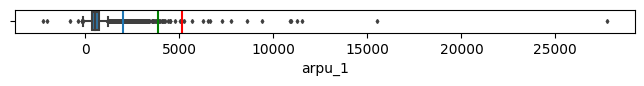

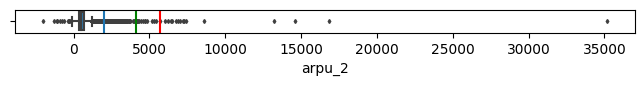

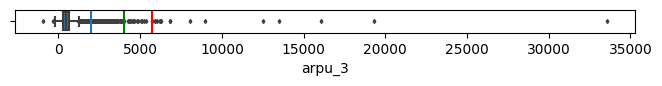

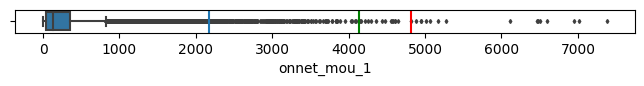

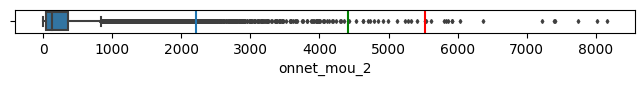

...

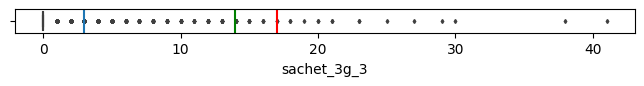

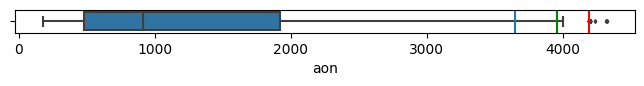

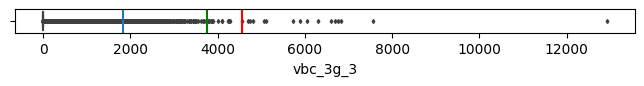

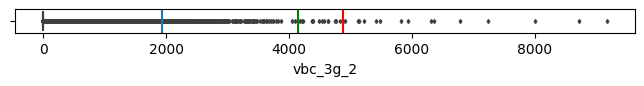

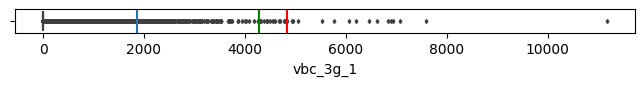

In [35]:
# see distribution and identify a good cutoff point for extreme values
print('Blue: 99.0th percentile, Green: 99.9th percentile, Red: 99.95th percentile')
for feature in df.drop(columns='Churn').columns:
    plt.figure(figsize=(8,0.3))
    sns.boxplot(data=df, x=feature,fliersize=2)
    plt.axvline(df[feature].quantile(.99))
    plt.axvline(df[feature].quantile(.999), c='g')
    plt.axvline(df[feature].quantile(.9995), c='r')
    plt.title('')
    plt.show()

In most case, 99.9th percentile seems to be a good cutoff for capping outlier.

In [36]:
# cap the upper outliers at 99.9th percentile (green line)
for feature in df.drop(columns='Churn').columns:
    percentile_99_9th = df[feature].quantile(0.999)
    # df[feature][df[feature] > percentile_99_9th] = percentile_99_9th
    df.loc[(df[feature] > percentile_99_9th), feature] = percentile_99_9th

In [37]:
# cap the lower outliers in arpu at 0
df[['arpu_1','arpu_2','arpu_3']] = df[['arpu_1','arpu_2','arpu_3']].apply(lambda x: x.apply(lambda x: 0 if x<0 else x))

Blue: 99.0th percentile, Green: 99.9th percentile, Red: 99.95th percentile


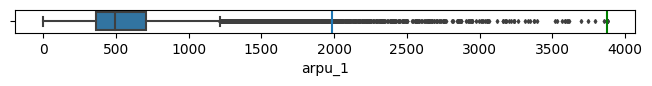

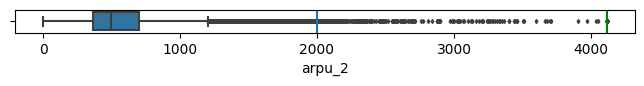

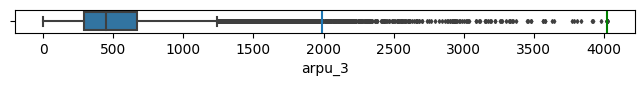

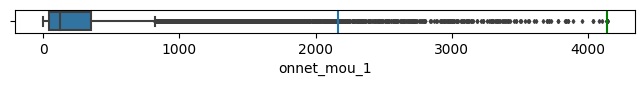

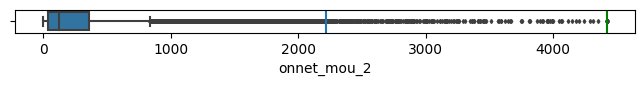

...

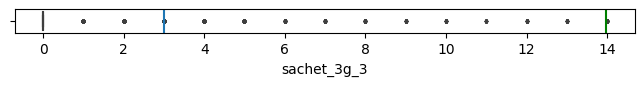

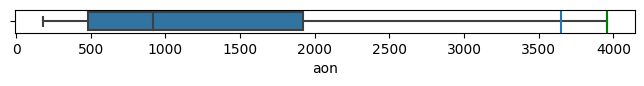

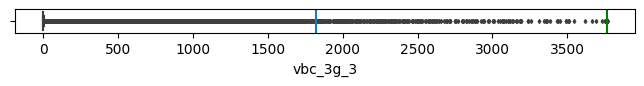

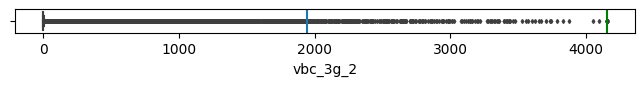

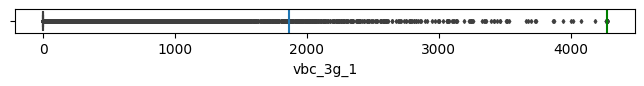

In [38]:
# View the distribution after capping outlier
print('Blue: 99.0th percentile, Green: 99.9th percentile, Red: 99.95th percentile')
for feature in df.drop(columns='Churn').columns:
    plt.figure(figsize=(8,0.3))
    sns.boxplot(data=df, x=feature,fliersize=2)
    plt.axvline(df[feature].quantile(.99))
    plt.axvline(df[feature].quantile(.999), c='g')
    plt.title('')
    plt.show()

## Trends in usage

### Change in usage during the first 3 months

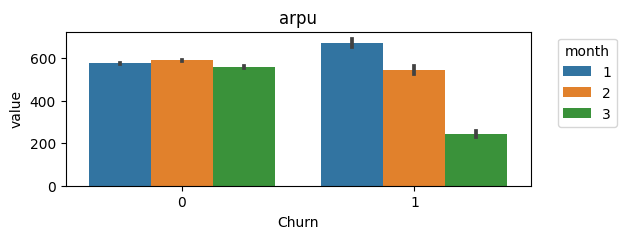

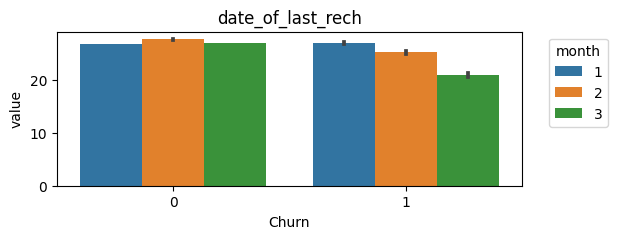

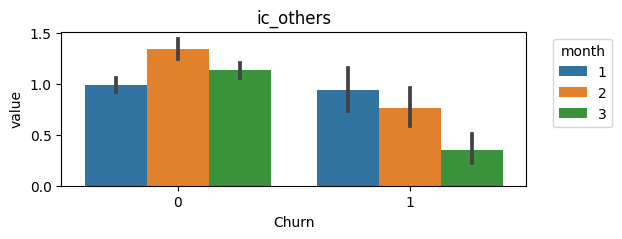

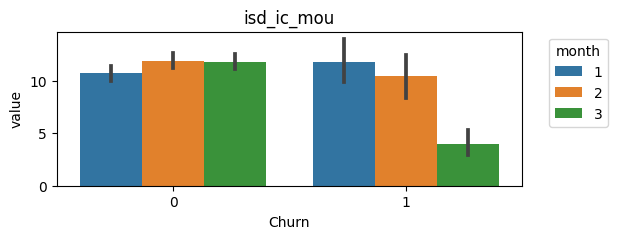

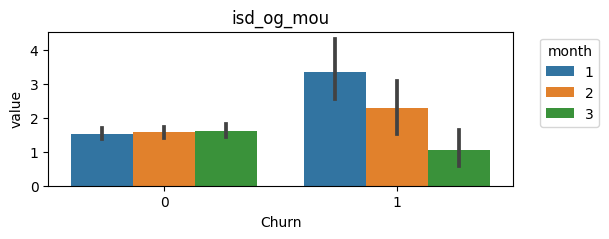

...

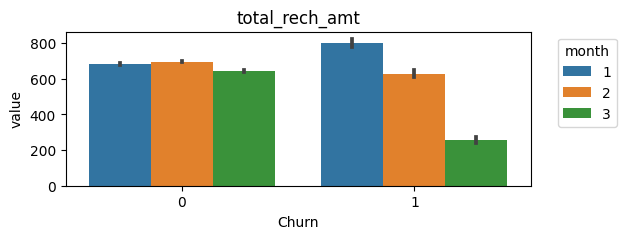

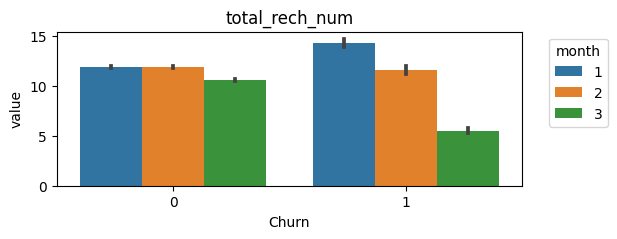

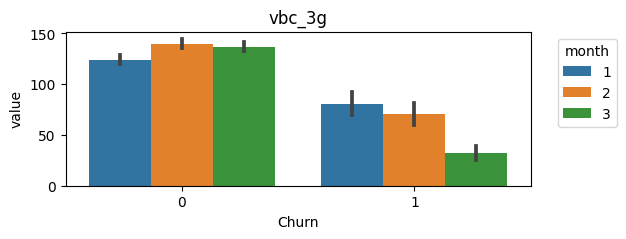

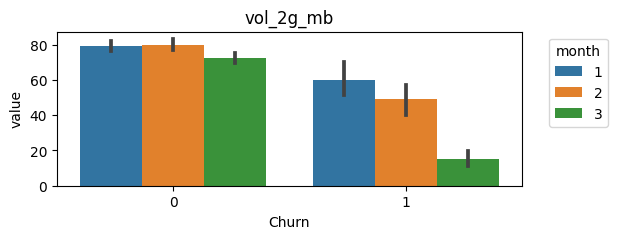

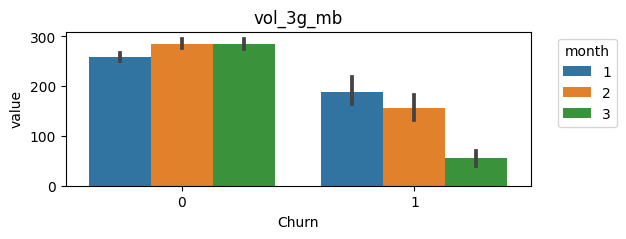

In [39]:
# loop
usage_metrics = np.unique([column.strip('123') for column in df.drop(columns=['aon', 'Churn']).columns])

for feature in usage_metrics:
    total = pd.melt(df[[feature+'1', feature+'2', feature+'3']], var_name='month', value_name='value', ignore_index=True)
    total.month = total.month.apply(lambda x: int(x[-1:]))
    total['Churn'] = pd.concat([df.Churn]*3, ignore_index=True)

    plt.figure(figsize=(6,2))
    sns.barplot(data=total, x='Churn', y='value', hue='month')
    plt.title(feature[:-1])
    plt.legend(title='month',bbox_to_anchor=(1.2,1))
    plt.show()

**Observation:**
- Churners tends to have decrease monthly usage in the first 3 month while the non-churners maintain a stable usage throughout.
- Churners have higher outside network outgoing calls (std_og_t2m) and lower in-network outgoing calls (loc_og) than non churners. This could be that the reason are their friends/relatives are on different network, and they want to switch to be on the same networks of theirs.
- Churners have higher outgoing calls to their own call centers in the 2nd month. This could indicate that their issue remained unresolved even after contacting support.
- The churners higher roaming amount than the non-churners. This could be that the customer moved to another country and stop using the service.


### Change by month-pair

In [40]:
# pick a random sample of churner and non churner for scatterplot
eda_sample = pd.concat((df[df.Churn==1].sample(n=1000, random_state=42), df[df.Churn==0].sample(n=500, random_state=42)), axis=0)

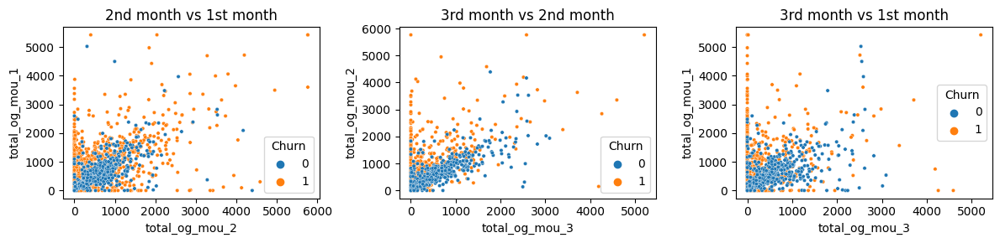

In [41]:
# plot the change in total_og_mou
fig, [ax1,ax2,ax3] = plt.subplots(ncols=3, figsize=(12,3))
sns.scatterplot(data=eda_sample, x='total_og_mou_2', y='total_og_mou_1', hue='Churn', s=10, ax=ax1)
sns.scatterplot(data=eda_sample, x='total_og_mou_3', y='total_og_mou_2', hue='Churn', s=10, ax=ax2)
sns.scatterplot(data=eda_sample, x='total_og_mou_3', y='total_og_mou_1', hue='Churn', s=10, ax=ax3)
ax1.set_title('2nd month vs 1st month')
ax2.set_title('3rd month vs 2nd month')
ax3.set_title('3rd month vs 1st month')
plt.tight_layout()
plt.show()

What pattern to notice in this: 
- the churners (orange points) tend to have decreased usage in the subsequent months (low values on the x-axis despite high values on y-axis)
- the non churner (blue points) tend to have a stable usage, thus form a positive correlation.
- Visually described, the orange points are "flushed left", towards 0 on x-axis.

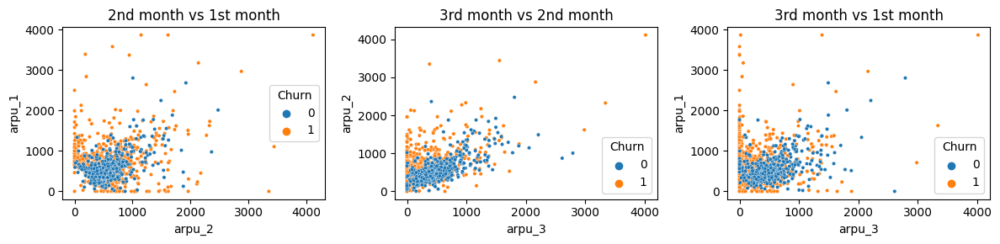

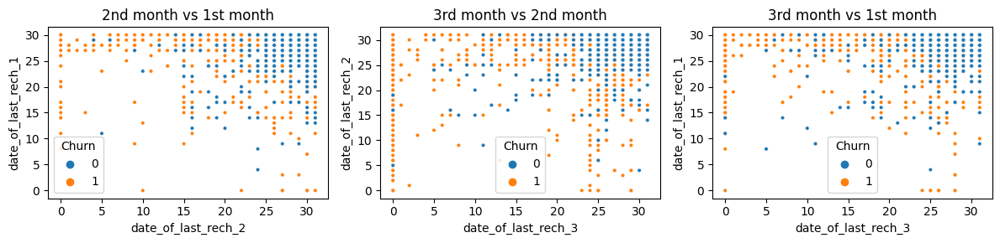

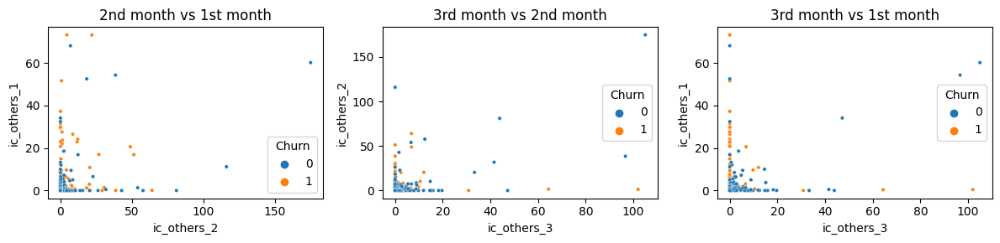

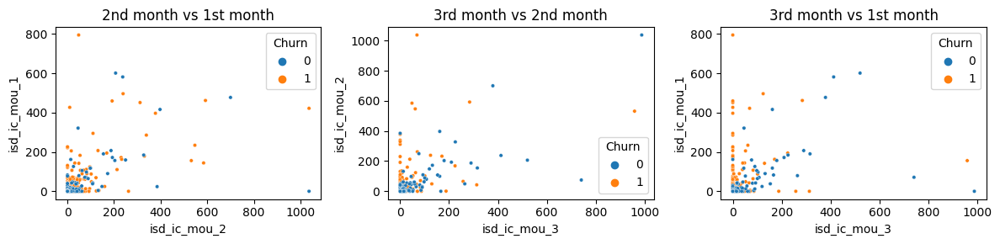

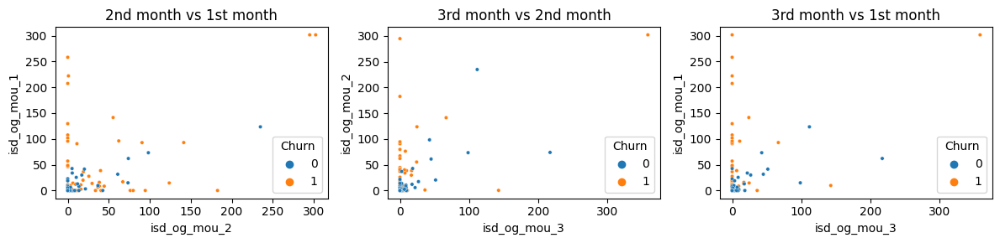

...

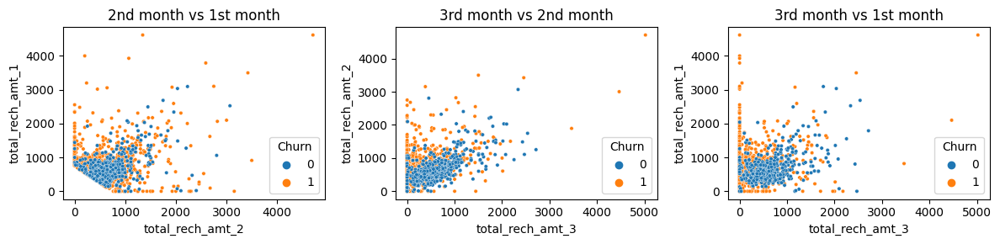

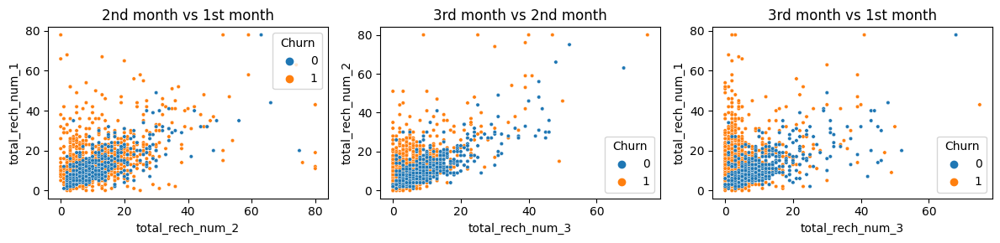

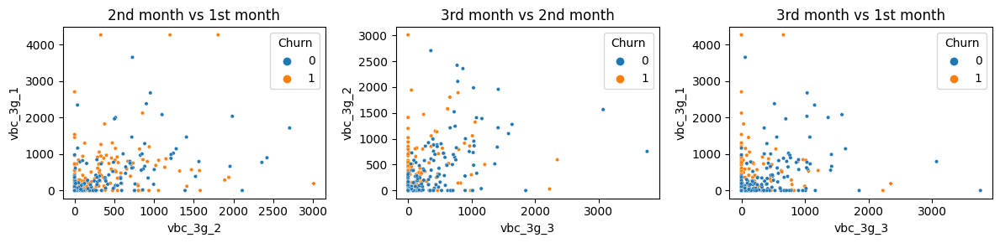

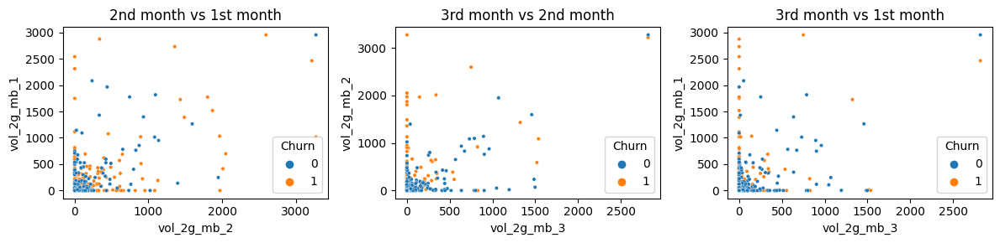

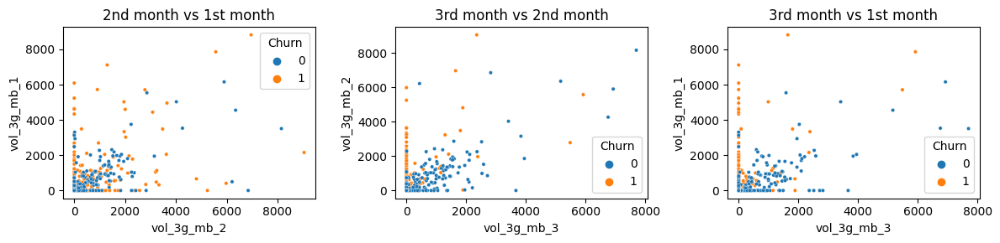

In [42]:
# similarly to the plot above, plot all the usage metrics

# get the list of usage metrics (strip the 123 at the end)
usage_metrics = np.unique([column.strip('123') for column in df.drop(columns=['aon', 'Churn']).columns])

for feature in usage_metrics:
    fig, [ax1,ax2,ax3] = plt.subplots(ncols=3, figsize=(12,3))
    sns.scatterplot(data=eda_sample, x=feature+'2', y=feature+'1', hue='Churn', s=10, ax=ax1)
    sns.scatterplot(data=eda_sample, x=feature+'3', y=feature+'2', hue='Churn', s=10, ax=ax2)
    sns.scatterplot(data=eda_sample, x=feature+'3', y=feature+'1', hue='Churn', s=10, ax=ax3)
    ax1.set_title('2nd month vs 1st month')
    ax2.set_title('3rd month vs 2nd month')
    ax3.set_title('3rd month vs 1st month')
    plt.tight_layout()
    plt.show()

### Sum of net change in usage
Now we identify that churners tend to have decreased usage, let's see if the sum of increase/decrease in usage could be a good feature to identify churner

#### net change in calls (ic/og)

Non churners' mean: -5.9874027682544675
Churners' mean: -295.66224890088705


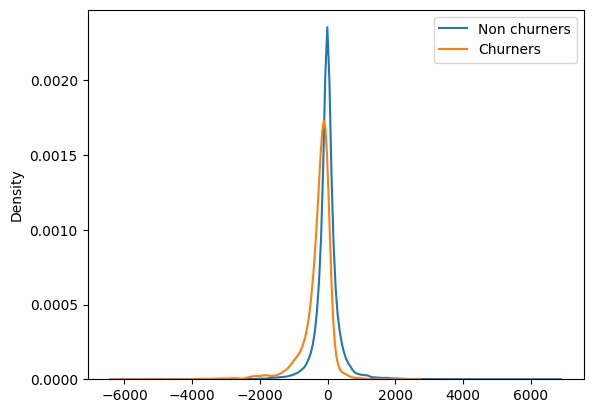

In [43]:
# incoming call change
# (3th month - 2nd month) + (3th month - 1st month)
ic_changes = (df.total_ic_mou_3 - df.total_ic_mou_2) + (df.total_ic_mou_3 - df.total_ic_mou_1)
sns.kdeplot(x=ic_changes[df.Churn==0], label='Non churners')
sns.kdeplot(x=ic_changes[df.Churn==1], label='Churners')
plt.legend()

print(f'Non churners\' mean: {ic_changes[df.Churn==0].mean()}')
print(f'Churners\' mean: {ic_changes[df.Churn==1].mean()}')

Non churners' mean: -60.69801449777499
Churners' mean: -1090.8114848438104


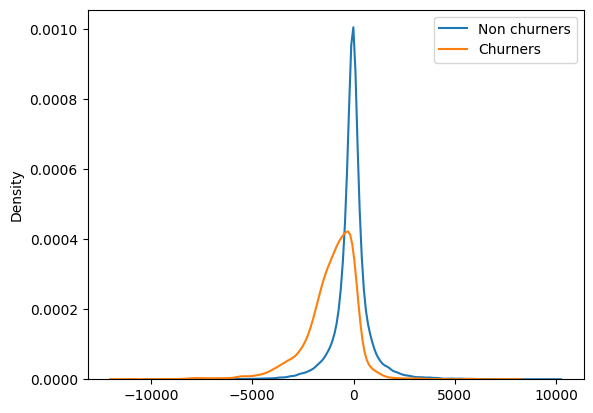

In [44]:
# outgoing call change
# (3th month - 2nd month) + (3th month - 1st month)

og_changes = (df.total_og_mou_3 - df.total_og_mou_2) + (df.total_og_mou_3 - df.total_og_mou_1)
sns.kdeplot(x=og_changes[df.Churn==0], label='Non churners')
sns.kdeplot(x=og_changes[df.Churn==1], label='Churners')
plt.legend()

print(f'Non churners\' mean: {og_changes[df.Churn==0].mean()}')
print(f'Churners\' mean: {og_changes[df.Churn==1].mean()}')

Non churners' mean: -66.68541726602946
Churners' mean: -1386.4737337446973


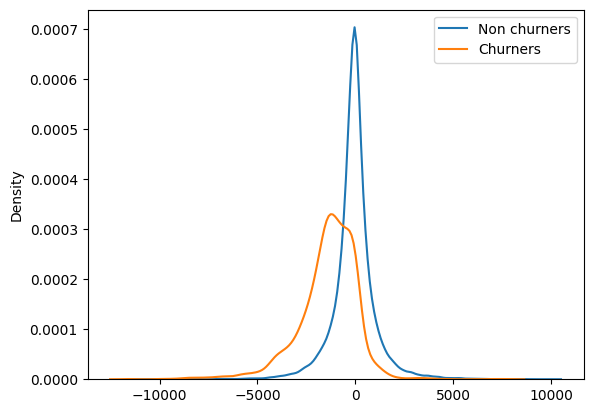

In [45]:
# BOTH incoming and outgoing call change
# (3th month - 2nd month) + (3th month - 1st month)

call_changes = og_changes + ic_changes
sns.kdeplot(x=call_changes[df.Churn==0], label='Non churners')
sns.kdeplot(x=call_changes[df.Churn==1], label='Churners')
plt.legend()
print(f'Non churners\' mean: {call_changes[df.Churn==0].mean()}')
print(f'Churners\' mean: {call_changes[df.Churn==1].mean()}')

**T test**

In [46]:
# mean of call changes, non churner
call_changes[df.Churn==0].mean()

-66.68541726602946

In [47]:
# mean of call changes, churner
call_changes[df.Churn==1].mean()

-1386.4737337446973

Hypothesis
>- H0: churners' mean = non-churners' mean
>- H1: churners' mean =/= non-churners' mean

In [48]:
# t-test for sum of ic/og call changes
stats.ttest_ind(call_changes[df.Churn==0].sample(n=2593), call_changes[df.Churn==1])

Ttest_indResult(statistic=35.15150844747808, pvalue=5.598205194682189e-243)

T-test confirm there is a significant difference in expected value of call change between churners and non-churners.

#### net change in mobile data usage

(13.313543431322096, -312.3139300809875)

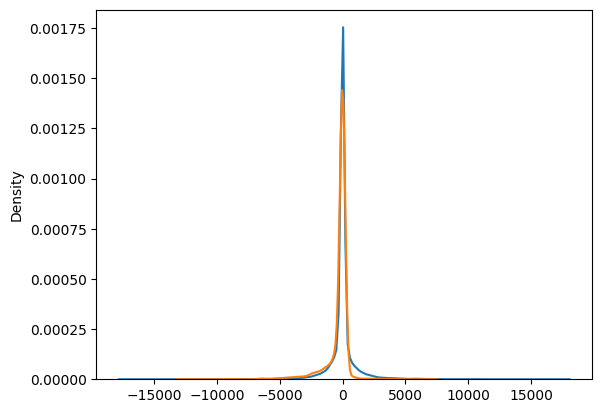

In [49]:
# internet change
vol_mb_1 = df.vol_2g_mb_1 + df.vol_3g_mb_1
vol_mb_2 = df.vol_2g_mb_2 + df.vol_3g_mb_2
vol_mb_3 = df.vol_2g_mb_3 + df.vol_3g_mb_3

mb_changes = (vol_mb_3 - vol_mb_2) + (vol_mb_3 - vol_mb_1)
sns.kdeplot(x=mb_changes[df.Churn==0])
sns.kdeplot(x=mb_changes[df.Churn==1])
mb_changes[df.Churn==0].mean(), mb_changes[df.Churn==1].mean()

In [50]:
stats.ttest_ind(mb_changes[df.Churn==0].sample(n=2593), mb_changes[df.Churn==1])

Ttest_indResult(statistic=11.53516750604303, pvalue=2.0566061816548694e-30)

### Conclusion

Churners have a tendency to have a significant decreased usage in calls/mobile data in the subsequent months whereas non-churners's usage are fairly stable (mean of change centered around 0). The net change and percent change in usage could be used as a feature for predicting churners.

## Correlation

In [51]:
# correlation matrix
corr = np.round(df.drop(columns='Churn').corr(),2)

<AxesSubplot: >

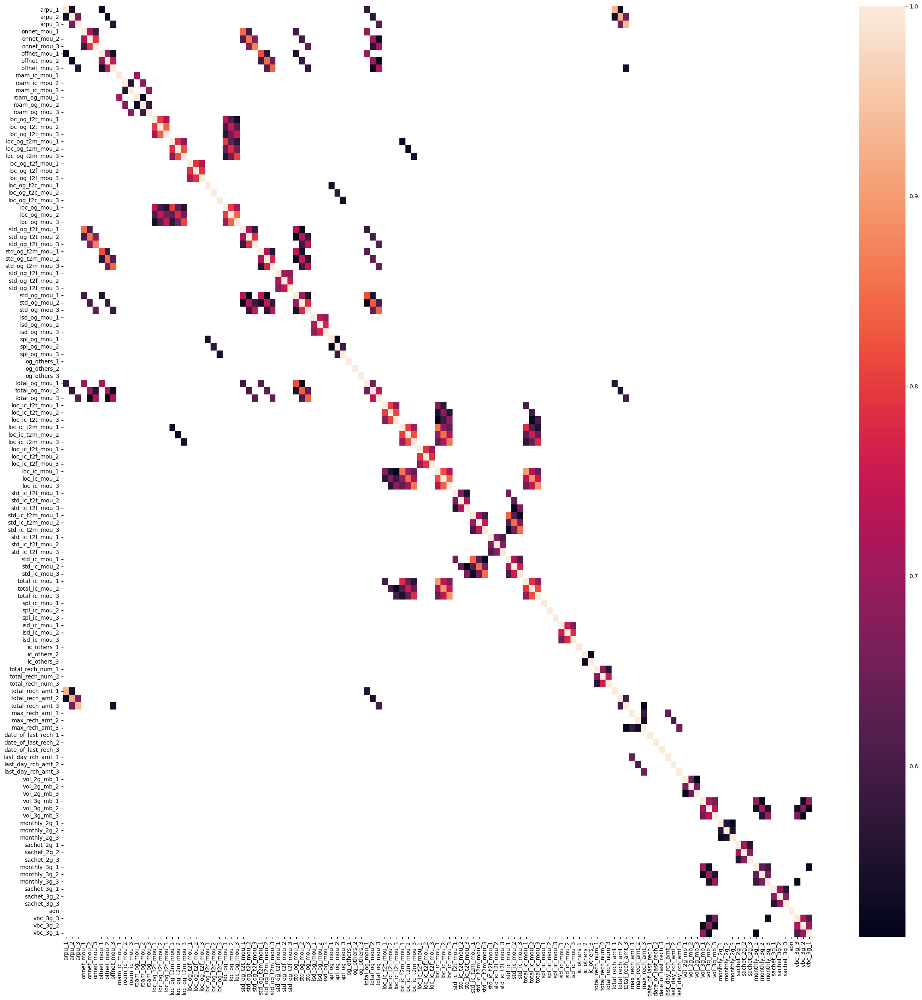

In [52]:
# correlation heatmap where coefficient > 0.5
plt.figure(figsize=(30,30))
sns.heatmap(corr[corr.abs()>0.5])

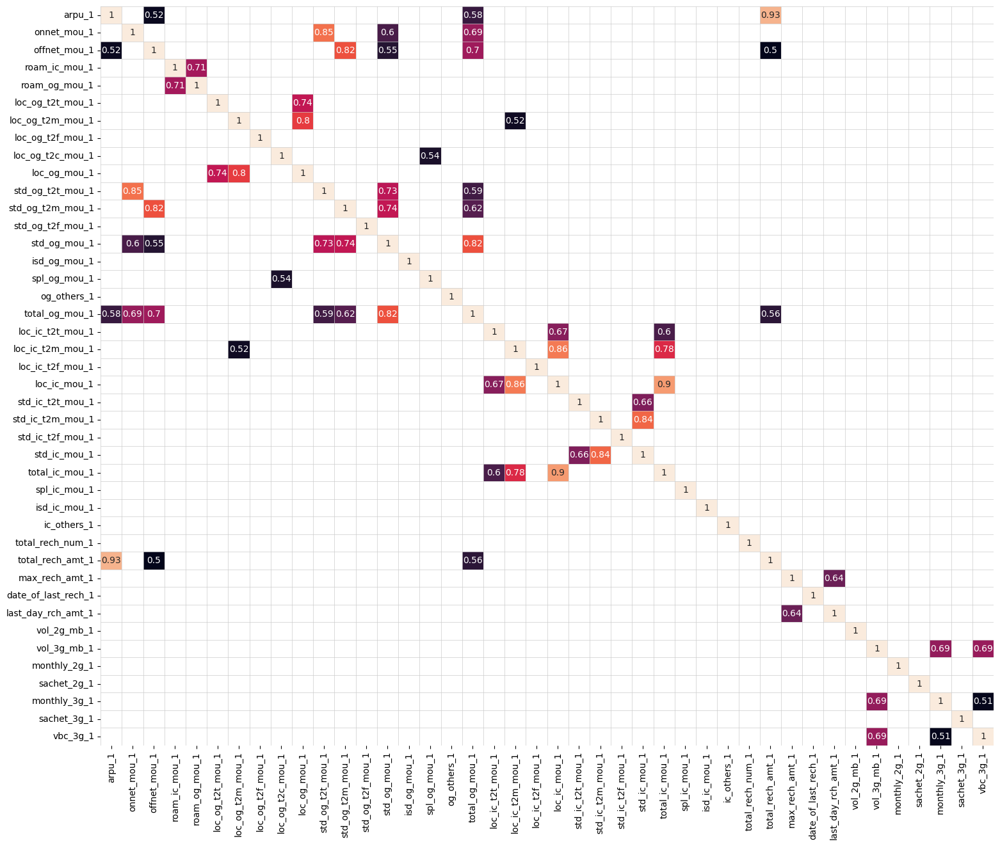

In [53]:
# correlation between metrics of the first month only
corr_1 = np.round(df.filter(regex='_1$')).corr()
plt.figure(figsize=(18,15))
sns.heatmap(corr_1[corr_1.abs()>0.5], annot=True, cbar=False)
for line in range(0, len(corr_1)+2):
    plt.axhline(line, linewidth=0.5, c='#cccccc')
    plt.axvline(line, linewidth=0.5, c='#cccccc')

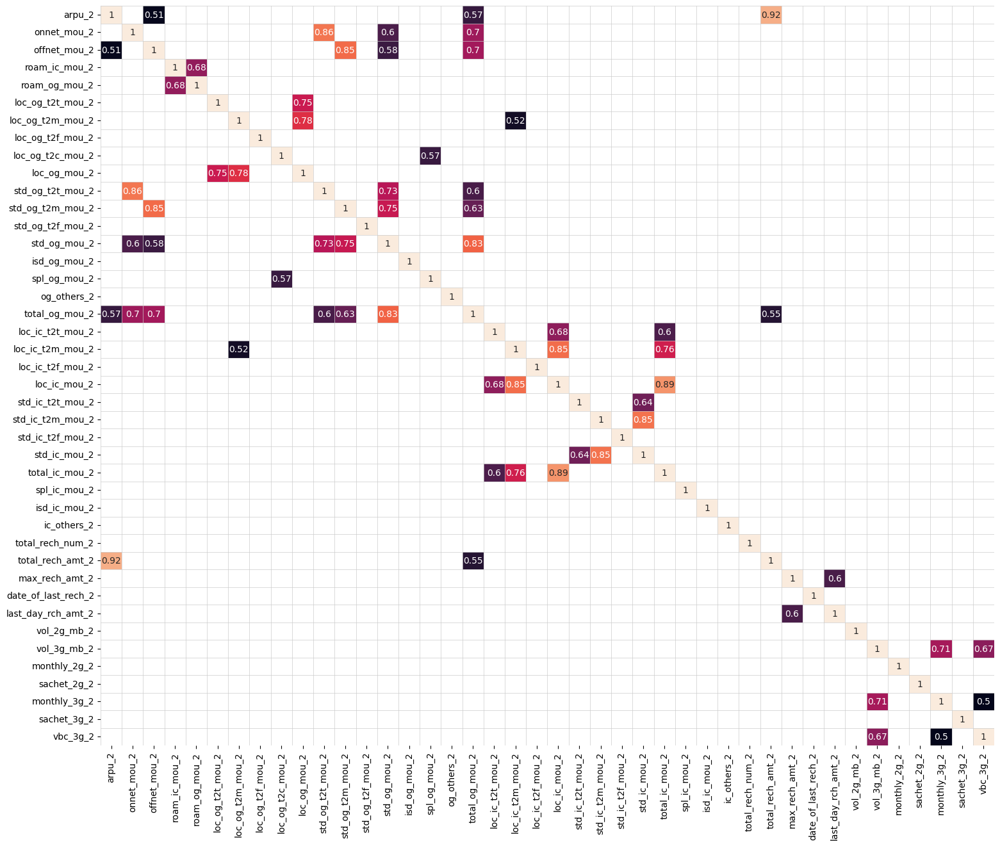

In [54]:
# correlation between metrics of the 2nd month only
corr_2 = np.round(df.filter(regex='_2$')).corr()
plt.figure(figsize=(18,15))
sns.heatmap(corr_2[corr_2.abs()>0.5], annot=True, cbar=False)
for line in range(0, len(corr_2)+2):
    plt.axhline(line, linewidth=0.5, c='#cccccc')
    plt.axvline(line, linewidth=0.5, c='#cccccc')

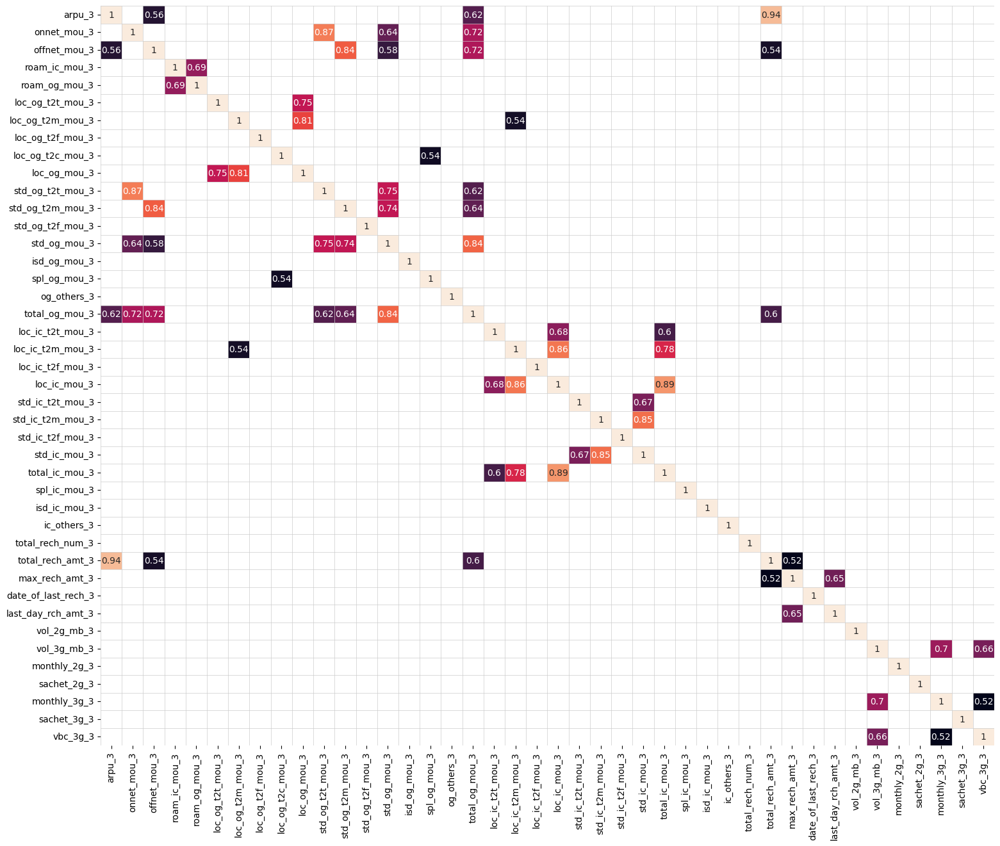

In [55]:
# correlation between metrics of the 3rd month only
corr_3 = np.round(df.filter(regex='_3$')).corr()
plt.figure(figsize=(18,15))
sns.heatmap(corr_3[corr_3.abs()>0.5], annot=True, cbar=False)
for line in range(0, len(corr_3)+2):
    plt.axhline(line, linewidth=0.5, c='#cccccc')
    plt.axvline(line, linewidth=0.5, c='#cccccc')

- The data contain multiple highly correlated features. 
- Almost all feature sets of first, second and third month (_1, _2, _3) are highly correlated to each others.
- Related features (eg arpu and total recharge, total_og and other specific _og,...) are expected to be highly correlated as well.
- Principle components analysis is required to reduce the dimensions of the data since it can reduce a large number of correlated variables to fewer uncorrelated variables.

# 5 Derive more features based on EDA

## 5.1 Change in net usage

In [56]:
usage_metrics = np.unique([column.strip('123') for column in df.drop(columns=['aon', 'Churn']).columns])

In [57]:
# dataframe for storing new derived features
net_changes = pd.DataFrame()

for feature in usage_metrics:
    net_changes[feature] = (df[feature+'3'] - df[feature+'2']) + (df[feature+'3'] - df[feature+'1'])

# remove _ at the end in column name
net_changes.columns = [column.strip('_') for column in net_changes.columns]

net_changes.head(10)

,arpu,date_of_last_rech,ic_others,isd_ic_mou,isd_og_mou,last_day_rch_amt,loc_ic_mou,loc_ic_t2f_mou,loc_ic_t2m_mou,loc_ic_t2t_mou,loc_og_mou,loc_og_t2c_mou,loc_og_t2f_mou,loc_og_t2m_mou,loc_og_t2t_mou,max_rech_amt,monthly_2g,monthly_3g,offnet_mou,og_others,onnet_mou,roam_ic_mou,roam_og_mou,sachet_2g,sachet_3g,spl_ic_mou,spl_og_mou,std_ic_mou,std_ic_t2f_mou,std_ic_t2m_mou,std_ic_t2t_mou,std_og_mou,std_og_t2f_mou,std_og_t2m_mou,std_og_t2t_mou,total_ic_mou,total_og_mou,total_rech_amt,total_rech_num,vbc_3g,vol_2g_mb,vol_3g_mb
0,3923.930,0.0,-0.65,46.59,19.84,1558.0,-407.03,-174.56,-196.67,-35.78,-444.49,0.00,-10.81,-431.45,-2.21,790,0,0,-368.77,0.00,-7.94,13.56,39.79,0,0.0,-0.21,8.50,34.26,-42.01,64.23,12.06,19.68,6.62,16.63,-3.57,-327.02,-396.45,4906.0,4,77.36,0.00,0.00
1,-596.220,4.0,0.00,0.00,0.00,-30.0,-73.68,0.00,-40.60,-33.06,-540.19,14.30,0.00,-50.46,-489.74,-184,-1,0,97.67,0.00,-694.56,0.00,0.00,5,0.0,0.00,20.46,-25.59,0.00,-25.21,-0.38,-77.18,0.00,127.65,-204.83,-99.27,-596.90,-798.0,-12,-990.75,-355.94,-727.07
2,488.003,18.0,-56.84,479.39,2.58,-160.0,268.83,10.17,228.95,29.70,449.19,0.98,42.48,390.51,16.20,40,0,0,432.33,0.00,458.33,-23.55,-40.36,6,0.0,-0.45,9.56,456.92,3.82,297.90,155.19,469.65,0.00,5.58,464.07,1147.87,931.02,674.0,12,0.00,0.04,0.00
3,-355.056,-33.0,0.00,0.46,0.00,60.0,-83.13,48.03,-76.18,-54.99,-119.69,0.00,16.04,-162.72,26.99,40,0,0,-200.51,0.00,16.70,-2.83,-17.74,0,0.0,0.00,8.56,-74.84,3.85,56.10,-134.77,-54.92,0.00,-50.92,-4.01,-157.50,-166.06,-598.0,-12,-24.34,0.00,0.00
4,-657.990,-10.0,0.00,0.00,0.00,-30.0,-84.27,0.00,-49.72,-34.54,-97.54,0.00,0.00,-58.54,-38.99,-50,0,0,-50.56,-0.93,-1179.61,4.86,18.22,0,0.0,0.00,-2.58,-9.91,0.00,-1.28,-8.63,-1149.27,0.00,-1.55,-1147.72,-94.19,-1250.34,-756.0,-13,0.00,0.00,0.00
5,163.314,1.0,0.00,0.00,0.00,50.0,105.21,13.33,65.46,26.41,68.35,0.00,2.41,29.88,36.04,0,0,0,312.17,0.00,-64.24,0.00,0.00,0,0.0,0.00,0.00,77.89,0.00,97.56,-19.68,179.60,0.00,279.88,-100.29,183.10,247.95,156.0,6,0.00,0.00,0.00
6,-72.194,22.0,0.00,-3.18,0.00,40.0,-265.30,-72.51,-169.51,-23.30,-309.51,2.77,10.39,-260.99,-58.87,40,0,0,-254.09,0.00,102.84,18.36,35.97,0,0.0,0.00,15.12,-88.61,-75.16,11.60,-25.04,111.37,-0.48,-26.51,138.35,-357.10,-183.03,210.0,4,0.00,0.00,0.00
7,-2521.393,-8.0,-1.48,0.00,0.00,658.0,76.72,-1.72,75.86,2.59,0.00,1.12,0.00,0.00,0.00,-597,0,-7,0.00,0.00,0.00,0.00,0.00,0,-4.0,0.00,1.12,-6.76,-0.93,-3.01,-2.81,0.00,0.00,0.00,0.00,68.50,1.12,-2954.0,-19,-3705.30,-128.87,3737.47
8,-62.727,-10.0,0.00,-16.68,0.00,220.0,-16.35,0.00,1.40,-17.75,-40.29,0.00,0.00,-12.03,-28.25,120,0,0,56.18,0.00,463.81,0.00,0.00,0,0.0,0.00,0.00,-6.42,0.00,6.30,-12.72,560.26,0.00,68.21,492.04,-39.45,519.98,-224.0,-37,0.00,0.00,0.00
9,-449.058,16.0,0.14,-123.42,0.39,-80.0,-215.14,-11.70,-82.64,-120.80,-181.28,0.00,-35.04,-101.84,-44.39,0,0,0,-239.76,0.00,-44.39,0.00,0.00,0,0.0,0.00,-0.88,-1.40,-1.40,0.00,0.00,-103.21,-103.21,0.00,0.00,-339.82,-284.99,-186.0,-2,0.00,0.00,0.00


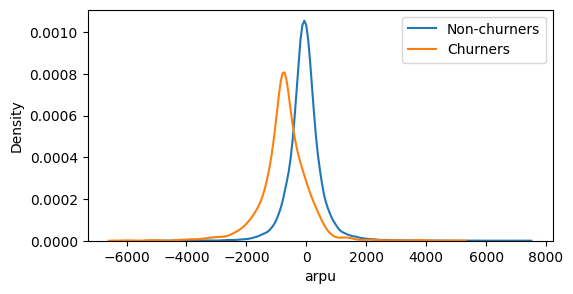

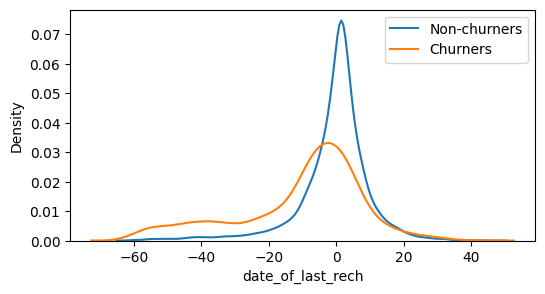

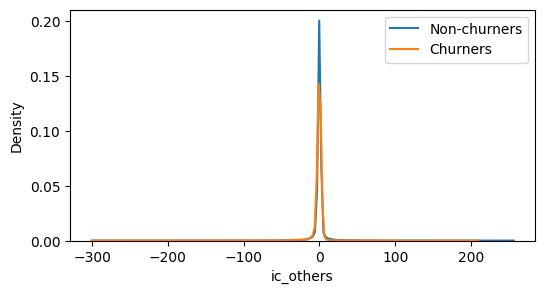

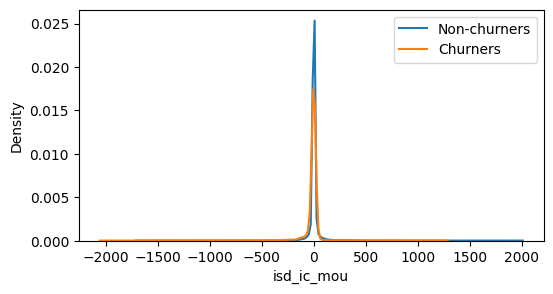

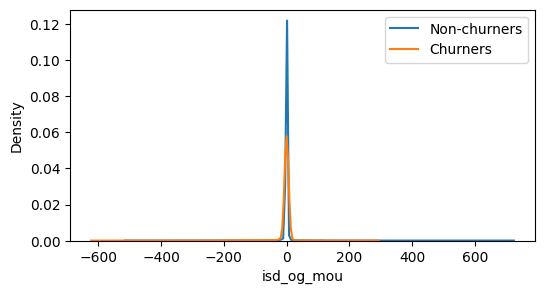

...

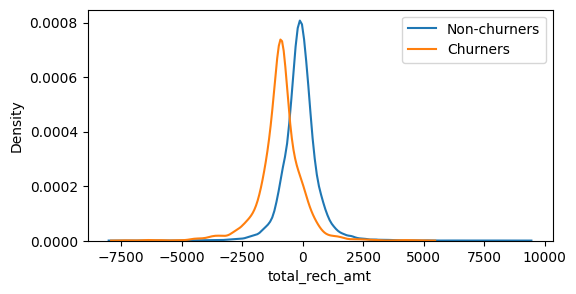

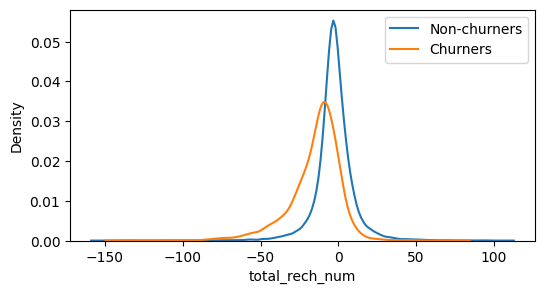

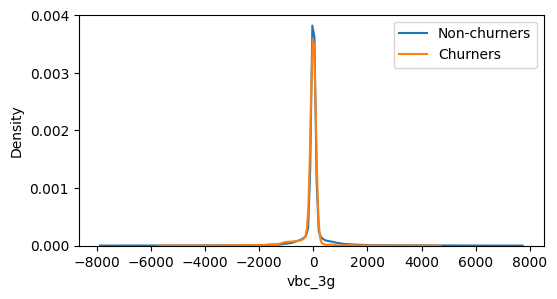

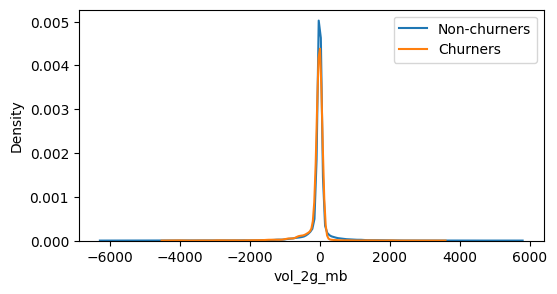

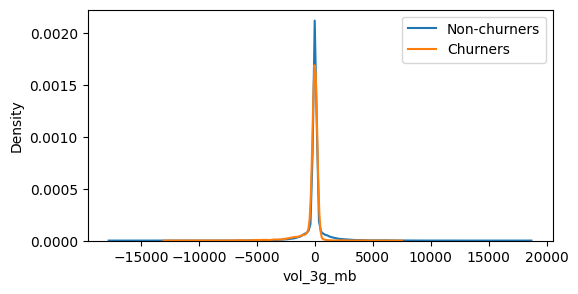

In [58]:
for feature in net_changes.columns:
    plt.figure(figsize=(6,3))
    sns.kdeplot(x=net_changes[feature][df.Churn==0], label='Non-churners')
    sns.kdeplot(x=net_changes[feature][df.Churn==1], label='Churners')
    plt.legend()
    plt.show()

In [59]:
# keep the feature that displayed a visually different distribution between churner and non churner
keep_features = [
    'arpu', 'total_ic_mou', 'total_og_mou',
    'total_rech_amt', 'last_day_rch_amt', 'max_rech_amt', 'total_rech_num', 
    'loc_og_mou', 'std_og_mou', 'offnet_mou', 'onnet_mou']

net_changes = net_changes[keep_features]

## 5.2 Percent change in net usage

In [60]:
# dataframe for storing new derived features
pct_changes = pd.DataFrame()

for feature in keep_features:
    pct_changes[feature] = (df[feature+'_3'] - df[feature+'_2'])/(df[feature+'_2']+1) + (df[feature+'_3'] - df[feature+'_1'])/(df[feature+'_1']+1)

pct_changes.head(10)

,arpu,total_ic_mou,total_og_mou,total_rech_amt,last_day_rch_amt,max_rech_amt,total_rech_num,loc_og_mou,std_og_mou,offnet_mou,onnet_mou
0,3.312942,-0.546401,-0.705745,4.902213,1558.000000,0.998736,0.666667,-0.913099,0.309952,-0.705232,-0.137247
1,-1.355096,-1.237951,-1.262387,-1.522748,9.215686,-1.459341,-0.568182,-1.609615,-0.556485,1.121358,-1.810504
2,2.078722,5.780869,4.373552,2.240157,-1.971383,0.360360,2.114286,6.236632,3.623037,3.186359,3.957555
3,-0.934892,-0.420100,-0.509500,-1.256720,0.594059,0.360360,-1.298701,-0.391859,-0.962623,-0.739441,0.344888
4,-0.635375,-1.687119,-1.446714,29.037944,-0.967742,29.279279,-0.083333,-0.989852,-1.446644,4.644406,-1.137536
5,0.306038,1.231119,0.280316,0.252140,2.073733,0.000000,0.254428,0.708445,0.234007,0.393670,-0.519871
6,-0.172667,-0.901489,-0.336275,0.596762,0.360360,0.360360,0.666667,-1.224495,0.527042,-0.604472,1.664252
7,-1.407006,8.037938,1.120000,-1.406954,455.802372,0.165429,-1.616667,0.000000,0.000000,0.000000,0.000000
8,-0.108046,-0.560057,1.397586,-0.354870,10.476190,3.405987,-1.445652,-0.691963,1.831757,1.015264,1.744382
9,-0.982298,-0.819031,-0.774502,-0.368733,-0.529801,0.000000,-0.400000,-0.613025,-1.454701,-0.921324,-0.388740


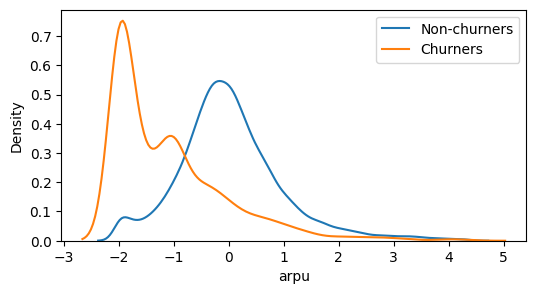

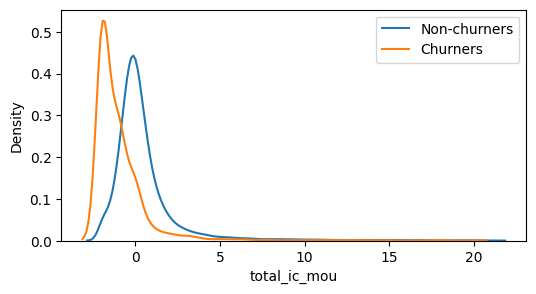

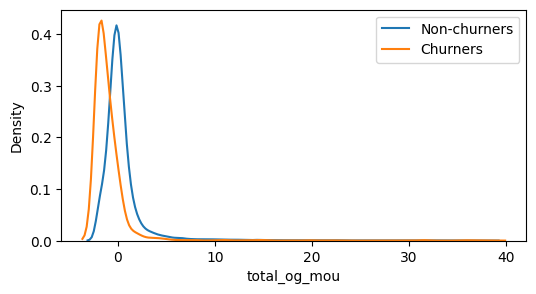

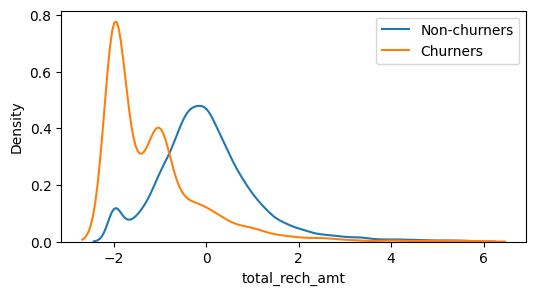

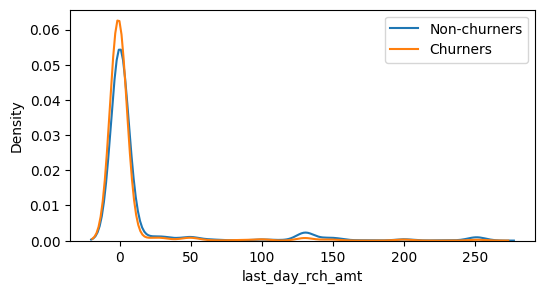

...

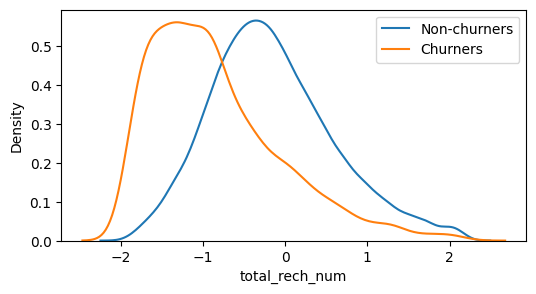

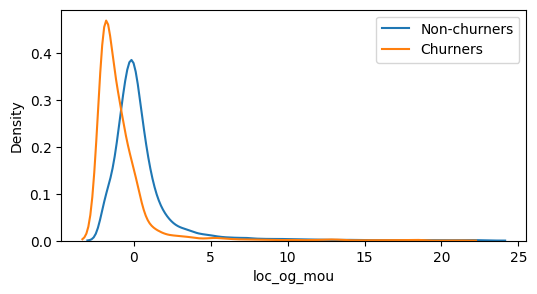

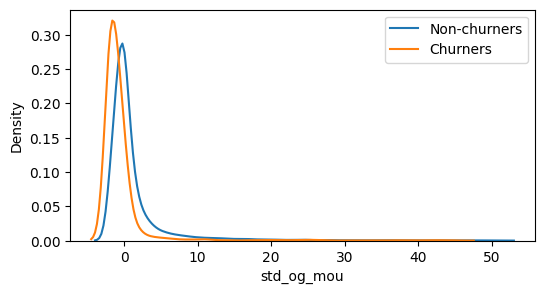

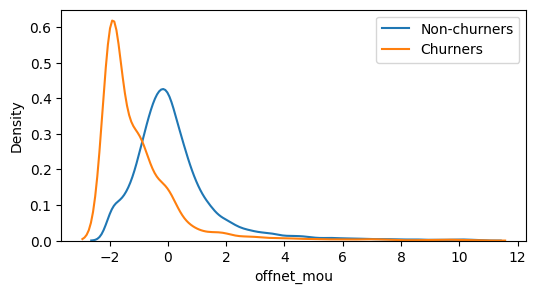

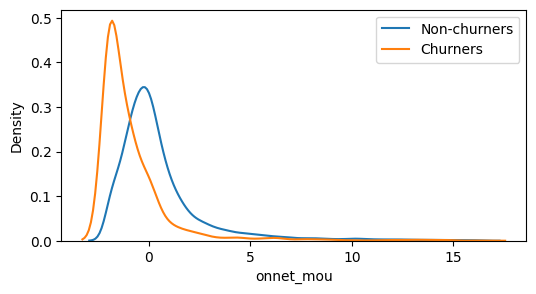

In [61]:
for feature in pct_changes.columns:
    plt.figure(figsize=(6,3))
    sns.kdeplot(x=pct_changes[feature][(pct_changes[feature].abs()<pct_changes[feature].quantile(0.97)) & (df.Churn==0)], label='Non-churners')
    sns.kdeplot(x=pct_changes[feature][(pct_changes[feature].abs()<pct_changes[feature].quantile(0.97)) & (df.Churn==1)], label='Churners')
    plt.legend()
    plt.show()

## 5.3 Non linear transform data

### Function for boxcox and root transform

In [62]:
from scipy.special import boxcox1p

In [63]:
# function for root transformation
def root_tf_3(df, feature, tf_value=0.5, visualize=True, return_tf = False):
    # data
    data = df[[feature+'_1', feature+'_2', feature+'_3']]
    
    # store sign
    negative_values = data<0

    # remove sign from main variable
    data_abs = data.abs()

    # apply transform
    transformed = data_abs.apply(lambda x: x**tf_value)

    # restore sign
    transformed[negative_values] = transformed[negative_values]*(-1)

    # if show visualization
    if visualize and return_tf !=True:
        for month in ('_1','_2','_3'):
            fig, [ax1,ax2] = plt.subplots(ncols=2, figsize=(8,2))
            if month=='_1':
                ax1.set_title('Original')
                ax2.set_title('Transformed')
            sns.histplot(data, x=feature+month, ax=ax1)
            sns.histplot(transformed, x=feature+month, ax=ax2)
            plt.tight_layout()
            plt.show()
    if return_tf:
        return transformed

### Transform data (df)

Blue: 99.0th percentile, Green: 99.9th percentile, Red: 99.95th percentile


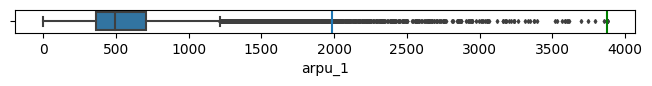

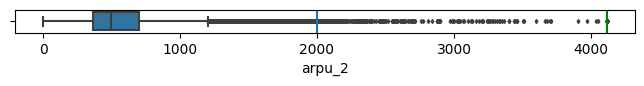

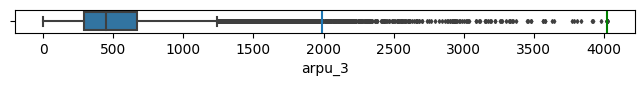

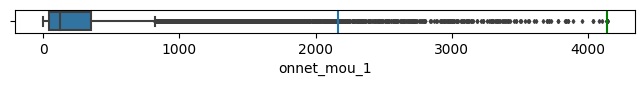

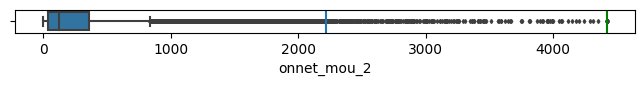

...

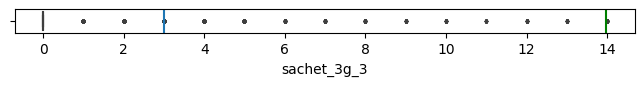

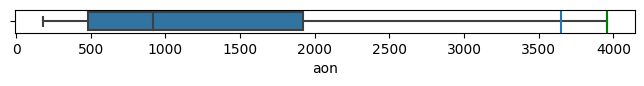

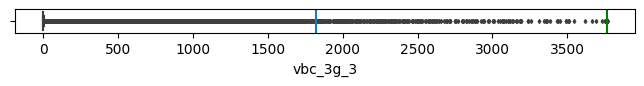

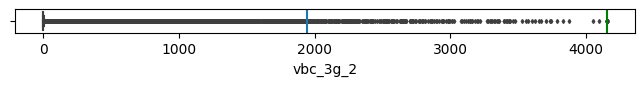

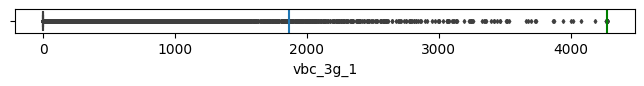

In [64]:
# View the distribution after capping outlier, BEFORE TRANSFORM
print('Blue: 99.0th percentile, Green: 99.9th percentile, Red: 99.95th percentile')
for feature in df.drop(columns='Churn').columns:
    plt.figure(figsize=(8,0.3))
    sns.boxplot(data=df, x=feature,fliersize=2)
    plt.axvline(df[feature].quantile(.99))
    plt.axvline(df[feature].quantile(.999), c='g')
    plt.title('')
    plt.show()

In [65]:
# root transform the data to reduce skewness
for feature, tf_value in [('arpu', 0.35), ('onnet_mou', 0.2), ('offnet_mou', 0.3)]:
    df[[feature+'_1', feature+'_2', feature+'_3']] = root_tf_3(df, feature, tf_value=tf_value, return_tf=True)

In [66]:
for feature in [
    'roam_og_mou',
    'loc_og_t2t_mou',
    'loc_og_t2m_mou',
    'loc_og_t2f_mou',
    'loc_og_mou',
    'std_og_t2t_mou',
    'std_og_t2m_mou',
    'std_og_t2f_mou',
    'std_og_mou',
    'spl_og_mou',
    'og_others']:
    df[[feature+'_1', feature+'_2', feature+'_3']] = root_tf_3(df, feature, tf_value=0.2, return_tf=True)

In [67]:
for feature in ['total_og_mou']:
    df[[feature+'_1', feature+'_2', feature+'_3']] = root_tf_3(df, feature, tf_value=0.3, return_tf=True)

In [68]:
for feature in [
    'roam_ic_mou',
    'loc_ic_t2t_mou',
    'loc_ic_t2m_mou',
    'loc_ic_t2f_mou',
    'loc_ic_mou',
    'std_ic_t2t_mou',
    'std_ic_t2m_mou',
    'std_ic_t2f_mou',
    'std_ic_mou']:
    df[[feature+'_1', feature+'_2', feature+'_3']] = root_tf_3(df, feature, tf_value=0.2, return_tf=True)

In [69]:
for feature in [
    'total_rech_num',
    'total_rech_amt',
    'max_rech_amt',
    'last_day_rch_amt',
    'vol_2g_mb',
    'vol_3g_mb',
    'sachet_2g',
    'sachet_3g']:
    df[[feature+'_1', feature+'_2', feature+'_3']] = root_tf_3(df, feature, tf_value=0.3, return_tf=True)

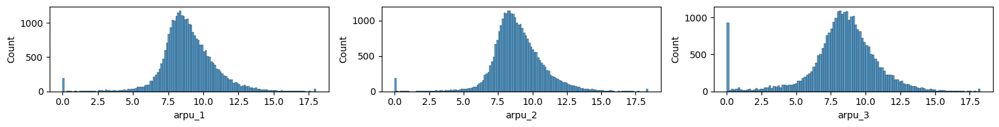

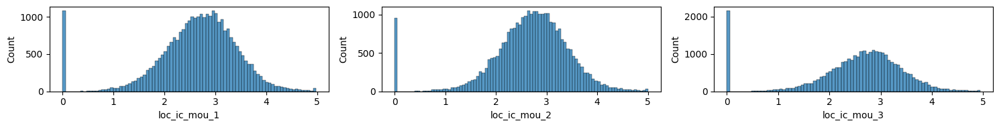

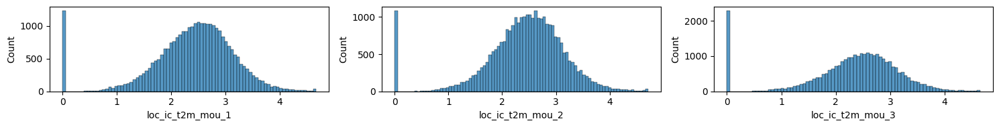

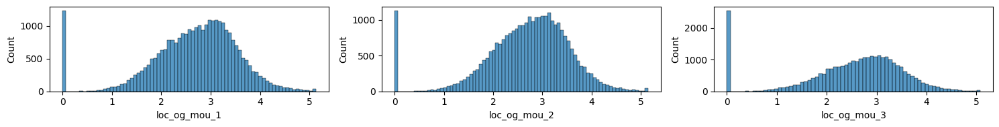

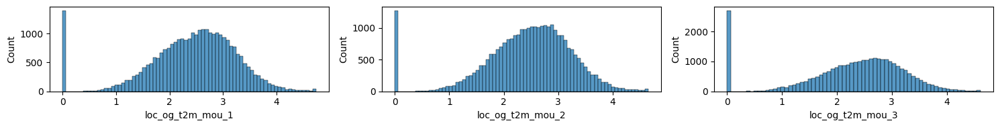

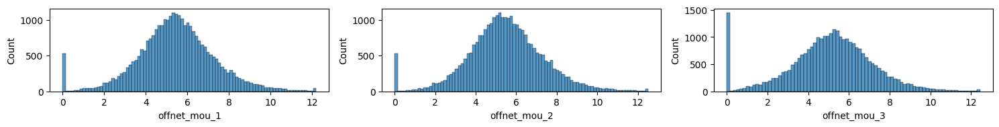

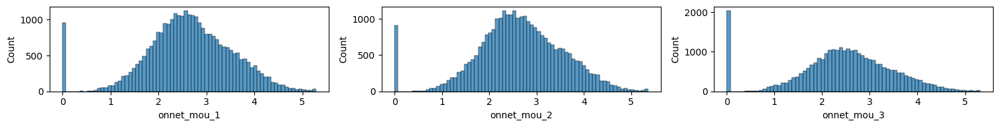

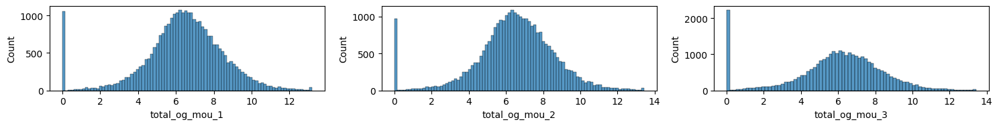

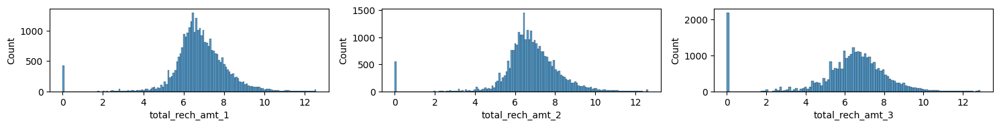

In [70]:
# see transformed values:
for feature in ['arpu_', 'loc_ic_mou_', 'loc_ic_t2m_mou_', 'loc_og_mou_', 'loc_og_t2m_mou_', 'offnet_mou_', 'onnet_mou_', 'total_og_mou_', 'total_rech_amt_']:
    fig, [ax1,ax2,ax3] = plt.subplots(ncols=3, figsize=(15,2))
    for month, ax_th in zip(('1','2','3'),[ax1,ax2,ax3]):
        sns.histplot(df, x=feature+month, ax=ax_th)
    plt.tight_layout()
    plt.show()

The variables distribution are now less skewed, follow a normal distribution.

### Transform data (net_change)

In [71]:
# function for root transformation
def root_tf(df, feature, tf_value=0.5, visualize=True, return_tf = False):
    # data
    data = df[feature]
    
    # store sign
    negative_values = data<0

    # remove sign from main variable
    data_abs = data.abs()

    # apply transform
    transformed = data_abs**tf_value

    # restore sign
    transformed[negative_values] = transformed[negative_values]*(-1)

    # if show visualization
    if visualize and return_tf !=True:
        fig, [ax1,ax2] = plt.subplots(ncols=2, figsize=(8,2))
        if month=='_1':
            ax1.set_title('Original')
            ax2.set_title('Transformed')
        sns.histplot(x=data, ax=ax1)
        sns.histplot(transformed, ax=ax2)
        plt.tight_layout()
        plt.show()
    if return_tf:
        return transformed

In [72]:
# function for boxcox transformation
def boxcox_tf(df, feature, tf_value=0.5, visualize=True, return_tf = False):
    # data
    data = df[feature]
    
    # store sign
    negative_values = data<0

    # remove sign from main variable
    data_abs = data.abs()

    # apply transform
    transformed = boxcox1p(data_abs, tf_value)  

    # restore sign
    transformed[negative_values] = transformed[negative_values]*(-1)

    # if show visualization
    if visualize and return_tf !=True:
        fig, [ax1,ax2] = plt.subplots(ncols=2, figsize=(8,2))
        if month=='_1':
            ax1.set_title('Original')
            ax2.set_title('Transformed')
        sns.histplot(x=data, ax=ax1)
        sns.histplot(x=transformed, ax=ax2)
        plt.tight_layout()
        plt.show()
    if return_tf:
        return transformed

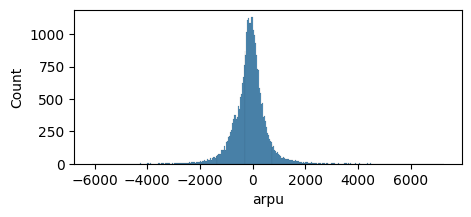

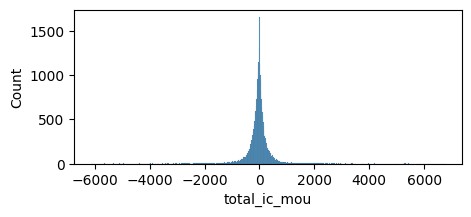

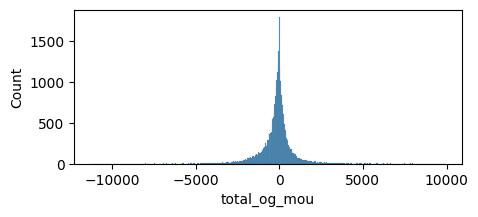

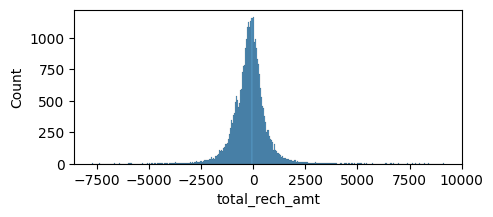

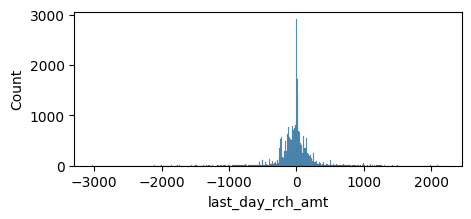

...

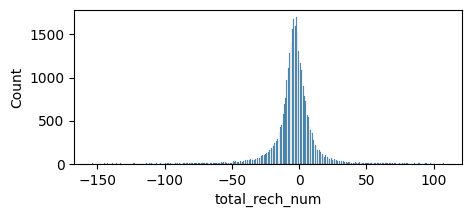

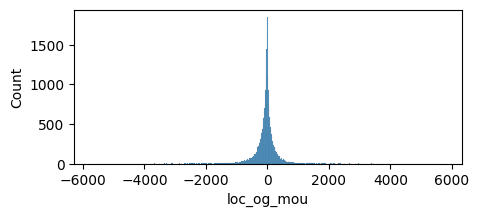

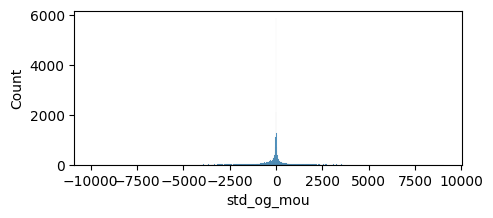

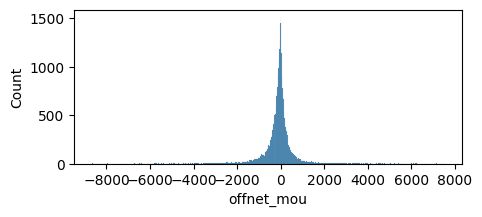

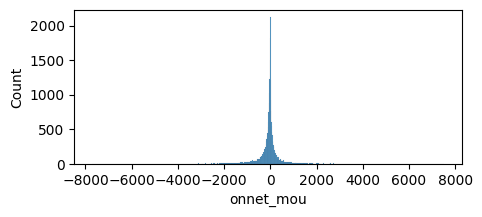

In [73]:
# View the distribution BEFORE TRANSFORM
for feature in net_changes.columns:
    plt.figure(figsize=(5,2))
    sns.histplot(data=net_changes, x=feature)
    plt.title('')
    plt.show()

- Most of the variables already followed a normal distribution, centered around 0 but there are extreme values on both sides.

- We can use boxcox transform to reduce extreme values on both tails. Boxcox transformation can only be used on non negative values, so we transform the absolute values of the data and restore the negative sign after transformation.

In [74]:
for feature in net_changes.drop(columns='std_og_mou').columns:
    net_changes[feature] = boxcox_tf(net_changes, feature, tf_value=0.7, return_tf=True)
    
net_changes['std_og_mou'] = boxcox_tf(net_changes, 'std_og_mou', tf_value=0.4, return_tf=True)                                    

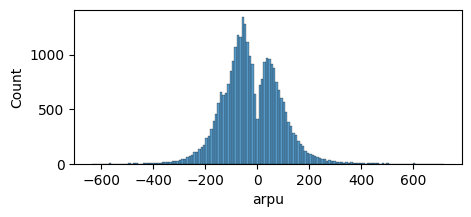

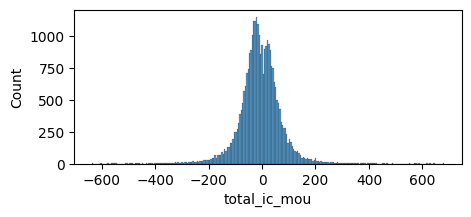

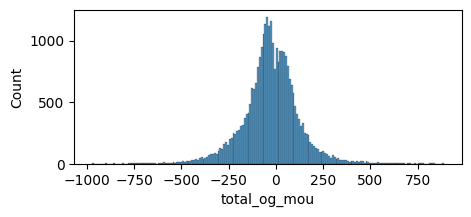

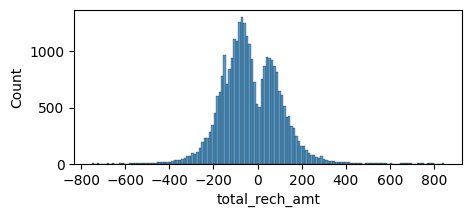

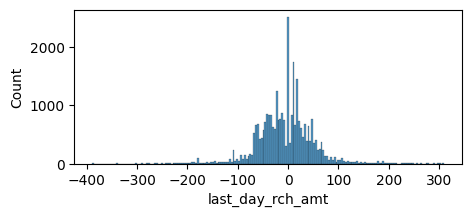

...

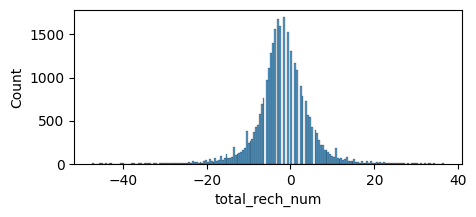

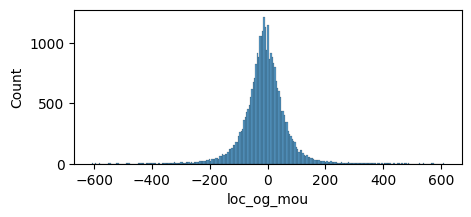

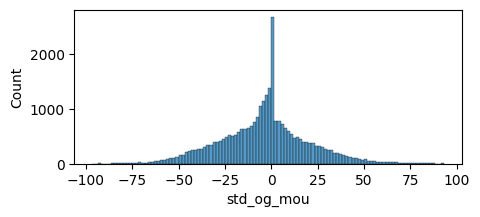

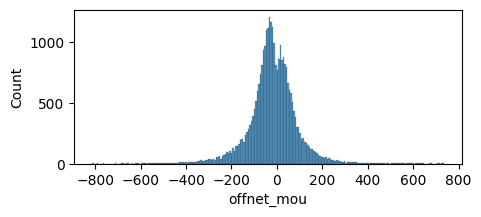

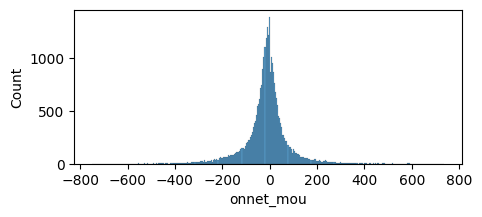

In [75]:
# View the distribution AFTER TRANSFORMED
for feature in net_changes.columns:
    plt.figure(figsize=(5,2))
    sns.histplot(data=net_changes, x=feature)
    plt.title('')
    plt.show()

### Transform data (pct_changes)

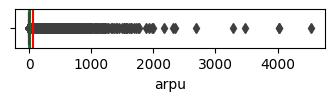

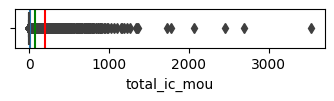

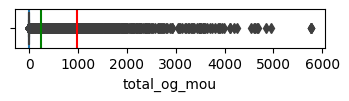

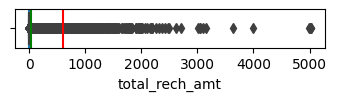

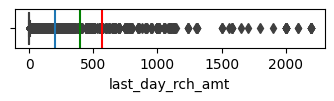

...

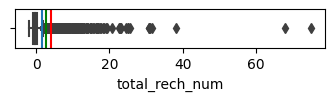

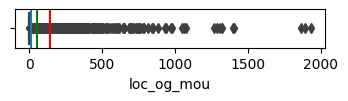

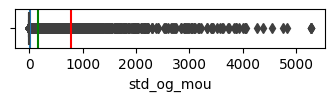

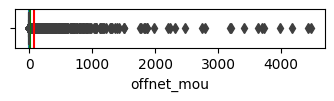

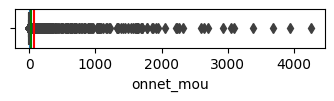

In [76]:
# View the distribution BEFORE TRANSFORMED
for feature in pct_changes.columns:
    plt.figure(figsize=(4,0.5))
    sns.boxplot(data=pct_changes, x=feature)
    plt.axvline(pct_changes[feature].quantile(.95))
    plt.axvline(pct_changes[feature].quantile(.98), color='g')
    plt.axvline(pct_changes[feature].quantile(.99), color='r')
    plt.title('')
    plt.show()

In [77]:
# cap all values at 5
pct_changes = pct_changes.applymap(lambda x: x if x <= 5 else 5)

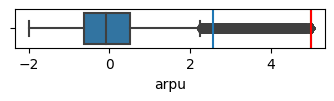

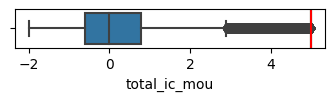

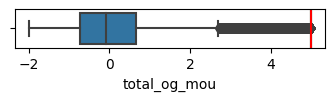

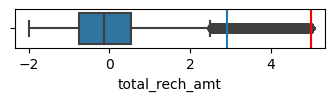

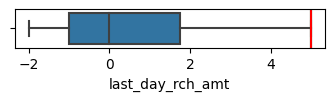

...

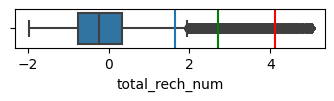

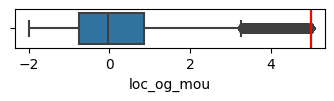

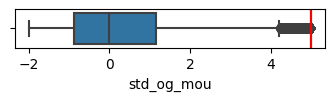

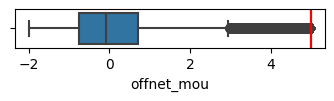

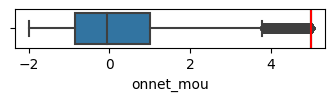

In [78]:
# View the distribution AFTER TRANSFORMED
for feature in pct_changes.columns:
    plt.figure(figsize=(4,0.5))
    sns.boxplot(data=pct_changes, x=feature)
    plt.axvline(pct_changes[feature].quantile(.95))
    plt.axvline(pct_changes[feature].quantile(.98), color='g')
    plt.axvline(pct_changes[feature].quantile(.99), color='r')
    plt.title('')
    plt.show()

## 5.4 Append derived metrics to the main dataframe

In [79]:
# add _change and _changepct suffix to derived features to avoid confusion
net_changes.columns = [column+'_change' for column in net_changes.columns]
pct_changes.columns = [column+'_changepct' for column in pct_changes.columns]

# append to the main dataframe
df = pd.concat([df, net_changes, pct_changes], axis=1)
df.head()

,arpu_1,arpu_2,arpu_3,onnet_mou_1,onnet_mou_2,onnet_mou_3,offnet_mou_1,offnet_mou_2,offnet_mou_3,roam_ic_mou_1,roam_ic_mou_2,roam_ic_mou_3,roam_og_mou_1,roam_og_mou_2,roam_og_mou_3,loc_og_t2t_mou_1,loc_og_t2t_mou_2,loc_og_t2t_mou_3,loc_og_t2m_mou_1,loc_og_t2m_mou_2,loc_og_t2m_mou_3,loc_og_t2f_mou_1,loc_og_t2f_mou_2,loc_og_t2f_mou_3,loc_og_t2c_mou_1,loc_og_t2c_mou_2,loc_og_t2c_mou_3,loc_og_mou_1,loc_og_mou_2,loc_og_mou_3,std_og_t2t_mou_1,std_og_t2t_mou_2,std_og_t2t_mou_3,std_og_t2m_mou_1,std_og_t2m_mou_2,std_og_t2m_mou_3,std_og_t2f_mou_1,std_og_t2f_mou_2,std_og_t2f_mou_3,std_og_mou_1,std_og_mou_2,std_og_mou_3,isd_og_mou_1,isd_og_mou_2,isd_og_mou_3,spl_og_mou_1,spl_og_mou_2,spl_og_mou_3,og_others_1,og_others_2,og_others_3,total_og_mou_1,total_og_mou_2,total_og_mou_3,loc_ic_t2t_mou_1,loc_ic_t2t_mou_2,loc_ic_t2t_mou_3,loc_ic_t2m_mou_1,loc_ic_t2m_mou_2,loc_ic_t2m_mou_3,loc_ic_t2f_mou_1,loc_ic_t2f_mou_2,loc_ic_t2f_mou_3,loc_ic_mou_1,loc_ic_mou_2,loc_ic_mou_3,std_ic_t2t_mou_1,std_ic_t2t_mou_2,std_ic_t2t_mou_3,std_ic_t2m_mou_1,std_ic_t2m_mou_2,std_ic_t2m_mou_3,std_ic_t2f_mou_1,std_ic_t2f_mou_2,std_ic_t2f_mou_3,std_ic_mou_1,std_ic_mou_2,std_ic_mou_3,total_ic_mou_1,total_ic_mou_2,total_ic_mou_3,spl_ic_mou_1,spl_ic_mou_2,spl_ic_mou_3,isd_ic_mou_1,isd_ic_mou_2,isd_ic_mou_3,ic_others_1,ic_others_2,ic_others_3,total_rech_num_1,total_rech_num_2,total_rech_num_3,total_rech_amt_1,total_rech_amt_2,total_rech_amt_3,max_rech_amt_1,max_rech_amt_2,max_rech_amt_3,date_of_last_rech_1,date_of_last_rech_2,date_of_last_rech_3,last_day_rch_amt_1,last_day_rch_amt_2,last_day_rch_amt_3,vol_2g_mb_1,vol_2g_mb_2,vol_2g_mb_3,vol_3g_mb_1,vol_3g_mb_2,vol_3g_mb_3,monthly_2g_1,monthly_2g_2,monthly_2g_3,sachet_2g_1,sachet_2g_2,sachet_2g_3,monthly_3g_1,monthly_3g_2,monthly_3g_3,sachet_3g_1,sachet_3g_2,sachet_3g_3,aon,vbc_3g_3,vbc_3g_2,vbc_3g_1,Churn,arpu_change,total_ic_mou_change,total_og_mou_change,total_rech_amt_change,last_day_rch_amt_change,max_rech_amt_change,total_rech_num_change,loc_og_mou_change,std_og_mou_change,offnet_mou_change,onnet_mou_change,arpu_changepct,total_ic_mou_changepct,total_og_mou_changepct,total_rech_amt_changepct,last_day_rch_amt_changepct,max_rech_amt_changepct,total_rech_num_changepct,loc_og_mou_changepct,std_og_mou_changepct,offnet_mou_changepct,onnet_mou_changepct
0,11.485973,12.462350,16.805123,2.251364,2.226208,2.206397,6.265462,6.700569,5.674522,1.746078,2.018287,1.995480,1.884066,1.659607,2.070588,2.198749,1.992189,2.094199,3.146934,3.389497,2.767279,2.283812,2.229941,2.214274,0.0,0.0,0.00,3.350390,3.511508,3.030936,1.338732,1.876869,1.644026,2.185761,1.996991,2.179150,1.46115,1.822018,1.755655,2.274398,2.372325,2.389134,0.0,0.18,10.01,1.350960,0.000000,1.454061,0.000000,0.0,0.0,6.403249,6.845994,5.798023,2.253694,2.003239,1.937601,2.934376,2.944902,2.610318,2.731870,2.519179,2.086341,3.359421,3.236696,2.850034,2.057698,1.639068,1.979457,2.467330,2.634838,2.691825,2.205553,2.027247,1.859130,2.826928,2.803170,2.867698,626.46,558.04,428.74,0.21,0.0,0.0,2.06,14.53,31.59,15.74,15.19,15.14,1.620657,1.620657,1.792790,9.111652,7.400961,11.701965,9.111652,7.400961,9.111652,27.0,25.0,26.0,0.000000,0.000000,7.369894,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0,0,0,0.0,0.0,0.000000,0,0,0,0.0,0.0,0.0,802,57.74,19.38,18.74,1,466.936285,-80.991348,-92.847117,546.183736,243.982550,151.196366,2.978813,-100.686191,5.897697,-88.201580,-5.191127,3.312942,-0.546401,-0.705745,4.902213,5.000000,0.998736,0.666667,-0.913099,0.309952,-0.705232,-0.137247
1,7.987517,8.755010,5.600842,3.336837,3.229006,2.037098,3.916066,3.732063,4.370395,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.123125,2.934457,1.656962,2.407987,2.342806,2.191427,0.000000,0.000000,0.000000,0.0,0.0,7.15,3.277321,3.104079,2.290463,2.590060,2.661036,1.865283,1.687643,1.586159,2.375788,0.00000,0.000000,0.000000,2.648270,2.699966,2.503185,0.0,0.00,0.00,0.000000,0.000000,1.592118,0.000000,0.0,0.0,6.484125,6.173658,4.680851,1.885651,1.579789,0.791175,2.249336,1.694734,1.729634,0.00000

In [80]:
df.shape

(30011, 150)

In [81]:
# make a backup
df.to_csv('derived_features.csv', index=False)

# 6. Train test split

## Train test split

In [82]:
# load the data if needed
# df = pd.read_csv('derived_features.csv')

In [83]:
X = df.drop(columns='Churn')
Y = df.Churn

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, stratify = Y, test_size=0.1, random_state=42)

## Feature scaling

Since we have a lot of extreme values in our data, we need to scale them with min max scaler to bring them to the same range.

In [84]:
minmax = MinMaxScaler()
X_train_minmax = minmax.fit_transform(X_train)
X_test_minmax = minmax.transform(X_test)

# 7. Principal Components Analysis

In [85]:
pca = PCA(random_state=42)
pca.fit(X_train_minmax)

PCA(random_state=42)

Cumulative Explained Variance per component

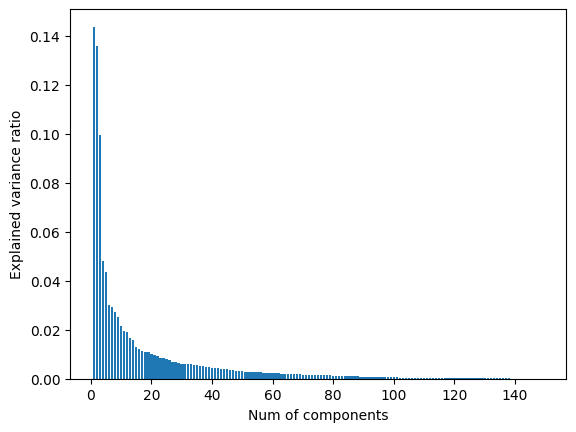

In [86]:
plt.bar(range(1,len(pca.explained_variance_ratio_)+1), pca.explained_variance_ratio_)
plt.ylabel('Explained variance ratio')
plt.xlabel('Num of components')
plt.show()

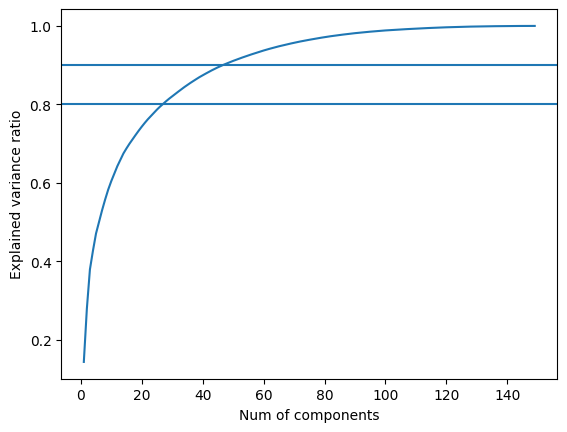

In [87]:
var_cumu = np.cumsum(pca.explained_variance_ratio_)
plt.plot(range(1,len(var_cumu)+1), var_cumu)
plt.axhline(0.8)
plt.axhline(0.9)
plt.ylabel('Explained variance ratio')
plt.xlabel('Num of components')
plt.show()

In [88]:
# n components for 80%, 85% and 90% explained variance
n_components_80 = np.argmax(var_cumu >= .8) + 1
n_components_85 = np.argmax(var_cumu >= .85) + 1
n_components_90 = np.argmax(var_cumu >= .9) + 1

print(f'Need {n_components_80} components to explain 80% of variance in the data') 
print(f'Need {n_components_85} components to explain 85% of variance in the data') 
print(f'Need {n_components_90} components to explain 90% of variance in the data') 

Need 27 components to explain 80% of variance in the data
Need 36 components to explain 85% of variance in the data
Need 47 components to explain 90% of variance in the data


- From the plot above, it seems that around 80% and 90% is a good range in term of the number of components required. Any more than that will see a large disminishing return in explained variance per components.
- In an experiments not included here, models built with 80% variance seemed slightly underfitting, while 90% took much more time to train/hyperparameter tuning. 
- 36 components/85% variance is a good tradeoff for both model accuracy and computational cost.

In [89]:
# create PCs from the original data
pca85 = PCA(n_components=0.85, random_state = 42)
X_train_pc = pd.DataFrame(pca85.fit_transform(X_train_minmax))
X_train_pc.index = X_train.index
X_test_pc = pd.DataFrame(pca85.transform(X_test_minmax))
X_test_pc.index = X_test.index

# 8. Model building with principle components (85% explained variance)

## Summary

- **Evaluation metrics:** Since the the data is imbalanced and it is more important to identify churners, main evaluation metric is F1, with a slight priority for Recall over Precision.
>- Higher Recall means lower false negative, hence less revenue loss.
>- At the same time, we also want to reduce the false positives, albeit to a lesser extent, so that the resource and time can be spent more effectively on retaining the actual churners. For this reason, Precision will be taken into consideration with lower priority.
>- F1 is the harmonic mean of both precision and recall.

- **Models include:** Logistic regression -> Random Forest -> ADABoost -> XGBoost. For each model, different variations of data (original data vs PCA, imbalanced data vs SMOTE/ADASYN) are used to experiment and evaluate whether these techniques can help improving prediction. Full orders:
>1. Logistic Regression + imbalanced data
>2. Logistic Regression + SMOTE
>3. Logistic Regression + ADASYN
>4. Random Forest + imbalanced data
>5. Random Forest + SMOTE
>6. ADABoost + imbalanced data
>7. XGBoost + original 150 correlated features
>8. XGBoost + PCs, imbalanced
>9. XGBoost + PCs + SMOTE

- **Hyperparameter tuning** with RandomSearch and **adjusting optimal cutoff** using Precision/Recall curve will be done after baseline models.

**Note:** Some of the hyperparameter tunings take several minutes each to run (up to 10 minutes on my local machine). If it's taking too long to run on yours, I recommend reducing the n_iter parameters. This will not affect reproducibility of the models, as I already copied the best parameters during my run to the cell below for model building.

## Functions

In [90]:
# check VIF
def checking_vif(top_features):
    data = x_train[top_features]
    result = pd.DataFrame()
    result['feature'] = data.columns

    # Calculating VIF for each feature
    result['VIF'] = [
        vif(data.values, i) for i in range(len(data.columns))
    ]
    result['VIF'] = result['VIF'].apply(lambda x: round(x,2))
    return result.sort_values('VIF', ascending=False)

In [91]:
# function to display confusion matrix on train and test data
def cf_train_test(y_train_actual, y_train_predicted, y_test_actual, y_test_predicted): 
    fig, [ax1,ax2] = plt.subplots(ncols=2, figsize=(8,4))
    
    heatmap_labels = ['Not churn', 'Churn']
    sns.heatmap(confusion_matrix(y_train_actual, y_train_predicted), annot=True,  fmt='.2f', 
                xticklabels= heatmap_labels, yticklabels= heatmap_labels,
               cbar=False, ax=ax1) 
    sns.heatmap(confusion_matrix(y_test_actual, y_test_predicted), annot=True,  fmt='.2f', 
                xticklabels=heatmap_labels, yticklabels=heatmap_labels,
               cbar=False, ax=ax2) 
    ax1.set(ylabel='Actual', xlabel='Predicted', title='Train') 
    ax2.set(ylabel='Actual', xlabel='Predicted', title='Test')
    plt.show()

In [92]:
# display confusion matrix and classification report
def cm_report(y_train, yhat_train, y_test, yhat_test):
    print(f'AUC: {roc_auc_score(y_test, yhat_test):.4f}')
    cf_train_test(y_train, yhat_train, y_test, yhat_test)
    print('Train')
    print(classification_report(y_train,yhat_train))
    print('Test')
    print(classification_report(y_test,yhat_test))

In [93]:
# function for fitting the data and display confusion matrix in one line
def build_lg(features, threshold=0.5, cf=True, summary=True):
    '''
    features: list like, INCLUDING const
    '''
    logres = sm.GLM(y_train, x_train[features], family = sm.families.Binomial())
    model = logres.fit()
    
    # display model summary
    if summary:
        print(model.summary())
    
    yhat_train = model.predict(x_train[features])
    yhat_train = yhat_train.apply(lambda x: 1 if x>threshold else 0)
    yhat_test = model.predict(x_test[features])
    yhat_test = yhat_test.apply(lambda x: 1 if x>threshold else 0)
    # display model classification performance
    if cf:
        cm_report(y_train, yhat_train, y_test, yhat_test)
    return model

In [94]:
# function to plot precision/recall curve (for statmodel, which .predict -> output probability)
def pre_rec_curve(model, x_train, y_train, threshold=0.5):
    
    y_scores=model.predict(x_train)
    precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)
    thresholds = np.insert(thresholds, 0, 0)
    F1_score = 2*precisions*recalls/(precisions+recalls)

    # Plot values of precisions, recalls, and thresholds
    plt.figure(figsize=(10,7))
    plt.plot(thresholds, precisions, 'b--', label='precision')
    plt.plot(thresholds, recalls, 'g--', label = 'recall')
    plt.plot(thresholds, F1_score, 'r--', label = 'f1 score')

    plt.xlabel('Threshold')
    plt.legend(loc='upper left')
    plt.ylim([0.3,1])
    plt.axvline(threshold)
    plt.show()
    
# function to plot precision/recall curve for sklearn (use predict_proba)
def pre_rec_curve_tree(model, x_train, y_train, threshold=0.5):
    
    y_scores=model.predict_proba(x_train)[:,1]
    precisions, recalls, thresholds = precision_recall_curve(y_train, y_scores)
    thresholds = np.insert(thresholds, 0, 0)
    F1_score = 2*precisions*recalls/(precisions+recalls)

    # Plot values of precisions, recalls, and thresholds
    plt.figure(figsize=(10,7))
    plt.plot(thresholds, precisions, 'b--', label='precision')
    plt.plot(thresholds, recalls, 'g--', label = 'recall')
    plt.plot(thresholds, F1_score, 'r--', label = 'f1 score')

    plt.xlabel('Threshold')
    plt.legend(loc='upper left')
    plt.ylim([0.3,1])
    plt.axvline(threshold)
    plt.show()

In [95]:
# store performance result for comparing:
def model_performance(model_name, y_test, yhat_test, yhat_test_proba):
    accuracy = accuracy_score(y_test, yhat_test)
    f1 = f1_score(y_test, yhat_test)
    precision = precision_score(y_test, yhat_test)
    recall = recall_score(y_test, yhat_test)
    auc = roc_auc_score(y_test, yhat_test)
    
    return [model_name, accuracy, f1, precision, recall, auc], y_test, yhat_test_proba

## 8.1 Logistic regression without handling data imbalance

In [96]:
# note: 
# X_train, Y_train (capital X, Y) ---> "global" variable, original train/test split without any scaling, pca, upsampling
# x_train, y_train (lower x, y) "local" variables processed for a specific models.

#         X_train_ups, y_train_ups if upsampling, else X_train_pc, Y_train
x_train = sm.add_constant(X_train_pc)
y_train = Y_train.copy()

x_test = sm.add_constant(X_test_pc)
y_test = Y_test.copy()

### Check VIF

In [97]:
checking_vif(x_train.columns)

,feature,VIF
0,const,1.0
19,18,1.0
21,20,1.0
22,21,1.0
23,22,1.0
24,23,1.0
25,24,1.0
26,25,1.0
27,26,1.0
28,27,1.0


### Model building

Iteration 1
-- Feature with highest p-value '31': 0.9817
-> Dropped feature '31'.
____________________________________________________________
Iteration 2
-- Feature with highest p-value '23': 0.8763
-> Dropped feature '23'.
____________________________________________________________
Iteration 3
-- Feature with highest p-value '35': 0.7772
-> Dropped feature '35'.
____________________________________________________________
Iteration 4
-- Feature with highest p-value '30': 0.4821
-> Dropped feature '30'.
____________________________________________________________
Iteration 5
-- Feature with highest p-value '26': 0.2642
-> Dropped feature '26'.
____________________________________________________________
Iteration 6
-- Feature with highest p-value '16': 0.1212
-> Dropped feature '16'.
____________________________________________________________
Iteration 7
-- Feature with highest p-value '22': 0.1057
-> Dropped feature '22'.
____________________________________________________________

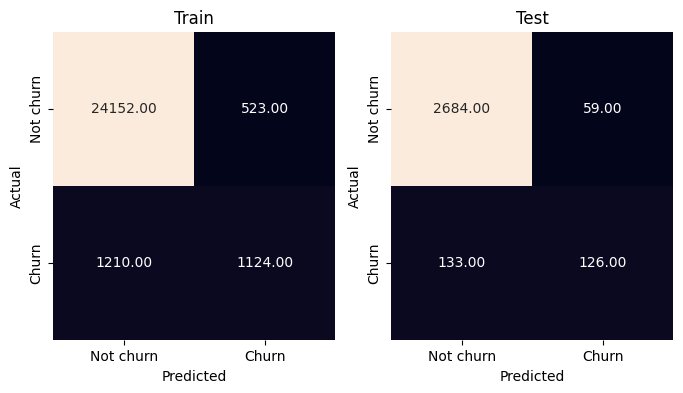

Train
              precision    recall  f1-score   support

           0       0.95      0.98      0.97     24675
           1       0.68      0.48      0.56      2334

    accuracy                           0.94     27009
   macro avg       0.82      0.73      0.77     27009
weighted avg       0.93      0.94      0.93     27009

Test
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2743
           1       0.68      0.49      0.57       259

    accuracy                           0.94      3002
   macro avg       0.82      0.73      0.77      3002
weighted avg       0.93      0.94      0.93      3002



In [98]:
# get feature list
features = x_train.columns.to_list()

# Iteration 1
iteration = 1
print(f'Iteration {iteration}')

# build model;
lg_model = build_lg(features, cf=False, summary=False)

# feature with highest p values
feature_highest_pv = lg_model.pvalues[lg_model.pvalues == lg_model.pvalues.max()].index[0]
print(f'-- Feature with highest p-value \'{feature_highest_pv}\': {lg_model.pvalues.max():.4f}')

# keep eliminating feature whose p-value>0.05
while lg_model.pvalues.max() > 0.05:
    # drop
    features.remove(feature_highest_pv)
    print(f'-> Dropped feature \'{feature_highest_pv}\'.')
    print('_'*60)
    
    # Next iteration
    iteration += 1
    print(f'Iteration {iteration}')
    # train again
    lg_model = build_lg(features, cf=False, summary=False)
    # feature with highest p values
    feature_highest_pv = lg_model.pvalues[lg_model.pvalues == lg_model.pvalues.max()].index[0]
    print(f'-- Feature with highest p-value \'{feature_highest_pv}\': {lg_model.pvalues.max():.4f}')

print('All features are significant. (p-values < 0.05)')
print('_'*60)

lg_model = build_lg(features)

### Adjust threshold

Plot the precision/recall curve

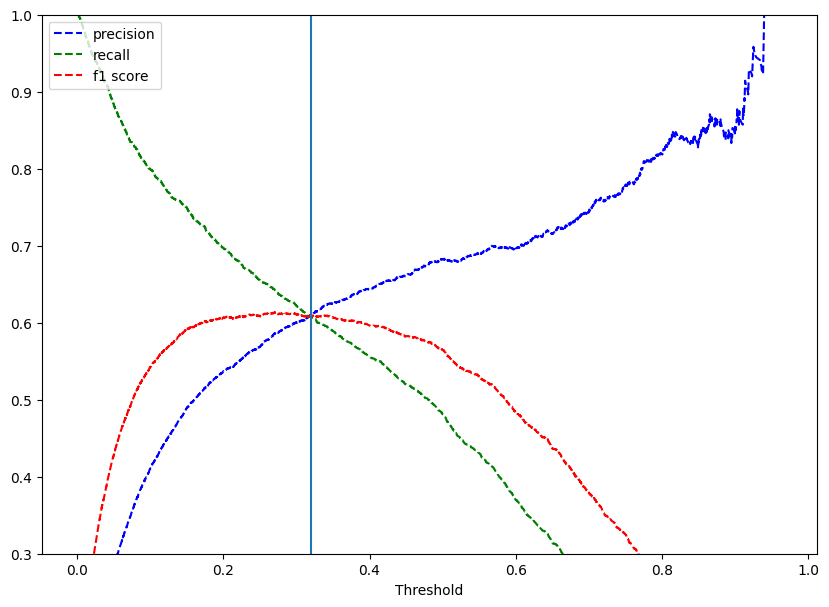

In [99]:
# precision/recall trade off

pre_rec_curve(lg_model, sm.add_constant(X_train_pc)[features], Y_train, threshold=0.32)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                27009
Model:                            GLM   Df Residuals:                    26980
Model Family:                Binomial   Df Model:                           28
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -4640.7
Date:                Mon, 05 Jun 2023   Deviance:                       9281.4
Time:                        15:22:13   Pearson chi2:                 2.70e+04
No. Iterations:                     7   Pseudo R-squ. (CS):             0.2171
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -3.6155      0.046    -78.455      0.0

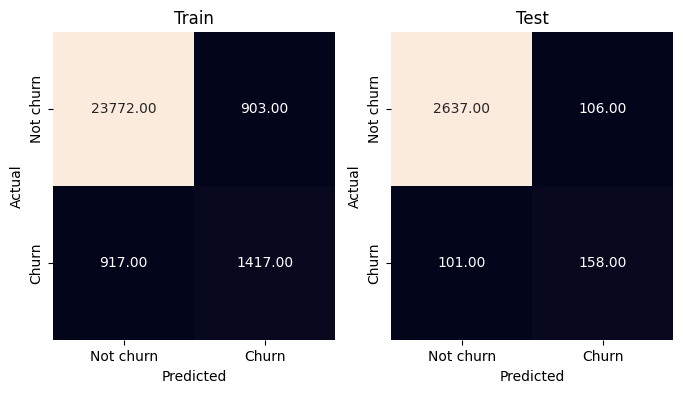

Train
              precision    recall  f1-score   support

           0       0.96      0.96      0.96     24675
           1       0.61      0.61      0.61      2334

    accuracy                           0.93     27009
   macro avg       0.79      0.79      0.79     27009
weighted avg       0.93      0.93      0.93     27009

Test
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      2743
           1       0.60      0.61      0.60       259

    accuracy                           0.93      3002
   macro avg       0.78      0.79      0.78      3002
weighted avg       0.93      0.93      0.93      3002



In [100]:
build_lg(features, threshold=0.32)

In [101]:
# store performance metrics
yhat_test_proba = lg_model.predict(x_test[features])
yhat_test = yhat_test_proba> 0.32
LG_no_upsampled = model_performance('LG_no_upsampled', y_test, yhat_test, yhat_test_proba)

## 8.2 Logistic regression + SMOTE

### Handle imbalanced class

In [102]:
# SMOTE
smote = SMOTE(random_state=42, k_neighbors=5)
X_train_ups, y_train_ups = smote.fit_resample(X_train_pc, Y_train)

In [103]:
X_train_ups.shape, y_train_ups.shape, y_train_ups.value_counts()

((49350, 36),
 (49350,),
 0    24675
 1    24675
 Name: Churn, dtype: int64)

In [104]:
# note: 
# X_train, Y_train (capital X, Y) ---> "global" variable, original train/test split without any scaling, pca, upsampling
# x_train, y_train (lower x, y) "local" variables for a specific models.

#         X_train_ups, y_train_ups if upsampling, else X_train_pc, Y_train
x_train = sm.add_constant(X_train_ups)
y_train = y_train_ups.copy()

x_test = sm.add_constant(X_test_pc)
y_test = Y_test.copy()

### Check VIF

In [105]:
checking_vif(x_train.columns)

,feature,VIF
0,const,1.38
2,1,1.28
1,0,1.28
16,15,1.23
3,2,1.20
12,11,1.19
23,22,1.18
11,10,1.15
25,24,1.14
14,13,1.13


### Model building and remove insignicant features

Iteration 1
-- Feature with highest p-value '30': 0.4497
-> Dropped feature '30'.
____________________________________________________________
Iteration 2
-- Feature with highest p-value '35': 0.0117
All features are significant. (p-values < 0.05)
____________________________________________________________
                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                49350
Model:                            GLM   Df Residuals:                    49314
Model Family:                Binomial   Df Model:                           35
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -17050.
Date:                Mon, 05 Jun 2023   Deviance:                       34100.
Time:                        15:22:16   Pearson chi2:                 5.82e+04
No. Iterations:                     6   Pseudo R-squ. (CS):

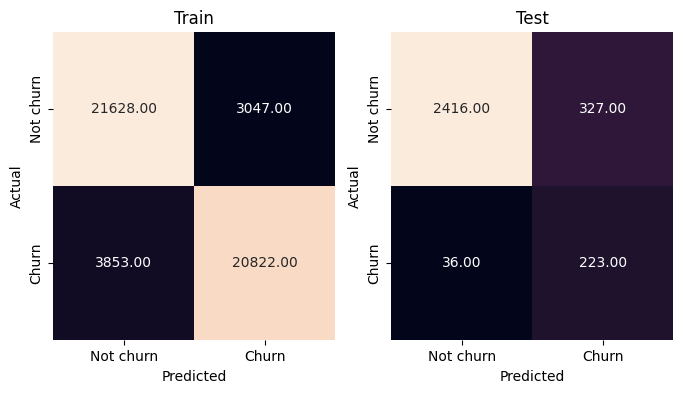

Train
              precision    recall  f1-score   support

           0       0.85      0.88      0.86     24675
           1       0.87      0.84      0.86     24675

    accuracy                           0.86     49350
   macro avg       0.86      0.86      0.86     49350
weighted avg       0.86      0.86      0.86     49350

Test
              precision    recall  f1-score   support

           0       0.99      0.88      0.93      2743
           1       0.41      0.86      0.55       259

    accuracy                           0.88      3002
   macro avg       0.70      0.87      0.74      3002
weighted avg       0.94      0.88      0.90      3002



In [106]:
# get feature list
features = x_train.columns.to_list()

# Iteration 1
iteration = 1
print(f'Iteration {iteration}')

# build model;
lg_model = build_lg(features, cf=False, summary=False)

# feature with highest p values
feature_highest_pv = lg_model.pvalues[lg_model.pvalues == lg_model.pvalues.max()].index[0]
print(f'-- Feature with highest p-value \'{feature_highest_pv}\': {lg_model.pvalues.max():.4f}')

# if more than 0.05
while lg_model.pvalues.max() > 0.05:
    # drop
    features.remove(feature_highest_pv)
    print(f'-> Dropped feature \'{feature_highest_pv}\'.')
    print('_'*60)
    
    # Next iteration
    iteration += 1
    print(f'Iteration {iteration}')
    # train again
    lg_model = build_lg(features, cf=False, summary=False)
    # feature with highest p values
    feature_highest_pv = lg_model.pvalues[lg_model.pvalues == lg_model.pvalues.max()].index[0]
    print(f'-- Feature with highest p-value \'{feature_highest_pv}\': {lg_model.pvalues.max():.4f}')

print('All features are significant. (p-values < 0.05)')
print('_'*60)

lg_model = build_lg(features)

### Adjust threshold

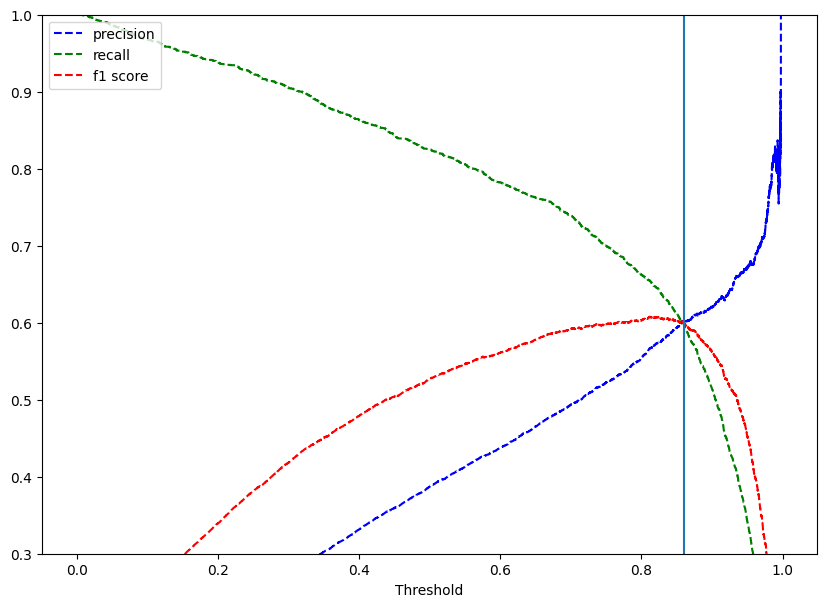

In [107]:
# precision/recall trade off for 
pre_rec_curve(lg_model, sm.add_constant(X_train_pc)[features], Y_train, threshold=0.86)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                49350
Model:                            GLM   Df Residuals:                    49314
Model Family:                Binomial   Df Model:                           35
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -17050.
Date:                Mon, 05 Jun 2023   Deviance:                       34100.
Time:                        15:22:16   Pearson chi2:                 5.82e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.5011
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.5347      0.019    -79.137      0.0

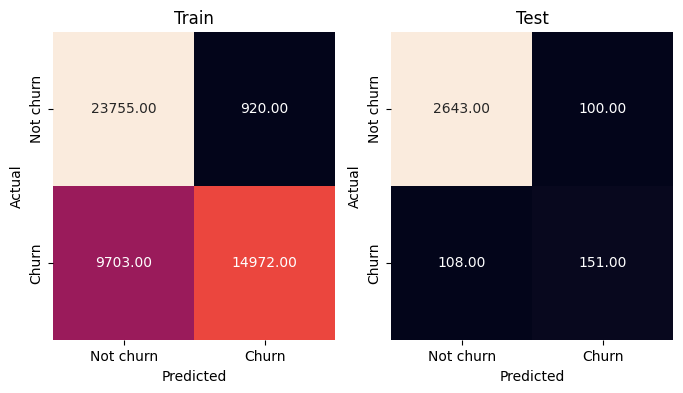

Train
              precision    recall  f1-score   support

           0       0.71      0.96      0.82     24675
           1       0.94      0.61      0.74     24675

    accuracy                           0.78     49350
   macro avg       0.83      0.78      0.78     49350
weighted avg       0.83      0.78      0.78     49350

Test
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      2743
           1       0.60      0.58      0.59       259

    accuracy                           0.93      3002
   macro avg       0.78      0.77      0.78      3002
weighted avg       0.93      0.93      0.93      3002



In [108]:
build_lg(features, threshold=0.86)

In [109]:
# store performance metrics
yhat_test_proba = lg_model.predict(x_test[features])
yhat_test = yhat_test_proba> 0.86
LG_smote = model_performance('LG_smote', y_test, yhat_test, yhat_test_proba)

## 8.3 Logistic regression + ADASYN

### Handle imbalanced class

In [110]:
# ADASYN
adas = ADASYN(random_state=42, n_neighbors=5)
X_train_ups, y_train_ups = adas.fit_resample(X_train_pc, Y_train)

In [111]:
X_train_ups.shape, y_train_ups.shape, y_train_ups.value_counts()

((49287, 36),
 (49287,),
 0    24675
 1    24612
 Name: Churn, dtype: int64)

In [112]:
# note: 
# X_train, Y_train (capital X, Y) ---> "global" variable, original train/test split without any scaling, pca, upsampling
# x_train, y_train (lower x, y) "local" variables for a specific models.

#         X_train_ups, y_train_ups if upsampling, else X_train_pc, Y_train
x_train = sm.add_constant(X_train_ups)
y_train = y_train_ups.copy()

x_test = sm.add_constant(X_test_pc)
y_test = Y_test

### Check VIF

In [113]:
checking_vif(x_train.columns)

,feature,VIF
0,const,1.27
2,1,1.13
1,0,1.12
25,24,1.11
23,22,1.10
3,2,1.08
4,3,1.08
16,15,1.08
14,13,1.08
12,11,1.08


### Model building and remove insignicant features

Iteration 1
-- Feature with highest p-value '16': 0.0332
All features are significant. (p-values < 0.05)
____________________________________________________________
                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                49287
Model:                            GLM   Df Residuals:                    49250
Model Family:                Binomial   Df Model:                           36
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -21130.
Date:                Mon, 05 Jun 2023   Deviance:                       42259.
Time:                        15:22:19   Pearson chi2:                 5.83e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4107
Covariance Type:            nonrobust                                         
                 coef    std err          z 

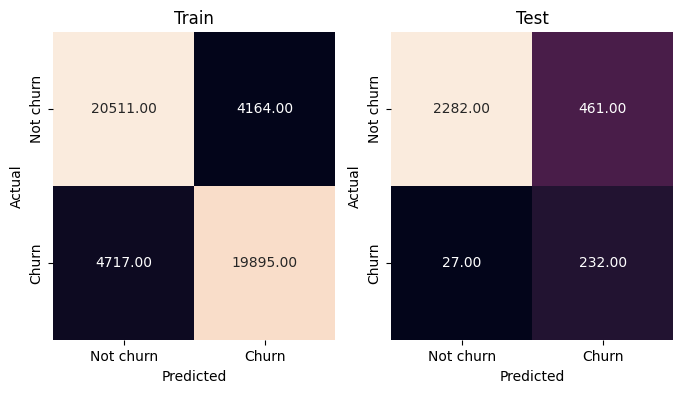

Train
              precision    recall  f1-score   support

           0       0.81      0.83      0.82     24675
           1       0.83      0.81      0.82     24612

    accuracy                           0.82     49287
   macro avg       0.82      0.82      0.82     49287
weighted avg       0.82      0.82      0.82     49287

Test
              precision    recall  f1-score   support

           0       0.99      0.83      0.90      2743
           1       0.33      0.90      0.49       259

    accuracy                           0.84      3002
   macro avg       0.66      0.86      0.70      3002
weighted avg       0.93      0.84      0.87      3002



In [114]:
# get feature list
features = x_train.columns.to_list()

# Iteration 1
iteration = 1
print(f'Iteration {iteration}')

# build model;
lg_model = build_lg(features, cf=False, summary=False)

# feature with highest p values
feature_highest_pv = lg_model.pvalues[lg_model.pvalues == lg_model.pvalues.max()].index[0]
print(f'-- Feature with highest p-value \'{feature_highest_pv}\': {lg_model.pvalues.max():.4f}')

# if more than 0.05
while lg_model.pvalues.max() > 0.05:
    # drop
    features.remove(feature_highest_pv)
    print(f'-> Dropped feature \'{feature_highest_pv}\'.')
    print('_'*60)
    
    # Next iteration
    iteration += 1
    print(f'Iteration {iteration}')
    # train again
    lg_model = build_lg(features, cf=False, summary=False)
    # feature with highest p values
    feature_highest_pv = lg_model.pvalues[lg_model.pvalues == lg_model.pvalues.max()].index[0]
    print(f'-- Feature with highest p-value \'{feature_highest_pv}\': {lg_model.pvalues.max():.4f}')

print('All features are significant. (p-values < 0.05)')
print('_'*60)

lg_model = build_lg(features)

### Adjust threshold

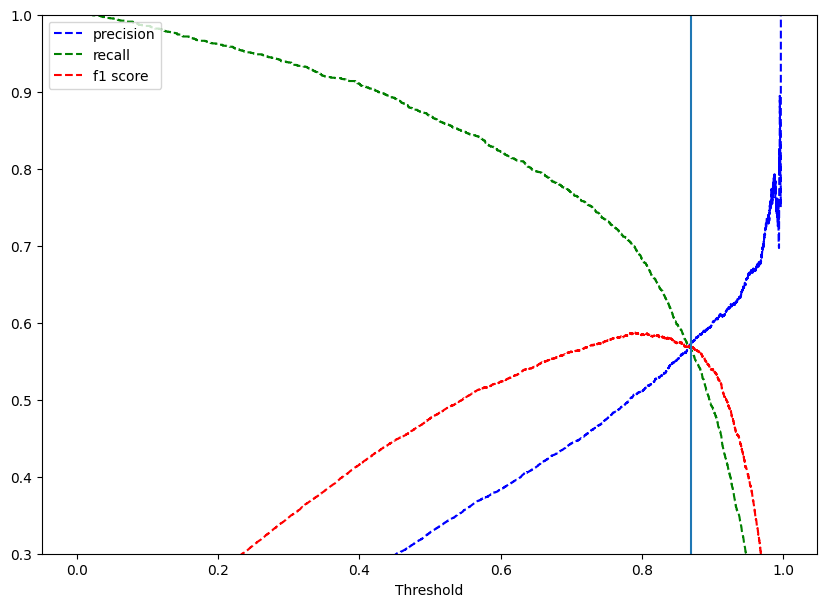

In [115]:
# precision/recall trade off for non-upsampled train set
pre_rec_curve(lg_model, sm.add_constant(X_train_pc)[features], Y_train, threshold=0.87)

                 Generalized Linear Model Regression Results                  
Dep. Variable:                  Churn   No. Observations:                49287
Model:                            GLM   Df Residuals:                    49250
Model Family:                Binomial   Df Model:                           36
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -21130.
Date:                Mon, 05 Jun 2023   Deviance:                       42259.
Time:                        15:22:20   Pearson chi2:                 5.83e+04
No. Iterations:                     6   Pseudo R-squ. (CS):             0.4107
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         -1.0459      0.016    -67.200      0.0

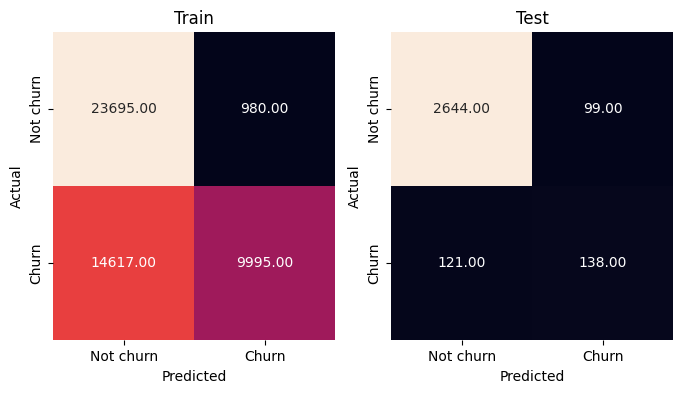

Train
              precision    recall  f1-score   support

           0       0.62      0.96      0.75     24675
           1       0.91      0.41      0.56     24612

    accuracy                           0.68     49287
   macro avg       0.76      0.68      0.66     49287
weighted avg       0.76      0.68      0.66     49287

Test
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      2743
           1       0.58      0.53      0.56       259

    accuracy                           0.93      3002
   macro avg       0.77      0.75      0.76      3002
weighted avg       0.92      0.93      0.93      3002



In [116]:
build_lg(features, threshold=0.87)

In [117]:
# store performance metrics
yhat_test_proba = lg_model.predict(x_test[features])
yhat_test = yhat_test_proba> 0.87
LG_adasyn = model_performance('LG_adasyn', y_test, yhat_test, yhat_test_proba)

## 8.4 Random Forest (no upsampled)

In [118]:
# X_train_pc, Y_train, X_test_pc, Y_test
x_train = X_train_pc.copy()
y_train = Y_train.copy()
x_test = X_test_pc.copy()
y_test = Y_test.copy()

AUC: 0.7716


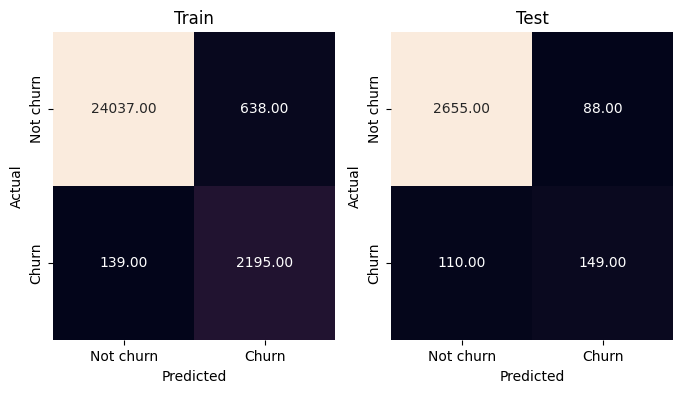

Train
              precision    recall  f1-score   support

           0       0.99      0.97      0.98     24675
           1       0.77      0.94      0.85      2334

    accuracy                           0.97     27009
   macro avg       0.88      0.96      0.92     27009
weighted avg       0.98      0.97      0.97     27009

Test
              precision    recall  f1-score   support

           0       0.96      0.97      0.96      2743
           1       0.63      0.58      0.60       259

    accuracy                           0.93      3002
   macro avg       0.79      0.77      0.78      3002
weighted avg       0.93      0.93      0.93      3002



In [119]:
# Train
rf = RandomForestClassifier(random_state=42, max_depth=12, class_weight={0: 0.086, 1: 0.914})
rf.fit(x_train, y_train)

# Make prediction
yhat_train = rf.predict(x_train)
yhat_test = rf.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

### Hyperparameter tuning

- For random forest, main hyperparameters are max_depth, min_samples_split, min_samples_leaf. 

- The default parameters let the trees grows indefinitely, which tends to be overfitting.

- Reducing/limitting them will help prevent overfitting, but overagressive reducing will lead to underfitting.

- Random search cross validation on stratified kfold  can be used to search for a set of parameters that both optimize for performance and generalizing to new data.

**Note:** Depends on your machine, if it's taking too long to run, I recommend reducing the n_iter parameters. This will not affect reproducibility of the models, as I already copied the best parameters during my run to the cell below for model building.

In [120]:
%%time
# expected time: 3min 5s
# estimator
estimator = RandomForestClassifier(class_weight = {0: 0.086, 1: 0.914}, random_state=42)

# parameter range
params = {"max_depth": np.arange(7,22),
          "min_samples_split": np.arange(5, 100),
          "min_samples_leaf": np.arange(3, 50)
         }

# random search
random_search = RandomizedSearchCV(estimator, param_distributions=params, n_iter=10, cv=StratifiedKFold(n_splits=3), scoring='f1', verbose=2)
random_search.fit(x_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END max_depth=10, min_samples_leaf=14, min_samples_split=50; total time=   5.3s
[CV] END max_depth=10, min_samples_leaf=14, min_samples_split=50; total time=   5.3s
[CV] END max_depth=10, min_samples_leaf=14, min_samples_split=50; total time=   5.3s
[CV] END max_depth=18, min_samples_leaf=21, min_samples_split=26; total time=   5.9s
[CV] END max_depth=18, min_samples_leaf=21, min_samples_split=26; total time=   6.1s
[CV] END max_depth=18, min_samples_leaf=21, min_samples_split=26; total time=   5.9s
[CV] END max_depth=14, min_samples_leaf=11, min_samples_split=17; total time=   6.2s
[CV] END max_depth=14, min_samples_leaf=11, min_samples_split=17; total time=   6.3s
[CV] END max_depth=14, min_samples_leaf=11, min_samples_split=17; total time=   6.2s
[CV] END max_depth=9, min_samples_leaf=18, min_samples_split=49; total time=   5.0s
[CV] END max_depth=9, min_samples_leaf=18, min_samples_split=49; total time=   5.0s
[CV] E

RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
                   estimator=RandomForestClassifier(class_weight={0: 0.086,
                                                                  1: 0.914},
                                                    random_state=42),
                   param_distributions={'max_depth': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]),
                                        'min_samples_leaf': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,...
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
                                        'min_samples_split': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
       56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
       90, 91, 92, 93, 94, 95, 96, 97, 98, 99])},
                   scoring='f1', verbose=2)

In [121]:
# print the best set of hyperparameters found by the random search
print("Best hyperparameters: ", random_search.best_params_)
print("Best cross-validation F1 score: ", random_search.best_score_)

Best hyperparameters:  {'min_samples_split': 22, 'min_samples_leaf': 9, 'max_depth': 16}
Best cross-validation F1 score:  0.6159202809487185


AUC: 0.8031


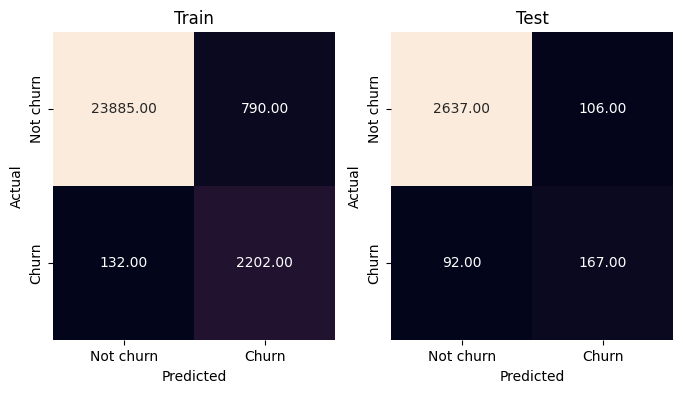

Train
              precision    recall  f1-score   support

           0       0.99      0.97      0.98     24675
           1       0.74      0.94      0.83      2334

    accuracy                           0.97     27009
   macro avg       0.87      0.96      0.90     27009
weighted avg       0.97      0.97      0.97     27009

Test
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      2743
           1       0.61      0.64      0.63       259

    accuracy                           0.93      3002
   macro avg       0.79      0.80      0.80      3002
weighted avg       0.94      0.93      0.93      3002



In [122]:
# The best parameters above can be different after re-run due to the randomness of the search

# Best hyperparameters: {'min_samples_split': 10, 'min_samples_leaf': 9, 'max_depth': 17}
best_params = {'min_samples_split': 10, 'min_samples_leaf': 9, 'max_depth': 17}

# Train
rf = RandomForestClassifier(random_state = 42, class_weight = {0: 0.086, 1: 0.914}, **best_params)

rf.fit(x_train, y_train)

# Make prediction
yhat_train = rf.predict(x_train)
yhat_test = rf.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

### Adjust threshold

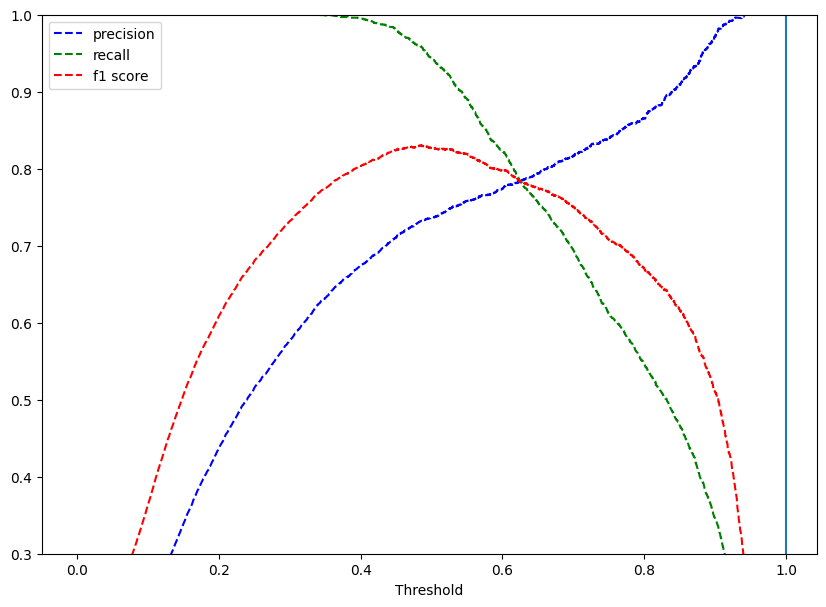

In [123]:
pre_rec_curve_tree(rf, x_train, y_train, threshold=1)

AUC: 0.8031


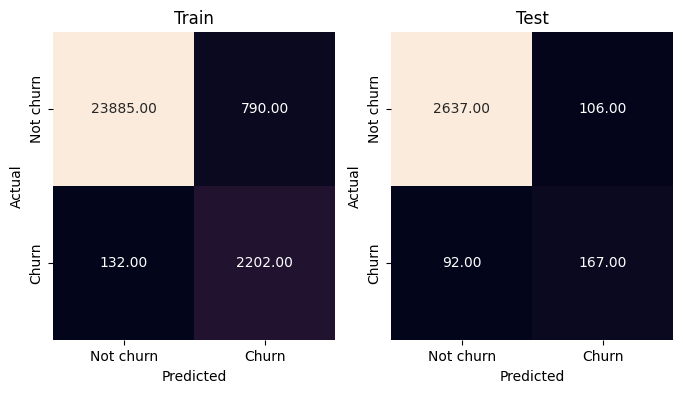

Train
              precision    recall  f1-score   support

           0       0.99      0.97      0.98     24675
           1       0.74      0.94      0.83      2334

    accuracy                           0.97     27009
   macro avg       0.87      0.96      0.90     27009
weighted avg       0.97      0.97      0.97     27009

Test
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      2743
           1       0.61      0.64      0.63       259

    accuracy                           0.93      3002
   macro avg       0.79      0.80      0.80      3002
weighted avg       0.94      0.93      0.93      3002



In [124]:
# Make prediction with adjusted threshold
# while precision/recall crossed at around 0.6, F1 peaked at about 0.5
threshold = .5

yhat_train = rf.predict_proba(x_train)[:,1]>threshold
yhat_test_proba = rf.predict_proba(x_test)[:,1]
yhat_test = yhat_test_proba>threshold

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

In [125]:
# store performance metrics
RF_no_upsampled = model_performance('RF_no_upsampled',y_test , yhat_test, yhat_test_proba)

## 8.5 Random Forest + SMOTE

### Handle imbalanced class

In [126]:
# SMOTE
smote = SMOTE(random_state=42, k_neighbors=5)
X_train_ups, y_train_ups = smote.fit_resample(X_train_pc, Y_train)

In [127]:
X_train_ups.shape, y_train_ups.shape, y_train_ups.value_counts()

((49350, 36),
 (49350,),
 0    24675
 1    24675
 Name: Churn, dtype: int64)

In [128]:
x_train = X_train_ups
y_train = y_train_ups

x_test = X_test_pc.copy()
y_test = Y_test.copy()

### Build RF model

AUC: 0.8108


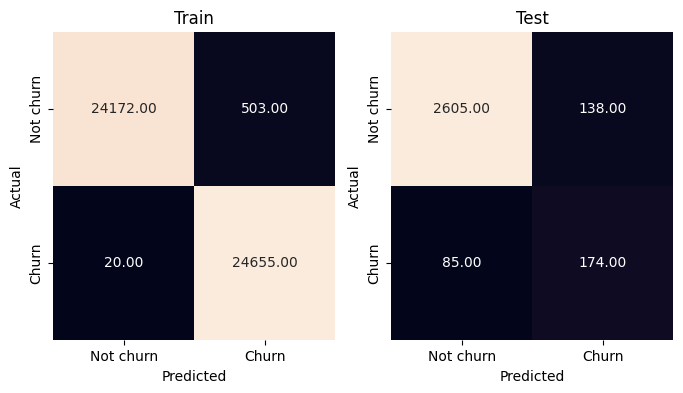

Train
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     24675
           1       0.98      1.00      0.99     24675

    accuracy                           0.99     49350
   macro avg       0.99      0.99      0.99     49350
weighted avg       0.99      0.99      0.99     49350

Test
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      2743
           1       0.56      0.67      0.61       259

    accuracy                           0.93      3002
   macro avg       0.76      0.81      0.78      3002
weighted avg       0.93      0.93      0.93      3002



In [129]:
# Train
rf = RandomForestClassifier(random_state = 42, max_depth=17)

rf.fit(x_train, y_train)

# Make prediction
yhat_train = rf.predict(x_train)
yhat_test = rf.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

### Hyperparameter tuning

- For random forest, main hyperparameters are max_depth, min_samples_split, min_samples_leaf. 

- The default parameters let the trees grows indefinitely, which tends to be overfitting.

- Reducing/limitting them will help prevent overfitting, but overagressive reducing will lead to underfitting.

- Random search cross validation on stratified kfold  can be used to search for a set of parameters that both optimize for performance and generalizing to new data.

**Note:** Depends on your machine, if it's taking too long to run, I recommend reducing the n_iter parameters. This will not affect reproducibility of the models, as I already copied the best parameters during my run to the cell below for model building.

In [130]:
%%time
# estimate time 6min 47s
# estimator
estimator = RandomForestClassifier(class_weight = {0: 0.086, 1: 0.914}, random_state=42)

# parameter range
params = {"max_depth": np.arange(7,22),
          "min_samples_split": np.arange(5, 100),
          "min_samples_leaf": np.arange(3, 50)
         }

# random search
random_search = RandomizedSearchCV(estimator, param_distributions=params, n_iter=10, cv=StratifiedKFold(n_splits=3), scoring='f1', verbose=2)
random_search.fit(x_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=5; total time=   9.1s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=5; total time=   9.1s
[CV] END max_depth=8, min_samples_leaf=40, min_samples_split=5; total time=   9.1s
[CV] END max_depth=14, min_samples_leaf=39, min_samples_split=19; total time=  12.9s
[CV] END max_depth=14, min_samples_leaf=39, min_samples_split=19; total time=  12.6s
[CV] END max_depth=14, min_samples_leaf=39, min_samples_split=19; total time=  12.6s
[CV] END max_depth=13, min_samples_leaf=27, min_samples_split=85; total time=  12.8s
[CV] END max_depth=13, min_samples_leaf=27, min_samples_split=85; total time=  12.4s
[CV] END max_depth=13, min_samples_leaf=27, min_samples_split=85; total time=  12.4s
[CV] END max_depth=14, min_samples_leaf=17, min_samples_split=71; total time=  13.4s
[CV] END max_depth=14, min_samples_leaf=17, min_samples_split=71; total time=  13.2s
[CV] END m

RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
                   estimator=RandomForestClassifier(class_weight={0: 0.086,
                                                                  1: 0.914},
                                                    random_state=42),
                   param_distributions={'max_depth': array([ 7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21]),
                                        'min_samples_leaf': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19,
       20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30,...
       37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
                                        'min_samples_split': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
       56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
       90, 91, 92, 93, 94, 95, 96, 97, 98, 99])},
                   scoring='f1', verbose=2)

In [131]:
# print the best set of hyperparameters found by the random search
print("Best hyperparameters: ", random_search.best_params_)
print("Best cross-validation F1 score: ", random_search.best_score_)

Best hyperparameters:  {'min_samples_split': 66, 'min_samples_leaf': 9, 'max_depth': 15}
Best cross-validation F1 score:  0.8808256005851639


AUC: 0.8356


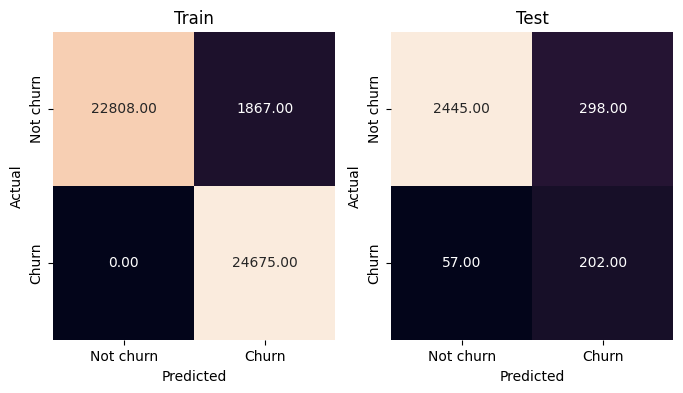

Train
              precision    recall  f1-score   support

           0       1.00      0.92      0.96     24675
           1       0.93      1.00      0.96     24675

    accuracy                           0.96     49350
   macro avg       0.96      0.96      0.96     49350
weighted avg       0.96      0.96      0.96     49350

Test
              precision    recall  f1-score   support

           0       0.98      0.89      0.93      2743
           1       0.40      0.78      0.53       259

    accuracy                           0.88      3002
   macro avg       0.69      0.84      0.73      3002
weighted avg       0.93      0.88      0.90      3002



In [132]:
# The best parameters above can be different after re-run due to the randomness of the search

# Best hyperparameters:  {'min_samples_split': 5, 'min_samples_leaf': 5, 'max_depth': 21}
best_params = {'min_samples_split': 5, 'min_samples_leaf': 5, 'max_depth': 21}

# Train
rf = RandomForestClassifier(random_state = 42, class_weight = {0: 0.086, 1: 0.914}, **best_params)

rf.fit(x_train, y_train)

# Make prediction
yhat_train = rf.predict(x_train)
yhat_test = rf.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

### Adjust threshold

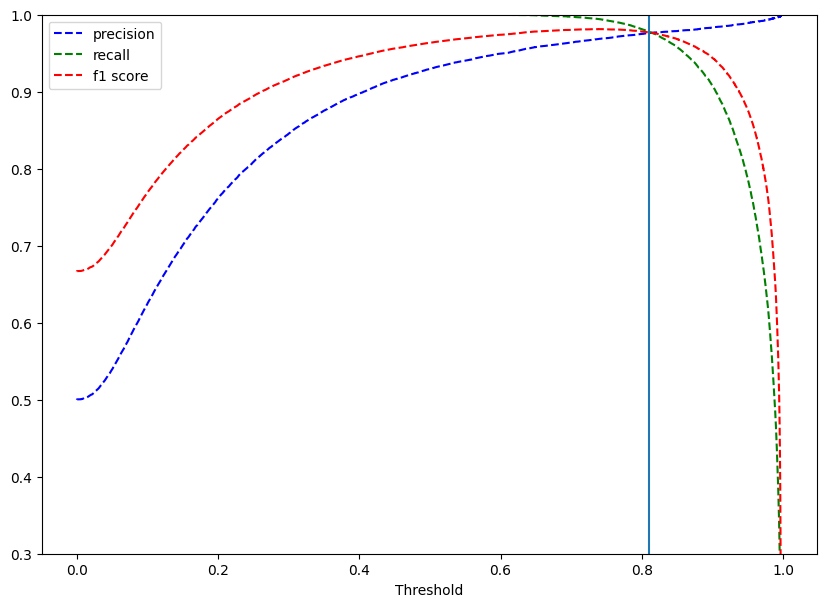

In [133]:
pre_rec_curve_tree(rf, x_train, y_train, threshold=0.81)

AUC: 0.7762


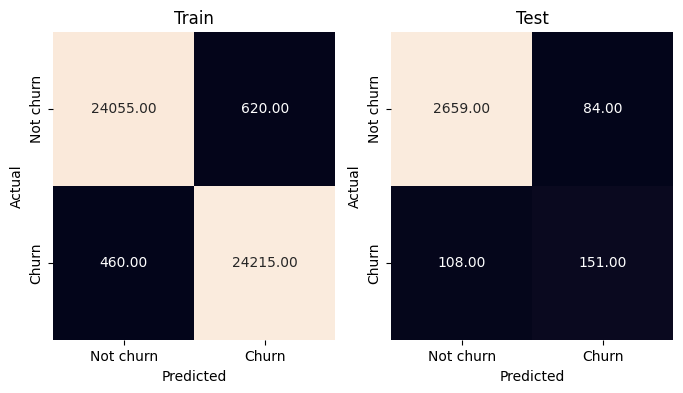

Train
              precision    recall  f1-score   support

           0       0.98      0.97      0.98     24675
           1       0.98      0.98      0.98     24675

    accuracy                           0.98     49350
   macro avg       0.98      0.98      0.98     49350
weighted avg       0.98      0.98      0.98     49350

Test
              precision    recall  f1-score   support

           0       0.96      0.97      0.97      2743
           1       0.64      0.58      0.61       259

    accuracy                           0.94      3002
   macro avg       0.80      0.78      0.79      3002
weighted avg       0.93      0.94      0.93      3002



In [134]:
# Make prediction with adjusted threshold
threshold = .8

yhat_train = rf.predict_proba(x_train)[:,1]>threshold
yhat_test_proba = rf.predict_proba(x_test)[:,1]
yhat_test = yhat_test_proba>threshold

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

In [135]:
# store performance metrics
RF_smote = model_performance('RF_smote', y_test, yhat_test, yhat_test_proba)

## 8.6 AdaBoost (no upsampled)

In [136]:
# X_train_pc, Y_train, X_test_pc, Y_test
x_train = X_train_pc.copy()
y_train = Y_train.copy()
x_test = X_test_pc.copy()
y_test = Y_test.copy()

AUC: 0.7374


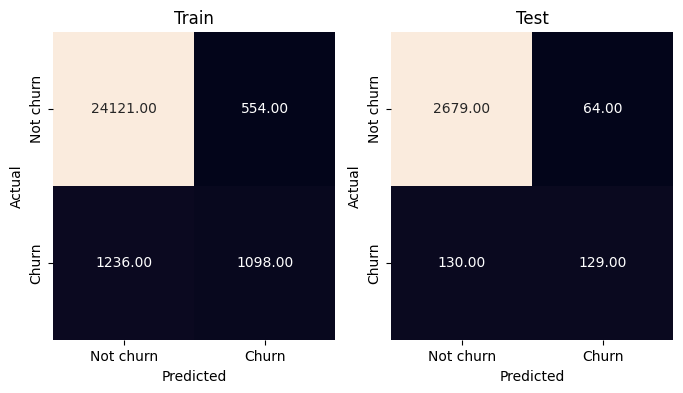

Train
              precision    recall  f1-score   support

           0       0.95      0.98      0.96     24675
           1       0.66      0.47      0.55      2334

    accuracy                           0.93     27009
   macro avg       0.81      0.72      0.76     27009
weighted avg       0.93      0.93      0.93     27009

Test
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2743
           1       0.67      0.50      0.57       259

    accuracy                           0.94      3002
   macro avg       0.81      0.74      0.77      3002
weighted avg       0.93      0.94      0.93      3002



In [137]:
# Train
ada = AdaBoostClassifier(random_state=42)
ada.fit(x_train, y_train)

# Make prediction
yhat_train = ada.predict(x_train)
yhat_test = ada.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

### Hyperparameter tuning

- For AdaBoost, main hyperparameters are n_estimators and learning_rate. n_estimators define the number of weak learners the models will train, and learning_rate define the influence of each weak learner to the final prediction. 
- High n_estimators + low learning rate generally produce better prediction at the cost of training time, while low n_estimators + high learning rate are faster but can be underfitting.

- Random search cross validation on stratified kfold  can be used to search for a set of parameters that both optimize for performance and generalizing to new data.

**Note:** Depends on your machine, if it's taking too long to run, I recommend reducing the n_iter parameters. This will not affect reproducibility of the models, as I already copied the best parameters during my run to the cell below for model building.

In [138]:
%%time
# 6min 55s

# estimator
estimator = AdaBoostClassifier(random_state=42)

# parameter range
params = {'n_estimators': np.arange(50, 501,50),
          'learning_rate': [0.01, 0.1, 1, 10]
         }

# random search
random_search = RandomizedSearchCV(estimator, param_distributions=params, n_iter=10, cv=StratifiedKFold(n_splits=3), scoring='f1', verbose=2)
random_search.fit(x_train, y_train)

Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV] END ...............learning_rate=0.01, n_estimators=250; total time=  17.8s
[CV] END ...............learning_rate=0.01, n_estimators=250; total time=  17.8s
[CV] END ...............learning_rate=0.01, n_estimators=250; total time=  17.8s
[CV] END ..................learning_rate=10, n_estimators=50; total time=   0.4s
[CV] END ..................learning_rate=10, n_estimators=50; total time=   0.5s
[CV] END ..................learning_rate=10, n_estimators=50; total time=   0.5s
[CV] END .................learning_rate=10, n_estimators=350; total time=   2.8s
[CV] END .................learning_rate=10, n_estimators=350; total time=   2.8s
[CV] END .................learning_rate=10, n_estimators=350; total time=   2.9s
[CV] END ..................learning_rate=1, n_estimators=250; total time=  17.8s
[CV] END ..................learning_rate=1, n_estimators=250; total time=  17.8s
[CV] END ..................learning_rate=1, n_es

RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
                   estimator=AdaBoostClassifier(random_state=42),
                   param_distributions={'learning_rate': [0.01, 0.1, 1, 10],
                                        'n_estimators': array([ 50, 100, 150, 200, 250, 300, 350, 400, 450, 500])},
                   scoring='f1', verbose=2)

In [139]:
# print the best set of hyperparameters found by the random search
print("Best hyperparameters: ", random_search.best_params_)
print("Best cross-validation F1 score: ", random_search.best_score_)

Best hyperparameters:  {'n_estimators': 300, 'learning_rate': 1}
Best cross-validation F1 score:  0.5280535769480929


AUC: 0.7111


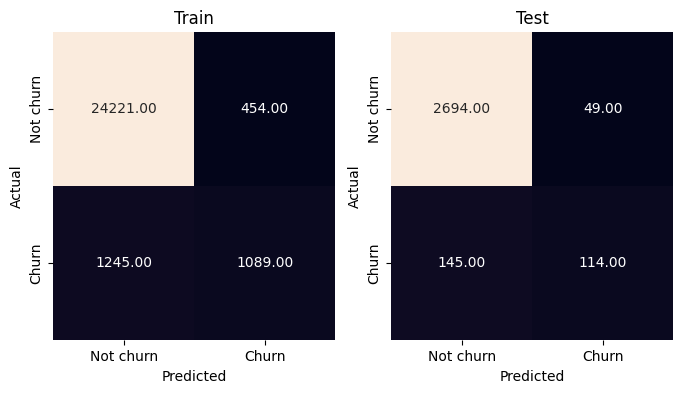

Train
              precision    recall  f1-score   support

           0       0.95      0.98      0.97     24675
           1       0.71      0.47      0.56      2334

    accuracy                           0.94     27009
   macro avg       0.83      0.72      0.76     27009
weighted avg       0.93      0.94      0.93     27009

Test
              precision    recall  f1-score   support

           0       0.95      0.98      0.97      2743
           1       0.70      0.44      0.54       259

    accuracy                           0.94      3002
   macro avg       0.82      0.71      0.75      3002
weighted avg       0.93      0.94      0.93      3002



In [140]:
# Best hyperparameters:  {'n_estimators': 450, 'learning_rate': 0.1}
best_params = {'n_estimators': 450, 'learning_rate': 0.1}

# Train
ada = AdaBoostClassifier(random_state=42, **best_params)
ada.fit(x_train, y_train)

# Make prediction
yhat_train = ada.predict(x_train)
yhat_test_proba = ada.predict_proba(x_test)[:,1]
yhat_test = ada.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

In [141]:
# store performance metrics
ADA_no_upsampled = model_performance('ADA_no_upsampled', y_test, yhat_test, yhat_test_proba)

## 8.7 XGBoost on original correlated features
Since XGBoost can work well (and in somecase better) with a large number of features, we can train one XGB model on the original 150 variables and later compare the difference with training on only 36 PCs.

In [142]:
# X_train_pc, Y_train, X_test_pc, Y_test
x_train = X_train_minmax.copy()
y_train = Y_train.copy()
x_test = X_test_minmax.copy()
y_test = Y_test.copy()

In [143]:
y_train.value_counts()

0    24675
1     2334
Name: Churn, dtype: int64

In [144]:
# weights for xgb model
weights = 24675/2334
weights

10.5719794344473

AUC: 0.8194


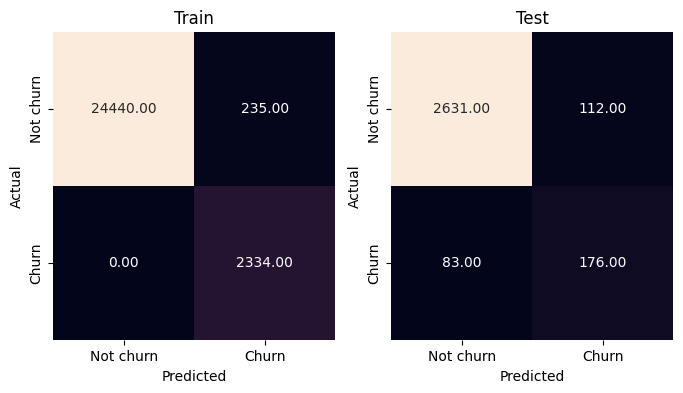

Train
              precision    recall  f1-score   support

           0       1.00      0.99      1.00     24675
           1       0.91      1.00      0.95      2334

    accuracy                           0.99     27009
   macro avg       0.95      1.00      0.97     27009
weighted avg       0.99      0.99      0.99     27009

Test
              precision    recall  f1-score   support

           0       0.97      0.96      0.96      2743
           1       0.61      0.68      0.64       259

    accuracy                           0.94      3002
   macro avg       0.79      0.82      0.80      3002
weighted avg       0.94      0.94      0.94      3002



In [145]:
# Train
xgb = XGBClassifier(scale_pos_weight = weights,random_state=42, eval_metric='logloss')
xgb.fit(x_train, y_train)

# Make prediction
yhat_train = xgb.predict(x_train)
yhat_test = xgb.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

### Hyperparameter tuning

- Similar to AdaBoost, XGBoost also has n_estimators and learning_rate. In addition, it has other parameters to control the complexity and regularization terms to prevent overfitting.

- Random search cross validation on stratified kfold  can be used to search for a set of parameters that both optimize for performance and generalizing to new data.

**Note:** Depends on your machine, if it's taking too long to run, I recommend reducing the n_iter parameters. This will not affect reproducibility of the models, as I already copied the best parameters during my run to the cell below for model building.

In [146]:
%%time
# 10min 21s

# estimator
estimator = XGBClassifier(scale_pos_weight = weights,random_state=42, eval_metric='logloss')

# parameter range
params = { 
    "learning_rate": [0.001, 0.01, 0.1, 1] ,
    "max_depth": range(7,21,2),
    "gamma": np.arange(0,0.5,0.1),
    "colsample_bytree": np.arange(0.3,1,0.1),
    "reg_alpha": [1e-5, 1e-2, 0.1, 1, 10, 100],
    "reg_lambda": [1e-5, 1e-2, 0.1, 1, 10, 100]}

# random search
random_search = RandomizedSearchCV(estimator, param_distributions=params, n_iter=20, cv=StratifiedKFold(n_splits=5), scoring='f1', verbose=1)
random_search.fit(x_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
CPU times: total: 1h 47min 38s
Wall time: 10min 21s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           gpu_id=None, grow_policy=None,...
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=42, ...),
                   n_iter=20,
                   param_distributions={'colsample_bytree': array([0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                        'gamma': array([0. , 0.1, 0.2, 0.3, 0.4]),
                                        'learning_rate': [0.001, 0.01, 0.1, 1],
                                        'max_depth': range(7, 21, 2),
                                        'reg_alpha': [1e-05, 0.01, 0.1, 1, 10,
                                                      100],
                                        'reg_lambda': [1e-05, 0.01, 0.1, 1, 10,
                                                       100]},
                   scoring='f1', verbose=1)

In [147]:
# print the best set of hyperparameters found by the random search
print("Best hyperparameters: ", random_search.best_params_)
print("Best cross-validation F1 score: ", random_search.best_score_)

Best hyperparameters:  {'reg_lambda': 100, 'reg_alpha': 0.01, 'max_depth': 19, 'learning_rate': 0.1, 'gamma': 0.4, 'colsample_bytree': 0.5}
Best cross-validation F1 score:  0.6697819657010726


AUC: 0.8597


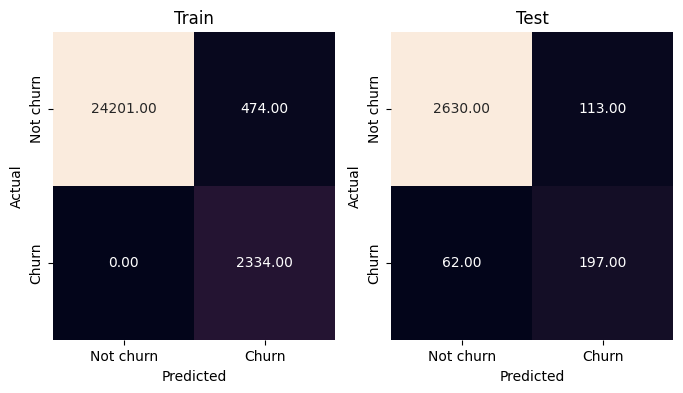

Train
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     24675
           1       0.83      1.00      0.91      2334

    accuracy                           0.98     27009
   macro avg       0.92      0.99      0.95     27009
weighted avg       0.99      0.98      0.98     27009

Test
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      2743
           1       0.64      0.76      0.69       259

    accuracy                           0.94      3002
   macro avg       0.81      0.86      0.83      3002
weighted avg       0.95      0.94      0.94      3002



In [148]:
best_params = {'reg_lambda': 1, 'reg_alpha': 10, 'max_depth': 11, 'learning_rate': 0.1, 'gamma': 0.3, 'colsample_bytree': 0.4}

# Train
xgb = XGBClassifier(scale_pos_weight = weights,random_state=42, **best_params)
xgb.fit(x_train, y_train)

# Make prediction
yhat_train = xgb.predict(x_train)
yhat_test_proba = xgb.predict_proba(x_test)[:,1]
yhat_test = xgb.predict(x_test)


# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

In [149]:
# store performance metrics
XGB_no_pc = model_performance('XGB_no_pc', y_test, yhat_test, yhat_test_proba)

## 8.8 XGBoost trained with PCs

In [150]:
# X_train_pc, Y_train, X_test_pc, Y_test
x_train = X_train_pc.copy()
y_train = Y_train.copy()
x_test = X_test_pc.copy()
y_test = Y_test.copy()

In [151]:
y_train.value_counts()

0    24675
1     2334
Name: Churn, dtype: int64

In [152]:
weights = 24675/2334
weights

10.5719794344473

AUC: 0.8004


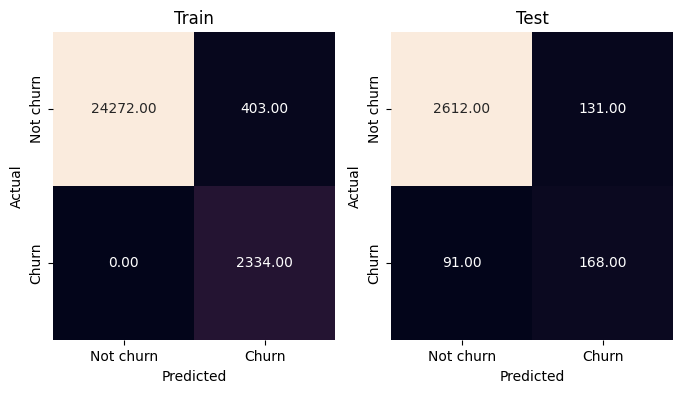

Train
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     24675
           1       0.85      1.00      0.92      2334

    accuracy                           0.99     27009
   macro avg       0.93      0.99      0.96     27009
weighted avg       0.99      0.99      0.99     27009

Test
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      2743
           1       0.56      0.65      0.60       259

    accuracy                           0.93      3002
   macro avg       0.76      0.80      0.78      3002
weighted avg       0.93      0.93      0.93      3002



In [153]:
# Train
xgb = XGBClassifier(scale_pos_weight = weights,random_state=42, eval_metric='logloss')
xgb.fit(x_train, y_train)

# Make prediction
yhat_train = xgb.predict(x_train)
yhat_test = xgb.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

### Hyperparameter tuning

In [154]:
%%time
#  5min 36s

# estimator
estimator = XGBClassifier(scale_pos_weight = weights,random_state=42, eval_metric='logloss')

# parameter range
params = { 
    "learning_rate": [0.001, 0.01, 0.1, 1] ,
    "max_depth": range(7,21,2),
    "gamma": np.arange(0,0.5,0.1),
    "colsample_bytree": np.arange(0.3,1,0.1),
    "reg_alpha": [1e-5, 1e-2, 0.1, 1, 10, 100],
    "reg_lambda": [1e-5, 1e-2, 0.1, 1, 10, 100]}

# random search


random_search = RandomizedSearchCV(estimator, param_distributions=params, n_iter=20, cv=StratifiedKFold(n_splits=5), scoring='f1', verbose=1)
random_search.fit(x_train, y_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits
CPU times: total: 57min 36s
Wall time: 5min 28s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           gpu_id=None, grow_policy=None,...
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=42, ...),
                   n_iter=20,
                   param_distributions={'colsample_bytree': array([0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                        'gamma': array([0. , 0.1, 0.2, 0.3, 0.4]),
                                        'learning_rate': [0.001, 0.01, 0.1, 1],
                                        'max_depth': range(7, 21, 2),
                                        'reg_alpha': [1e-05, 0.01, 0.1, 1, 10,
                                                      100],
                                        'reg_lambda': [1e-05, 0.01, 0.1, 1, 10,
                                                       100]},
                   scoring='f1', verbose=1)

In [155]:
# print the best set of hyperparameters found by the random search
print("Best hyperparameters: ", random_search.best_params_)
print("Best cross-validation F1 score: ", random_search.best_score_)

Best hyperparameters:  {'reg_lambda': 0.1, 'reg_alpha': 0.01, 'max_depth': 9, 'learning_rate': 0.01, 'gamma': 0.1, 'colsample_bytree': 0.5}
Best cross-validation F1 score:  0.6208696872614273


AUC: 0.8319


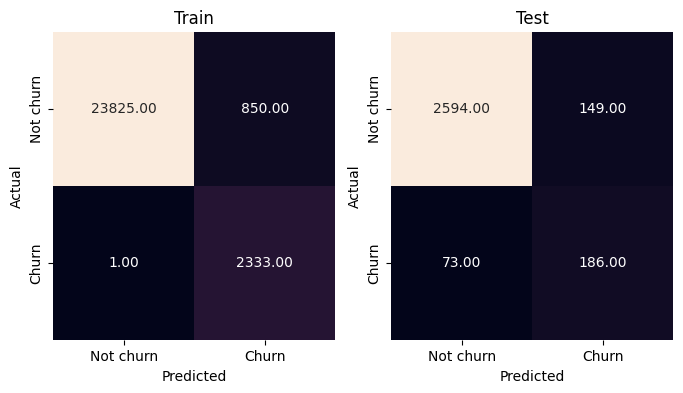

Train
              precision    recall  f1-score   support

           0       1.00      0.97      0.98     24675
           1       0.73      1.00      0.85      2334

    accuracy                           0.97     27009
   macro avg       0.87      0.98      0.91     27009
weighted avg       0.98      0.97      0.97     27009

Test
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      2743
           1       0.56      0.72      0.63       259

    accuracy                           0.93      3002
   macro avg       0.76      0.83      0.79      3002
weighted avg       0.94      0.93      0.93      3002



In [156]:

best_params = {'reg_lambda': 1, 'reg_alpha': 1, 'max_depth': 7, 'learning_rate': 0.1, 'gamma': 0.4, 'colsample_bytree': 0.5}

# Train
xgb = XGBClassifier(scale_pos_weight = 10.6,random_state=42,eval_metric='logloss', **best_params) 
xgb.fit(x_train, y_train)

# Make prediction
yhat_train = xgb.predict(x_train)
yhat_test_proba = xgb.predict_proba(x_test)[:,1]
yhat_test = xgb.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

In [157]:
# store performance metrics
XGB_pc = model_performance('XGB_pc', y_test, yhat_test, yhat_test_proba)

## 8.9 XGBoost + PCs + SMOTE

### Handle data imbalance with SMOTE

In [192]:
# SMOTE
smote = SMOTE(random_state=42, k_neighbors=5)
X_train_ups, y_train_ups = smote.fit_resample(X_train_pc, Y_train)

In [193]:
X_train_ups.shape, y_train_ups.shape, y_train_ups.value_counts()

((49350, 36),
 (49350,),
 0    24675
 1    24675
 Name: Churn, dtype: int64)

In [194]:
x_train = X_train_ups
y_train = y_train_ups

x_test = X_test_pc.copy()
y_test = Y_test.copy()

### Build model

AUC: 0.8082


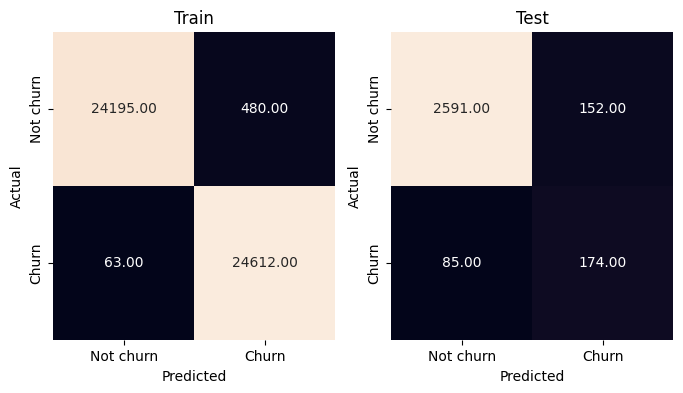

Train
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     24675
           1       0.98      1.00      0.99     24675

    accuracy                           0.99     49350
   macro avg       0.99      0.99      0.99     49350
weighted avg       0.99      0.99      0.99     49350

Test
              precision    recall  f1-score   support

           0       0.97      0.94      0.96      2743
           1       0.53      0.67      0.59       259

    accuracy                           0.92      3002
   macro avg       0.75      0.81      0.78      3002
weighted avg       0.93      0.92      0.93      3002



In [195]:
# Train
xgb = XGBClassifier(random_state=42, eval_metric='logloss')
xgb.fit(x_train, y_train)

# Make prediction
yhat_train = xgb.predict(x_train)
yhat_test = xgb.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

### Hyperparameter tuning

In [163]:
%%time
# 8min 19s

# estimator
estimator = XGBClassifier(random_state=42, eval_metric='logloss')

# parameter range
params = { 
    "learning_rate": [0.001, 0.01, 0.1, 1] ,
    "max_depth": range(7,21,2),
    "gamma": np.arange(0,0.5,0.1),
    "colsample_bytree": np.arange(0.3,1,0.1),
    "reg_alpha": [1e-3, 1e-2, 0.1, 1, 10, 100],
    "reg_lambda": [1e-3, 1e-2, 0.1, 1, 10, 100]}

# random search

random_search = RandomizedSearchCV(estimator, param_distributions=params, n_iter=20, cv=StratifiedKFold(n_splits=4), scoring='f1', verbose=1)
random_search.fit(x_train, y_train)

Fitting 4 folds for each of 20 candidates, totalling 80 fits
CPU times: total: 1h 37min 46s
Wall time: 9min 5s


RandomizedSearchCV(cv=StratifiedKFold(n_splits=4, random_state=None, shuffle=False),
                   estimator=XGBClassifier(base_score=None, booster=None,
                                           callbacks=None,
                                           colsample_bylevel=None,
                                           colsample_bynode=None,
                                           colsample_bytree=None,
                                           early_stopping_rounds=None,
                                           enable_categorical=False,
                                           eval_metric='logloss',
                                           feature_types=None, gamma=None,
                                           gpu_id=None, grow_policy=None,...
                                           n_estimators=100, n_jobs=None,
                                           num_parallel_tree=None,
                                           predictor=None, random_state=42, ...),
                   n_iter=20,
                   param_distributions={'colsample_bytree': array([0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]),
                                        'gamma': array([0. , 0.1, 0.2, 0.3, 0.4]),
                                        'learning_rate': [0.001, 0.01, 0.1, 1],
                                        'max_depth': range(7, 21, 2),
                                        'reg_alpha': [0.001, 0.01, 0.1, 1, 10,
                                                      100],
                                        'reg_lambda': [0.001, 0.01, 0.1, 1, 10,
                                                       100]},
                   scoring='f1', verbose=1)

In [164]:
# print the best set of hyperparameters found by the random search
print("Best hyperparameters: ", random_search.best_params_)
print("Best cross-validation F1 score: ", random_search.best_score_)

Best hyperparameters:  {'reg_lambda': 0.01, 'reg_alpha': 0.001, 'max_depth': 15, 'learning_rate': 0.1, 'gamma': 0.1, 'colsample_bytree': 0.7000000000000002}
Best cross-validation F1 score:  0.9674040844024248


AUC: 0.8378


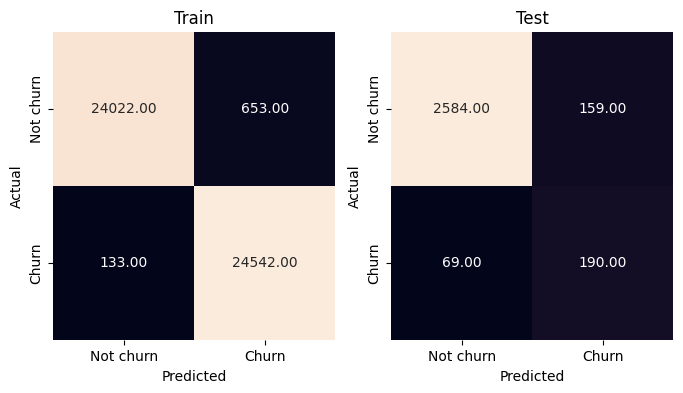

Train
              precision    recall  f1-score   support

           0       0.99      0.97      0.98     24675
           1       0.97      0.99      0.98     24675

    accuracy                           0.98     49350
   macro avg       0.98      0.98      0.98     49350
weighted avg       0.98      0.98      0.98     49350

Test
              precision    recall  f1-score   support

           0       0.97      0.94      0.96      2743
           1       0.54      0.73      0.62       259

    accuracy                           0.92      3002
   macro avg       0.76      0.84      0.79      3002
weighted avg       0.94      0.92      0.93      3002



In [215]:
# best parameter, may be different from result above due to randomness
best_params = {'reg_lambda': 0.01, 'reg_alpha': 10, 'max_depth': 11, 'learning_rate': 0.1, 'gamma': 0.1, 'colsample_bytree': 0.7}

# Train
xgb = XGBClassifier(random_state=42,eval_metric='logloss', **best_params) 
xgb.fit(x_train, y_train)

# Make prediction
yhat_train = xgb.predict(x_train)
yhat_test_proba = xgb.predict_proba(x_test)[:,1]
yhat_test = xgb.predict(x_test)

# Confusion matrix/report
cm_report(y_train, yhat_train, y_test, yhat_test)

In [216]:
# store performance metrics
XGB_smote = model_performance('XGB_smote', y_test, yhat_test, yhat_test_proba)

## Comparing models

In [217]:
model_results = [LG_no_upsampled, LG_smote, LG_adasyn, RF_no_upsampled, RF_smote, ADA_no_upsampled, XGB_no_pc, XGB_pc, XGB_smote]

In [218]:
model_metrics = pd.DataFrame()
for result in model_results:
    model_metrics = pd.concat([model_metrics, pd.DataFrame(result[0]).T], ignore_index=True)    
model_metrics.columns = ['Model', 'Accuracy', 'F1', 'Precision', 'Recall', 'AUC']

model_metrics

,Model,Accuracy,F1,Precision,Recall,AUC
0,LG_no_upsampled,0.931046,0.604207,0.598485,0.610039,0.785697
1,LG_smote,0.930713,0.592157,0.601594,0.583012,0.773278
2,LG_adasyn,0.926716,0.556452,0.582278,0.532819,0.748363
3,RF_no_upsampled,0.934044,0.62782,0.611722,0.644788,0.803072
4,RF_smote,0.936043,0.611336,0.642553,0.583012,0.776194
5,ADA_no_upsampled,0.935376,0.540284,0.699387,0.440154,0.711145
6,XGB_no_pc,0.941706,0.692443,0.635484,0.760618,0.859711
7,XGB_pc,0.926049,0.626263,0.555224,0.718147,0.831913
8,XGB_smote,0.924051,0.625,0.544413,0.733591,0.837813


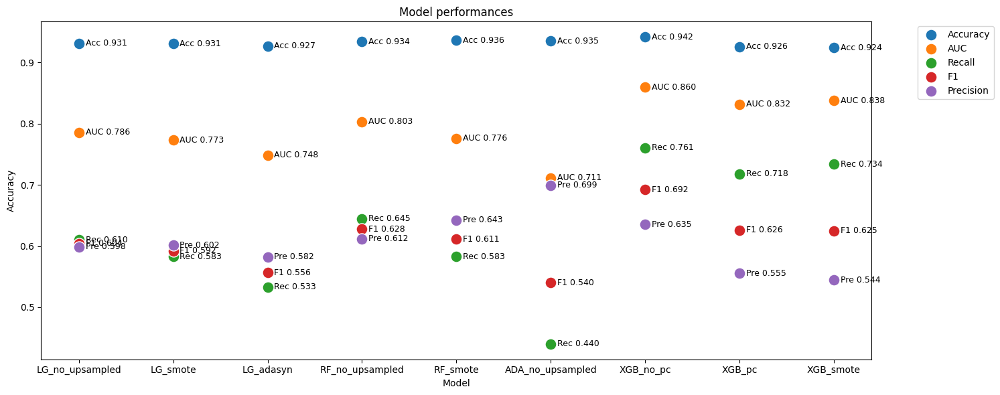

In [219]:
# plot model performance metrics visually
plt.figure(figsize=(15,6))
for metric in ['Accuracy', 'AUC','Recall', 'F1','Precision']:
    sns.scatterplot(data=model_metrics, x='Model', y=metric, label=metric, s=150)
    for x,y in zip(np.arange(0,len(model_metrics[metric])+1),model_metrics[metric]):
        plt.annotate(f'{metric[:3]} {y:.3f}', (x+0.07,y), fontsize=9, ha='left', va='center')
                   
plt.legend(bbox_to_anchor=(1.05, 1))
plt.title('Model performances')
plt.tight_layout()

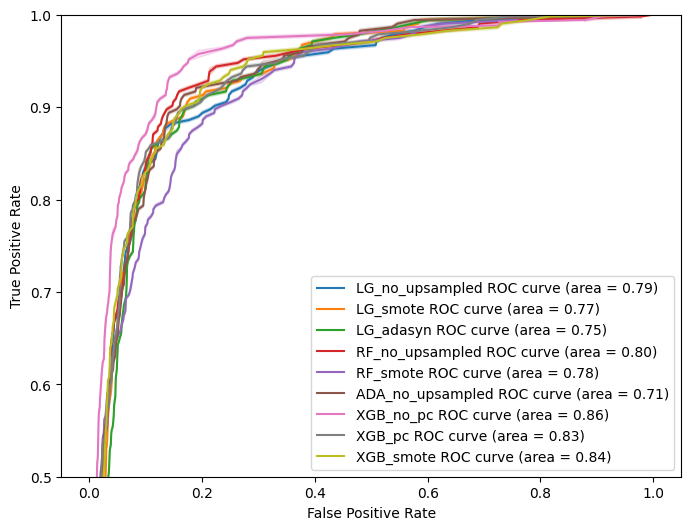

In [220]:
# ROC AUC curve
plt.figure(figsize=(8,6))
for result in model_results:
    y_test  = result[1]
    yhat_proba = result[2]
    model_name = result[0][0]
    auc_score = result[0][-1]
    fpr, tpr, _ = roc_curve(y_test,  yhat_proba)
    sns.lineplot(x=fpr,y=tpr, label=model_name + ' ROC curve (area = %0.2f)' % auc_score)
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.legend(loc="lower right")
plt.ylim(0.5,1)
plt.show()    

Summary:
- For logistic regression, training on original data gave better result than smote/adasyn. Similar for random forest.
- XGBoost had the best overall performance, on all 3 versions of training data: (full features data, PCs and PCs+ SMOTE).
- XGBoost on full features data, unsurprisingly, has the best overall performance across all important metrics (F1, AUC, Recall)
- Runner up is XGBoost + PCs+SMOTE.
- AdaBoost takes the most time to run while the result is among the lowest.

## Final model 

Final model: **XGBoost + PCs + SMOTE.**


- Recall
- Precision
- F1 score
- AUC


AUC: 0.8378


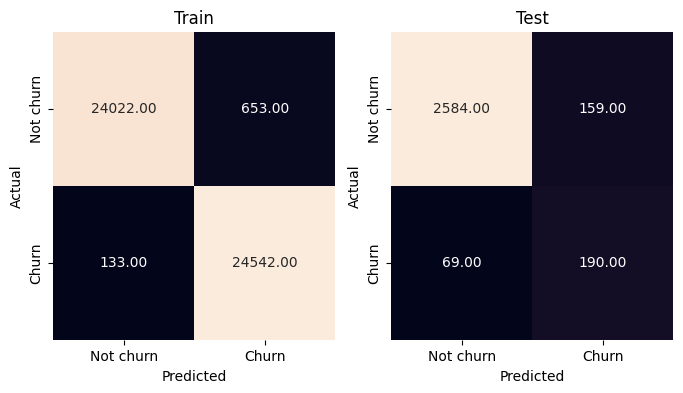

Train
              precision    recall  f1-score   support

           0       0.99      0.97      0.98     24675
           1       0.97      0.99      0.98     24675

    accuracy                           0.98     49350
   macro avg       0.98      0.98      0.98     49350
weighted avg       0.98      0.98      0.98     49350

Test
              precision    recall  f1-score   support

           0       0.97      0.94      0.96      2743
           1       0.54      0.73      0.62       259

    accuracy                           0.92      3002
   macro avg       0.76      0.84      0.79      3002
weighted avg       0.94      0.92      0.93      3002



In [221]:
cm_report(y_train, yhat_train, y_test, yhat_test)

### Reason:
- **XGBoost + PCs + SMOTE** model was recommended for its good F1 score, good Recall and AUC score.
- While **XGBoost on original features** has the best F1 score, it requires 150 variables for making prediction (vs 36 of XGBoost with SMOTE), which increases computational cost by a large amount for a small gain in prediction.

# 9. Model for feature explanation

## 9.1 Build models

### Load original variables

In [172]:
df = pd.read_csv('derived_features.csv')

In [173]:
X = df.drop(columns='Churn')
Y = df.Churn

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, stratify = Y, test_size=0.1, random_state=42)

- No PCA here because we want to identify important predictor attributes.
- No scaling or multicollinearity handling is required with decision tree model.

### Baseline model

AUC: 0.8103


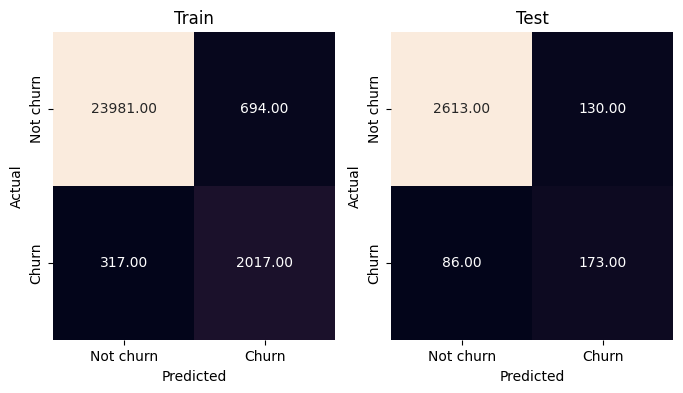

Train
              precision    recall  f1-score   support

           0       0.99      0.97      0.98     24675
           1       0.74      0.86      0.80      2334

    accuracy                           0.96     27009
   macro avg       0.87      0.92      0.89     27009
weighted avg       0.97      0.96      0.96     27009

Test
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      2743
           1       0.57      0.67      0.62       259

    accuracy                           0.93      3002
   macro avg       0.77      0.81      0.79      3002
weighted avg       0.93      0.93      0.93      3002



In [174]:
# baseline model
tree = DecisionTreeClassifier(class_weight={0: 0.3, 1: 0.6}, max_depth=10, random_state=42)

# train
tree.fit(X_train, Y_train)

# Make prediction
yhat_train = tree.predict(X_train)
yhat_test = tree.predict(X_test)

# Confusion matrix/report
cm_report(Y_train, yhat_train, Y_test, yhat_test)

### Hyperparameter tuning

In [175]:
%%time
# estimator
estimator = DecisionTreeClassifier(class_weight={0: 0.3, 1: 0.6}, random_state=42)

# parameter range
params = {"max_depth": np.arange(7,15),
          "min_samples_split": np.arange(5, 100),
          "min_samples_leaf": np.arange(2, 50),
          "ccp_alpha": [1e-3,1e-2,0.1]
         }

# random search
random_search = RandomizedSearchCV(estimator, param_distributions=params, n_iter=25, cv=StratifiedKFold(n_splits=3), scoring='f1', verbose=2)
random_search.fit(X_train, Y_train)

Fitting 3 folds for each of 25 candidates, totalling 75 fits
[CV] END ccp_alpha=0.01, max_depth=7, min_samples_leaf=15, min_samples_split=71; total time=   0.9s
[CV] END ccp_alpha=0.01, max_depth=7, min_samples_leaf=15, min_samples_split=71; total time=   0.9s
[CV] END ccp_alpha=0.01, max_depth=7, min_samples_leaf=15, min_samples_split=71; total time=   0.9s
[CV] END ccp_alpha=0.001, max_depth=8, min_samples_leaf=29, min_samples_split=20; total time=   1.0s
[CV] END ccp_alpha=0.001, max_depth=8, min_samples_leaf=29, min_samples_split=20; total time=   1.0s
[CV] END ccp_alpha=0.001, max_depth=8, min_samples_leaf=29, min_samples_split=20; total time=   1.0s
[CV] END ccp_alpha=0.01, max_depth=14, min_samples_leaf=11, min_samples_split=63; total time=   1.5s
[CV] END ccp_alpha=0.01, max_depth=14, min_samples_leaf=11, min_samples_split=63; total time=   1.5s
[CV] END ccp_alpha=0.01, max_depth=14, min_samples_leaf=11, min_samples_split=63; total time=   1.6s
[CV] END ccp_alpha=0.01, max_dept

RandomizedSearchCV(cv=StratifiedKFold(n_splits=3, random_state=None, shuffle=False),
                   estimator=DecisionTreeClassifier(class_weight={0: 0.3,
                                                                  1: 0.6},
                                                    random_state=42),
                   n_iter=25,
                   param_distributions={'ccp_alpha': [0.001, 0.01, 0.1],
                                        'max_depth': array([ 7,  8,  9, 10, 11, 12, 13, 14]),
                                        'min_samples_leaf': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18,
       19, 20, 21, 22, 23, 24, 25...
       36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49]),
                                        'min_samples_split': array([ 5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21,
       22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38,
       39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55,
       56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72,
       73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89,
       90, 91, 92, 93, 94, 95, 96, 97, 98, 99])},
                   scoring='f1', verbose=2)

In [176]:
# print the best set of hyperparameters found by the random search
print("Best hyperparameters: ", random_search.best_params_)
print("Best cross-validation F1 score: ", random_search.best_score_)

Best hyperparameters:  {'min_samples_split': 20, 'min_samples_leaf': 29, 'max_depth': 8, 'ccp_alpha': 0.001}
Best cross-validation F1 score:  0.6165089989786222


AUC: 0.8334


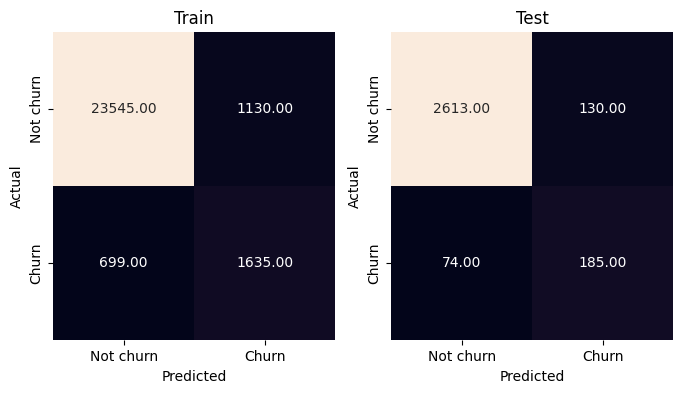

Train
              precision    recall  f1-score   support

           0       0.97      0.95      0.96     24675
           1       0.59      0.70      0.64      2334

    accuracy                           0.93     27009
   macro avg       0.78      0.83      0.80     27009
weighted avg       0.94      0.93      0.93     27009

Test
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      2743
           1       0.59      0.71      0.64       259

    accuracy                           0.93      3002
   macro avg       0.78      0.83      0.80      3002
weighted avg       0.94      0.93      0.94      3002



In [177]:
# best parameters by randomsearch, may be different from result above due to randomness.
best_params = {'min_samples_split': 48, 'min_samples_leaf': 10, 'max_depth': 14, 'ccp_alpha': 0.001} # best balance

# alternative best_params = {'min_samples_split': 76, 'min_samples_leaf': 33, 'max_depth': 8, 'ccp_alpha': 0.001}, similar performance

tree = DecisionTreeClassifier(class_weight={0: 0.3, 1: 0.6}, random_state=42, **best_params)

# train
tree.fit(X_train, Y_train)

# Make prediction
yhat_train = tree.predict(X_train)
yhat_test = tree.predict(X_test)

# Confusion matrix/report
cm_report(Y_train, yhat_train, Y_test, yhat_test)

- Overfitting eliminated, now has very similar performance in term of F1, recall and accuracy between train and test data.
- Increased in both recall and precision compared to the baseline model, thus increase in F1 as a result.

## 9.2 Feature importance

### Plot tree

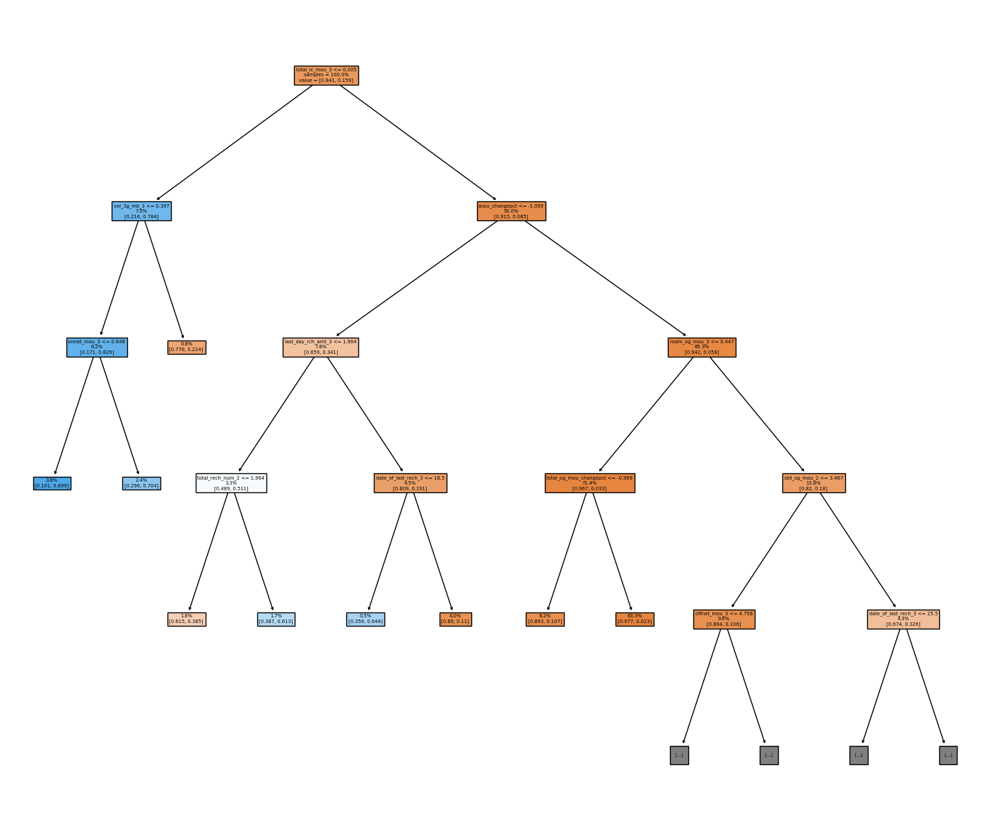

In [178]:
plt.figure(figsize=(18,15))
ax = plot_tree(
    tree,
    feature_names = df.columns,
    label='root',
    impurity =False,
    proportion = True,
    max_depth=4,
    filled=True)

### Feature importance

In [179]:
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': tree.feature_importances_
}).sort_values('Importance', ascending=False)
feature_importance[feature_importance.Importance>0].reset_index()

,index,Feature,Importance
0,80,total_ic_mou_3,0.683963
1,139,total_ic_mou_changepct,0.092476
2,110,vol_3g_mb_3,0.039791
3,101,date_of_last_rech_3,0.039053
4,14,roam_og_mou_3,0.037409
5,104,last_day_rch_amt_3,0.032732
6,40,std_og_mou_2,0.022635
7,5,onnet_mou_3,0.012595
8,13,roam_og_mou_2,0.008520
9,8,offnet_mou_3,0.007904


<AxesSubplot: xlabel='Importance', ylabel='Feature'>

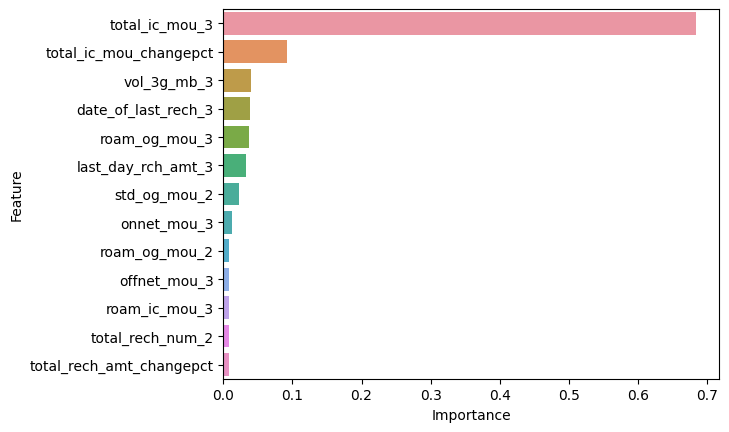

In [180]:
# plot feature importances
sns.barplot(feature_importance[feature_importance.Importance>0].reset_index(), x='Importance', y='Feature')

**Top features to identify churners:**
- total_ic_mou_3, the most important feature
- total_ic_mou_changepct
- vol_3g_mb_3
- roam_og_mou_3
- date_of_last_rech_3
- last_day_rch_amt_3
- std_og_mou_2

Detailed insights regarding these features are presented below, under "Signs of churners".

# 10. Recommendations to manage customer churn

## Signs of churners (based on Decision Tree model):

In [181]:
# function for plotting usage trend
def usage_trend(feature):
    total = pd.melt(df[[feature+'_1', feature+'_2', feature+'_3']], var_name='month', value_name='value', ignore_index=True)
    total.month = total.month.apply(lambda x: int(x[-1:]))
    total['Churn'] = pd.concat([df.Churn]*3, ignore_index=True)
    plt.figure(figsize=(6,2))
    sns.barplot(data=total, x='Churn', y='value', hue='month')
    plt.title(feature)
    plt.legend(title='month',bbox_to_anchor=(1.2,1))
    plt.show()

- **1/ Low incoming call amount** in the 3rd month

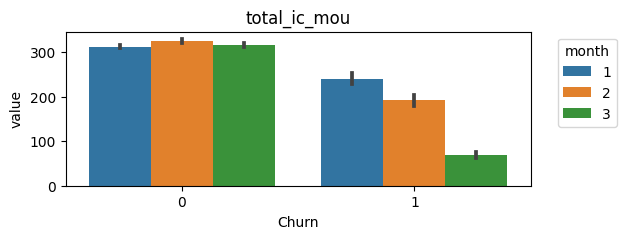

In [182]:
usage_trend('total_ic_mou')

- **2/ Decreased incoming calls** (negative percent change) comparing to the first 2 months

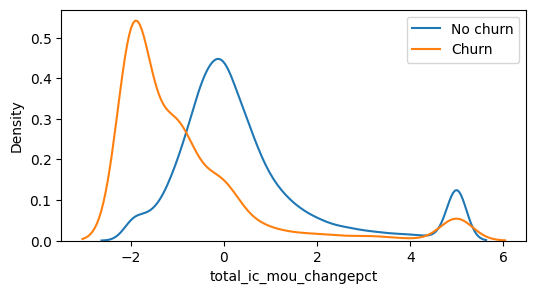

In [183]:
plt.figure(figsize=(6,3))
sns.kdeplot(x=df.total_ic_mou_changepct[df.Churn==0], label='No churn')
sns.kdeplot(x=df.total_ic_mou_changepct[df.Churn==1], label='Churn')
plt.legend()

- **3/ Low 3g data usage** in the 3rd month

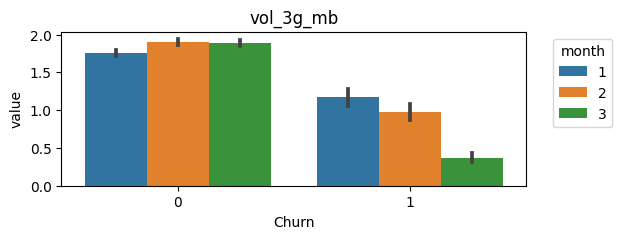

In [184]:
usage_trend('vol_3g_mb')

- **4/ Stop recharging balance** or **low recharge amount** in the 3rd month

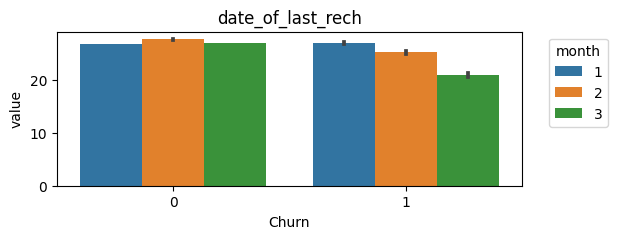

In [185]:
usage_trend('date_of_last_rech')

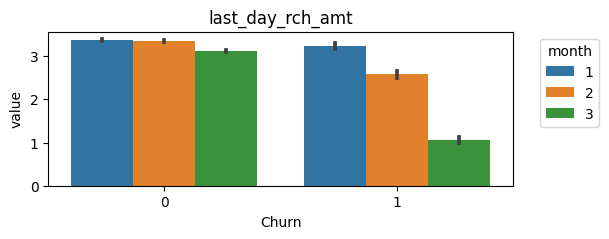

In [186]:
usage_trend('last_day_rch_amt')

- **5/ Increase in roaming outgoing calls** in the 3rd month

This is the only service that see an increase in usage among churners. Reason could be that there are customers who moved to another country and later adopt a local service provider to reduce roaming cost.

In [187]:
# mean roaming outgoing usage between churners and non churner
df[['roam_og_mou_1', 'roam_og_mou_2', 'roam_og_mou_3', 'Churn']].groupby('Churn').mean()

,roam_og_mou_1,roam_og_mou_2,roam_og_mou_3
Churn,,,
0,0.506854,0.382239,0.372501
1,0.657453,0.854696,0.937163


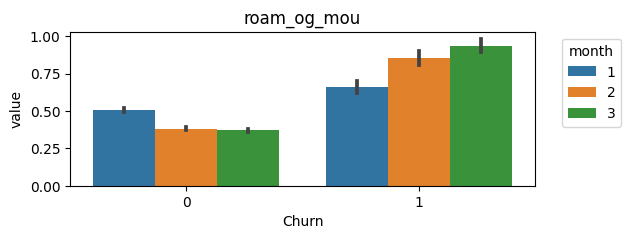

In [188]:
usage_trend('roam_og_mou')

- 6/ High amount of **outgoing calls to other networks** ('std_og_mou')

Churners have higher average of outside-network outgoing calls (std_og) than local networks ones (loc_og). This can indicate that the churners' social circle/most contacts are using other network providers, and they want to switch to be the same networks as theirs.

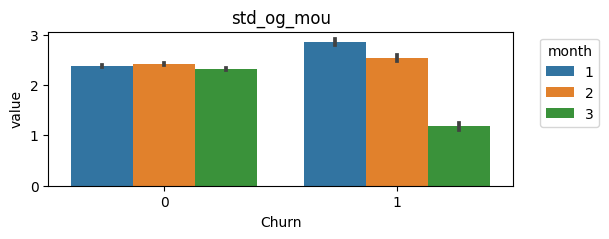

In [189]:
usage_trend('std_og_mou')

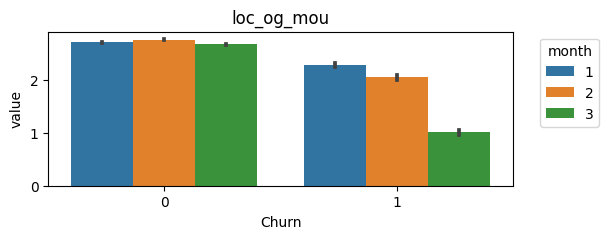

In [190]:
usage_trend('loc_og_mou')

- (worth noting): Increase in **outgoing call to its own call center in the 2nd month**

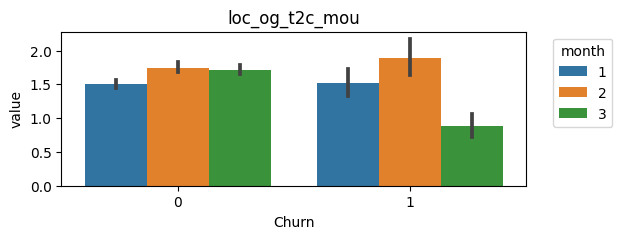

In [191]:
# outgoing calls to its own call center 
usage_trend('loc_og_t2c_mou')

## Reasons for churning:
- Dissatisfaction with service/churn decision might already had started in/before the first month, which led to the reduced usage in 2nd and 3rd month (seen in EDA and confirmed with decision tree model). 
- Most importance signs of churner to look out for are clearly presented and visualized above.
- Churners may want to switch to be on the same provider as their social circle, which may have more promotion/discount for in-network calls.
- Besides churners that switch to other local competitors, there are churners who moved to another country and later adopt its local service providers instead.
- While not an important feature based on the decision tree model, it's worth noting that the churner tend to have increased calls to their own call center (T2C) in the 2nd month. The customers's issue might have remained  unresolved even after contacting support which led to churning.

## Strategies for managing churn among high value customers
- Have promotion package/plans for HVC who mainly make calls to outside-networks
- Prioritize helpline for solving their problems
- Monitor decrease in usage (call quality, 3G data, roaming outgoing calls) and have survey to identify customer dissatisfaction
- Among customers with high roaming usage, try to identify if they are frequent flyers and offer promotion roaming package.

For choosing model to predict churners:
- **XGBoost with SMOTE** model was recommended because it has the best overall performance, high F1 score while able to maintain a good balance between Recall/Precision and computational cost (in term of required features) than other models.


***
End of analysis. Thank you.